## Process Data from Sept Cruise (Sept 4-9) for Analysis

In [1]:
import matplotlib.pyplot as plt
import xarray as xr
import numpy as np

import hvplot.xarray


import cartopy.crs as crs

import pandas as pd
import glob
import hvplot.pandas  # noqa
from datetime import timedelta
from datetime import datetime
from matplotlib.patches import Ellipse

In [184]:
data_src='data/'

#### Pull in CDOM data and ship TSG/GPS data

CDOM data here is from the fCDOM recorded using a DataQ

In [2]:
path = data_src+'wscd859/' # use your path
all_files = glob.glob(path + "/*.csv")

li = []

for filename in all_files:
    df_tmp = pd.read_csv(filename, index_col=None, header=1)
    li.append(df_tmp)
cdom_df = pd.concat(li, axis=0, ignore_index=True)

cdom_df['utc_dt'] = pd.to_datetime(cdom_df['yyyy/mm/dd HH:MM:SS.fff'])

cdom_df = cdom_df.set_index('utc_dt')

In [3]:
# need to remove duplicates to match up to tsg data
cdom_df = cdom_df.loc[~cdom_df.index.duplicated(keep='first')]
cdom_df = cdom_df.sort_index(ascending=True)

This navigation and TSG data is from the R/V Shearwater's nav system and the Seabird TSG on the flow through

In [4]:
nav_df = pd.read_csv(data_src+'SW21011R_RFP/Navigation/SW-GGA_20210904-222337.Raw',  names=['Date', 'Time', 'GPGGA','Unknown', 'SW-GGA-Lat', 'latdir', 'SW-GGA-Long', 'londir', '1', '2', '3', '4', '5', '6', '7'])

def dms2dd(degrees, minutes, seconds, direction):
    dd = degrees + minutes/60 + seconds/(60*60);
    if direction == 'W' or direction == 'S':
        dd *= -1
    return dd;

nav_df['lon'] = dms2dd(pd.to_numeric(nav_df['SW-GGA-Long'].astype(str).str[:2]).astype(float), pd.to_numeric(nav_df['SW-GGA-Long'].astype(str).str[2:]),np.array(0), 'W')
nav_df['lat'] = dms2dd(pd.to_numeric(nav_df['SW-GGA-Lat'].astype(str).str[:2]).astype(float), pd.to_numeric(nav_df['SW-GGA-Lat'].astype(str).str[2:]),np.array(0), 'E')

In [5]:
date_time_strs = nav_df['Date'] + ' ' + nav_df['Time']

nav_df['datetime'] = [datetime.strptime(x, '%m/%d/%Y %H:%M:%S.%f') for x in date_time_strs]
nav_df['utc_dt'] = nav_df['datetime']
nav_df  = nav_df.set_index('utc_dt')
tsg_df = pd.read_csv(data_src+'SW21011R_RFP/TSG/TSG-_20210904-222337.Raw', names=['DateTime', 'Temp','Sal','Unknown'], delim_whitespace=True)#sep=r"s*")# names=['Date', 'Time', 'Data'])
tsg_df
tsg_df['datetime'] = [datetime.strptime(x[:-1], '%m/%d/%Y,%H:%M:%S.%f') for x in tsg_df.DateTime]

lats = []
lons = []
for i in range(len(tsg_df)):
    row = nav_df.iloc[nav_df.index.get_loc(tsg_df.iloc[i].datetime, method='nearest')]
    lats.append(row.lat)
    lons.append(row.lon)
tsg_df['lat'] = lats
tsg_df['lon'] = lons

In [6]:
tsg_df['utc_dt'] = tsg_df['datetime']
tsg_df  = tsg_df.set_index('utc_dt')

In [7]:
tsg_df = tsg_df.sort_index(ascending=True)

In [10]:
# tsg_df = pd.read_csv('sept_4_9_ship_data_geolocated.csv')

<AxesSubplot:>

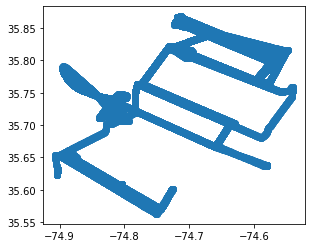

In [11]:
import geopandas as gpd

tsg_gdf = gpd.GeoDataFrame(
    tsg_df, geometry=gpd.points_from_xy(tsg_df.lon, tsg_df.lat))
tsg_gdf.loc['2021-09-5 11:00:00':'2021-09-8 20:45:00'].plot()

### Pull in FCM Data

Updated FCM data from June 2022

In [12]:
fcm_update_df = pd.read_csv(data_src+'SWPhytoplankton_combined_DEH 21June22_edited.csv')

In [13]:
fcm_df = pd.read_csv(data_src+'SW_fcm_full_bac_chla.csv')

In [14]:
# this is a stupid way to do this but I don't know a more efficient way without doing it manually

In [15]:
SynA = []
SynB = []
PicocyanoA = []
PicocyanoB = []
PicoeukA = []
PicoeukB = []
DetritusA = []
DetritusB = []

SynredfluA = []
SynredfluB = []
SynorangefluA = []
SynorangefluB = []
PicoredfluA = []
PicoredfluB = []
PicoeukredfluA = []
PicoeukredfluB = []



for row in fcm_update_df.itertuples(index=False):
    if 'A' in row.SAMPLE_ID:
        SynA.append(row.Syn_cells_mL_1)
        PicocyanoA.append(row.PicoCyano_cells_mL_1)
        PicoeukA.append(row.PicoEuk_cells_mL_1)
        DetritusA.append(row.Detritus_Count)
        SynredfluA.append(row.Syn_red_flu)
        SynorangefluA.append(row.Syn_orange_flu)
        PicoredfluA.append(row.picocyanos_red_flu)
        PicoeukredfluA.append(row.Peuks_red_flu)
    elif 'B' in row.SAMPLE_ID:
        SynB.append(row.Syn_cells_mL_1)
        PicocyanoB.append(row.PicoCyano_cells_mL_1)
        PicoeukB.append(row.PicoEuk_cells_mL_1)
        DetritusB.append(row.Detritus_Count)
        SynredfluB.append(row.Syn_red_flu)
        SynorangefluB.append(row.Syn_orange_flu)
        PicoredfluB.append(row.picocyanos_red_flu)
        PicoeukredfluB.append(row.Peuks_red_flu)

fcm_df['SynA'] = SynA
fcm_df['SynB'] = SynB
fcm_df['PicoCyanoA'] = PicocyanoA
fcm_df['PicoCyanoB'] = PicocyanoB
fcm_df['PeuksA'] = PicoeukA
fcm_df['PeaksB'] = PicoeukB
fcm_df['DetritusA'] = DetritusA
fcm_df['DetritusB'] = DetritusB

fcm_df['SynredfluA'] = SynredfluA
fcm_df['SynredfluB'] = SynredfluB
fcm_df['SynorangefluA'] = SynorangefluA
fcm_df['SynorangefluB'] = SynorangefluB
fcm_df['PicoredfluA'] = PicoredfluA
fcm_df['PicoredfluB'] = PicoredfluB
fcm_df['PicoeukredfluA'] = PicoeukredfluA
fcm_df['PicoeukredfluB'] = PicoeukredfluB

In [16]:
fcm_df['Chla_Avg'][fcm_df['Chla_Avg']==-999]=np.nan

<ipython-input-16-a5003a0a14a8>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fcm_df['Chla_Avg'][fcm_df['Chla_Avg']==-999]=np.nan


In [17]:
fcm_df['Bacteria_A'][fcm_df['Bacteria_A']==-999]=np.nan
fcm_df['Bacteria_B'][fcm_df['Bacteria_B']==-999]=np.nan

<ipython-input-17-21214e81176b>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fcm_df['Bacteria_A'][fcm_df['Bacteria_A']==-999]=np.nan
<ipython-input-17-21214e81176b>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fcm_df['Bacteria_B'][fcm_df['Bacteria_B']==-999]=np.nan


In [18]:
date_time_strs = fcm_df['Date'] + ' ' + fcm_df['Time (UTC)']
fcm_df['datetime'] = [datetime.strptime(x, '%m/%d/%Y %H:%M') for x in date_time_strs]

In [19]:
fcm_df['utc_dt'] = fcm_df['datetime']
fcm_df  = fcm_df.set_index('utc_dt')

In [20]:
fcm_df = fcm_df.sort_index(ascending=True)

In [21]:
# lats = []
# lons = []
# for i in range(len(fcm_df)):
#     row = df.iloc[df.index.get_loc(pd.to_datetime(fcm_df.iloc[i].datetime), method='nearest')]
#     lats.append(row.lat)
#     lons.append(row.lon)
# fcm_df['lat'] = lats
# fcm_df['lon'] = lons

In [22]:
fcm_df.columns

Index(['Sample#', 'Time (UTC)', 'Date', 'Syn/mL', 'SynA', 'SynB', 'Syn_Avg',
       'Peuks/mL', 'PeuksA', 'PeaksB', 'Peuks_Avg', 'PicoCyano/mL',
       'PicoCyanoA', 'PicoCyanoB', 'PicoCyano_Avg', 'Bacteria_A', 'Bacteria_B',
       'Chla A', 'Chla B', 'Chla_Avg', 'DetritusA', 'DetritusB', 'SynredfluA',
       'SynredfluB', 'SynorangefluA', 'SynorangefluB', 'PicoredfluA',
       'PicoredfluB', 'PicoeukredfluA', 'PicoeukredfluB', 'datetime'],
      dtype='object')

## Pull in NCP Data

There were a few iterations of this data, we use the final but the metadata from the first version

In [23]:
import scipy.io
fn = data_src+'SW_data.mat'
mat = scipy.io.loadmat(fn)
for item in list(mat.keys()):
    if item not in ['__header__', '__version__', '__globals__']:
        print(item)
        df_ncp = pd.DataFrame(data=mat[item], columns=['time', 'MLD', 'NCP mmol C m-2 d-1', 'NCP (mmol C m-3 d-1)'])
        
df_ncp['dt'] = pd.to_datetime(df_ncp.time-719529, unit='D')
df_ncp = df_ncp.set_index('dt')
df_ncp = df_ncp.sort_index(ascending=True)
df_ncp['datetime'] = pd.to_datetime(df_ncp.time-719529, unit='D')

SW_data


In [24]:
df_ncp.head()

,time,MLD,NCP mmol C m-2 d-1,NCP (mmol C m-3 d-1),datetime
dt,,,,,
2021-09-04 22:58:00.000000512,738403.956944,NaN,NaN,NaN,2021-09-04 22:58:00.000000512
2021-09-04 23:00:00.000003328,738403.958333,NaN,NaN,NaN,2021-09-04 23:00:00.000003328
2021-09-04 23:02:00.000006144,738403.959722,NaN,NaN,NaN,2021-09-04 23:02:00.000006144
2021-09-04 23:03:59.999999232,738403.961111,NaN,NaN,NaN,2021-09-04 23:03:59.999999232
2021-09-04 23:06:00.000012032,738403.962500,NaN,NaN,NaN,2021-09-04 23:06:00.000012032


In [25]:
df_new_ncp = pd.read_csv(data_src+'NCP_AKN_08162022.csv')

df_new_ncp['dt'] = pd.to_datetime(df_new_ncp['Matlab Serial Date Number']-719529, unit='D')
df_new_ncp = df_new_ncp.set_index('dt')
df_new_ncp = df_new_ncp.sort_index(ascending=True)
df_new_ncp['datetime'] = pd.to_datetime(df_new_ncp['Matlab Serial Date Number']-719529, unit='D')

In [26]:
df_ncp['updated_ncp_m2'] = df_new_ncp['NCP (mmol C/m2d)'].values

In [27]:
fn = 'data_src+'new_data_AKN.mat'
mat = scipy.io.loadmat(fn)
for item in list(mat.keys()):
    if item not in ['__header__', '__version__', '__globals__']:
        print(item)
        df_ncp_final = pd.DataFrame(data=mat[item], columns=['time', 'NCP mmol O2 m-2 d-1'])
        
df_ncp_final['dt'] = pd.to_datetime(df_ncp_final.time-719529, unit='D')
df_ncp_final = df_ncp_final.set_index('dt')
df_ncp_final = df_ncp_final.sort_index(ascending=True)
df_ncp_final['datetime'] = pd.to_datetime(df_ncp_final.time-719529, unit='D')

new_data_AKN


In [28]:
df_ncp['updated_ncp_m2'] = df_ncp_final['NCP mmol O2 m-2 d-1'].values

In [29]:
Ts = []
Ss = []

for i in range(len(df_ncp)):
    idx = tsg_df.index[tsg_df.index.get_loc(pd.to_datetime(df_ncp.iloc[i].datetime), method='nearest')]
    
    Ts.append(tsg_df.loc[idx].Temp)
    Ss.append(tsg_df.loc[idx].Sal)

df_ncp['temp'] = Ts
df_ncp['sal'] = Ss

<AxesSubplot:xlabel='dt'>

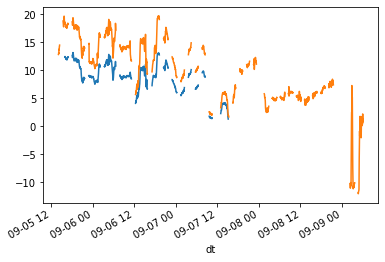

In [30]:
df_ncp['NCP mmol C m-2 d-1'].plot()
# df_new_ncp['NCP (mmol C/m2d)'].plot()
df_ncp['updated_ncp_m2'].plot()



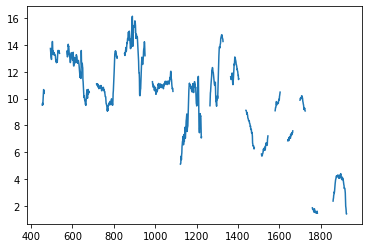

In [31]:
plt.plot(range(len(df_new_ncp['NCP (mmol C/m2d)'])),df_new_ncp['NCP (mmol C/m2d)'])

#### Pull in Nutrient Data

In [32]:
nuts_df = pd.read_csv(data_src+'20220131_nutstoUCSD_data.csv')

date_time_strs = nuts_df['Date'] + ' ' + nuts_df['Time (UTC)']
nuts_df['datetime'] = [datetime.strptime(x, '%m/%d/%Y %H:%M') for x in date_time_strs]
nuts_df['utc_dt'] = nuts_df['datetime']
nuts_df  = nuts_df.set_index('utc_dt')
nuts_df = nuts_df.sort_index(ascending=True)
nuts_df.head()

,Station,NO3a,PO4a,SILa,NO2a,NH4a,NO3b,PO4b,SILb,NO2b,NH4b,Time (UTC),Date,datetime
utc_dt,,,,,,,,,,,,,,
2021-09-05 12:07:00,1,0.11,0.06,0.8,0.00,0.25,0.10,0.08,1.1,0.00,0.18,12:07,9/5/2021,2021-09-05 12:07:00
2021-09-05 13:02:00,2,0.26,0.06,1.5,0.01,0.35,0.23,0.08,2.3,0.01,0.23,13:02,9/5/2021,2021-09-05 13:02:00
2021-09-05 13:48:00,3,0.27,0.06,2.3,0.01,0.25,0.32,0.08,2.6,0.01,0.22,13:48,9/5/2021,2021-09-05 13:48:00
2021-09-05 14:08:00,4,0.15,0.06,2.3,0.01,0.15,0.18,0.06,1.5,0.01,0.30,14:08,9/5/2021,2021-09-05 14:08:00
2021-09-05 14:24:00,6,0.06,0.04,1.0,0.01,0.16,0.10,0.07,1.0,0.01,0.21,14:24,9/5/2021,2021-09-05 14:24:00


### Match up all the data in time

This takes a few minutes

In [40]:
len(tsg_df)

39259

In [43]:
SynAs = []
PeuksAs = []
PicoCyanoAs = [] 
SynBs = []
PeuksBs = []
PicoCyanoBs = [] 
BacteriaAs = []
BacteriaBs = []
ChlaAvgs = []
ChlaAs = []
ChlaBs = []
sample_nums = []

DetritusA = []
DetritusB = []
SynredfluA = []
SynredfluB = []
SynorangefluA = []
SynorangefluB = []
PicoredfluA = []
PicoredfluB = []
PicoeukredfluA = []
PicoeukredfluB = []

NO3as = []
PO4as = []
SILas = []
NO2as = []
NH4as = []
NO3bs = []
PO4bs = []
SILbs = []
NO2bs = []
NH4bs = []

cdomVolts = []

ncp_area = []
ncp_vol = []
mld_list = []

for i in range(len(tsg_df)):
    try:
        row = fcm_df.iloc[fcm_df.index.get_loc(pd.to_datetime(tsg_df.iloc[i].datetime), method='nearest', tolerance=pd.Timedelta('5sec'))]
        SynAs.append(row.SynA)
        PeuksAs.append(row.PeuksA) 
        PicoCyanoAs.append(row.PicoCyanoA)
        SynBs.append(row.SynB)
        PeuksBs.append(row.PeaksB) 
        PicoCyanoBs.append(row.PicoCyanoB)
        BacteriaAs.append(row.Bacteria_A)
        BacteriaBs.append(row.Bacteria_B)
        ChlaAvgs.append(row.Chla_Avg)
        ChlaAs.append(row['Chla A'])
        ChlaBs.append(row['Chla B'])
        sample_nums.append(row['Sample#'])

        
        DetritusA.append(row.DetritusA)
        SynredfluA.append(row.SynredfluA)
        SynorangefluA.append(row.SynorangefluA)
        PicoredfluA.append(row.PicoredfluA)
        PicoeukredfluA.append(row.PicoeukredfluA)
        
        DetritusB.append(row.DetritusB)
        SynredfluB.append(row.SynredfluB)
        SynorangefluB.append(row.SynorangefluB)
        PicoredfluB.append(row.PicoredfluB)
        PicoeukredfluB.append(row.PicoeukredfluB)
        
    except KeyError:
        SynAs.append(np.nan)
        PeuksAs.append(np.nan) 
        PicoCyanoAs.append(np.nan)
        SynBs.append(np.nan)
        PeuksBs.append(np.nan) 
        PicoCyanoBs.append(np.nan)
        BacteriaAs.append(np.nan)
        BacteriaBs.append(np.nan)
        ChlaAvgs.append(np.nan)
        ChlaAs.append(np.nan)
        ChlaBs.append(np.nan)
        sample_nums.append(np.nan)
        
        
        DetritusA.append(np.nan)
        SynredfluA.append(np.nan)
        SynorangefluA.append(np.nan)
        PicoredfluA.append(np.nan)
        PicoeukredfluA.append(np.nan)
        
        DetritusB.append(np.nan)
        SynredfluB.append(np.nan)
        SynorangefluB.append(np.nan)
        PicoredfluB.append(np.nan)
        PicoeukredfluB.append(np.nan)
        
    try:
        row = cdom_df.iloc[cdom_df.index.get_loc(pd.to_datetime(tsg_df.iloc[i].datetime), method='nearest', tolerance=pd.Timedelta('5sec'))]
        cdomVolts.append(row[' V'])

    except KeyError:
        cdomVolts.append(np.nan)
        
    try:
        row = df_ncp.iloc[df_ncp.index.get_loc(pd.to_datetime(tsg_df.iloc[i].datetime), method='nearest', tolerance=pd.Timedelta('30sec'))]
        ncp_area.append(row['updated_ncp_m2'])
    except KeyError:
        ncp_area.append(np.nan)

    try:
        row = df_ncp.iloc[df_ncp.index.get_loc(pd.to_datetime(tsg_df.iloc[i].datetime), method='nearest', tolerance=pd.Timedelta('30sec'))]
        ncp_vol.append(row['updated_ncp_m3'])
    except KeyError:
        ncp_vol.append(np.nan)
  
    try:
        row = df_ncp.iloc[df_ncp.index.get_loc(pd.to_datetime(tsg_df.iloc[i].datetime), method='nearest', tolerance=pd.Timedelta('30sec'))]
        mld_list.append(row['MLD'])
    except KeyError:
        mld_list.append(np.nan)
        
    try:
        row = nuts_df.iloc[nuts_df.index.get_loc(pd.to_datetime(tsg_df.iloc[i].datetime), method='nearest', tolerance=pd.Timedelta('5sec'))]
        
        NO3as.append(row.NO3a)
        PO4as.append(row.PO4a)
        SILas.append(row.SILa) 
        NO2as.append(row.NO2a)
        NH4as.append(row.NH4a)
        NO3bs.append(row.NO3b)
        PO4bs.append(row.PO4b)
        SILbs.append(row.SILb)
        NO2bs.append(row.NO2b)
        NH4bs.append(row.NH4b)

    except KeyError:
        NO3as.append(np.nan)
        PO4as.append(np.nan)
        SILas.append(np.nan) 
        NO2as.append(np.nan)
        NH4as.append(np.nan)
        NO3bs.append(np.nan)
        PO4bs.append(np.nan)
        SILbs.append(np.nan)
        NO2bs.append(np.nan)
        NH4bs.append(np.nan)   
    
    if i % 2000 == 0:
        print(i)
        
tsg_df['SynA'] = SynAs
tsg_df['PeuksA'] = PeuksAs
tsg_df['PicoCyanoA'] = PicoCyanoAs
tsg_df['SynB'] = SynBs
tsg_df['PeuksB'] = PeuksBs
tsg_df['PicoCyanoB'] = PicoCyanoBs
tsg_df['BacteriaA'] = BacteriaAs
tsg_df['BacteriaB'] = BacteriaBs
tsg_df['ChlaAvg'] = ChlaAvgs
tsg_df['ChlaA'] = ChlaAs
tsg_df['ChlaB'] = ChlaBs
tsg_df['Sample#'] = sample_nums
tsg_df['cdomVolts'] = cdomVolts

tsg_df['NCPm2'] = ncp_area
tsg_df['NCPm3'] = ncp_vol
tsg_df['MLD'] = mld_list

tsg_df['DetritusA'] = DetritusA
tsg_df['DetritusB'] = DetritusB
tsg_df['SynredfluA'] = SynredfluA
tsg_df['SynredfluB'] = SynredfluB
tsg_df['SynorangefluA'] = SynorangefluA
tsg_df['SynorangefluB'] = SynorangefluB
tsg_df['PicoredfluA'] = PicoredfluA
tsg_df['PicoredfluB'] = PicoredfluB
tsg_df['PicoeukredfluA'] = PicoeukredfluA
tsg_df['PicoeukredfluB'] = PicoeukredfluB

tsg_df['NO3a'] = NO3as
tsg_df['PO4a'] = PO4as
tsg_df['SILa'] = SILas
tsg_df['NO2a'] = NO2as
tsg_df['NH4a'] = NH4as
tsg_df['NO3b'] = NO3bs
tsg_df['PO4b'] = PO4bs
tsg_df['SILb'] = SILbs
tsg_df['NO2b'] = NO2bs
tsg_df['NH4b'] = NH4bs

0
2000
4000
6000
8000
10000
12000
14000
16000
18000
20000
22000
24000
26000
28000
30000
32000
34000
36000
38000


Set the chl-a values that don't exist to nan

In [44]:
tsg_df['ChlaA'][tsg_df['ChlaA']==-999]=np.nan
tsg_df['ChlaB'][tsg_df['ChlaB']==-999]=np.nan

<ipython-input-44-5bfe795cc01c>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tsg_df['ChlaA'][tsg_df['ChlaA']==-999]=np.nan
<ipython-input-44-5bfe795cc01c>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tsg_df['ChlaB'][tsg_df['ChlaB']==-999]=np.nan


### Pull in Optical Data

This data could be merged but already has S and T and CDOM integrated and thus probably doesn't need to be merged with everything else

In [45]:
optical_df = pd.read_csv(data_src+'optical_inline/linear_interp_210905-7_ACS_qc24.csv')
optical_df['datetime'] = pd.to_datetime(optical_df.dt)
optical_df['utc_dt'] = optical_df['datetime']
optical_df  = optical_df.set_index('utc_dt')
optical_df = optical_df.sort_index(ascending=True)

In [46]:
bb3_df = pd.read_csv(data_src+'optical_inline/linear_interp_210905-7_BB3_qc24.csv')
bb3_df['datetime'] = pd.to_datetime(bb3_df.dt)
bb3_df['utc_dt'] = bb3_df['datetime']
bb3_df  = bb3_df.set_index('utc_dt')
bb3_df = bb3_df.sort_index(ascending=True)

In [47]:
tsg_optical_df = pd.read_csv(data_src+'optical_inline/linear_interp_210905-7_TSG_qc24.csv')
tsg_optical_df['datetime'] = pd.to_datetime(tsg_optical_df.dt)
tsg_optical_df['utc_dt'] = tsg_optical_df['datetime']
tsg_optical_df  = tsg_optical_df.set_index('utc_dt')
tsg_optical_df = tsg_optical_df.sort_index(ascending=True)

In [48]:
cdom_optical_df = pd.read_csv(data_src+'optical_inline/linear_interp_210905-7_CDOM_qc24.csv')
cdom_optical_df['datetime'] = pd.to_datetime(cdom_optical_df.dt)
cdom_optical_df['utc_dt'] = cdom_optical_df['datetime']
cdom_optical_df  = cdom_optical_df.set_index('utc_dt')
cdom_optical_df = cdom_optical_df.sort_index(ascending=True)

In [49]:
bb1s = []
bb2s = []
bb3s = []

Ts = []
Ss = []
CDOMs = []

for i in range(len(optical_df)):
    idx = bb3_df.index[bb3_df.index.get_loc(pd.to_datetime(optical_df.iloc[i].datetime), method='nearest')]
    bb1s.append(bb3_df.loc[idx].bbp_1)
    bb2s.append(bb3_df.loc[idx].bbp_2)
    bb3s.append(bb3_df.loc[idx].bbp_3)
    
    idx = tsg_optical_df.index[tsg_optical_df.index.get_loc(pd.to_datetime(optical_df.iloc[i].datetime), method='nearest')]
    Ts.append(tsg_optical_df.loc[idx].t)
    Ss.append(tsg_optical_df.loc[idx].s)
    
    idx = cdom_optical_df.index[cdom_optical_df.index.get_loc(pd.to_datetime(optical_df.iloc[i].datetime), method='nearest')]
    CDOMs.append(cdom_optical_df.loc[idx].fdom)
    
optical_df['bbp1'] = bb1s
optical_df['bbp2'] = bb2s
optical_df['bbp3'] = bb3s
optical_df['temp'] = Ts
optical_df['sal'] = Ss
optical_df['cdom'] = CDOMs

    
    

In [50]:
optical_df['bbp_ratio_440'] = optical_df.bbp1/(optical_df.iloc[:, 8+81:12+81].mean(axis=1) - optical_df.iloc[:, 8:12].mean(axis=1))
optical_df['bbp_ratio_440']

utc_dt
2021-09-05 12:26:00         NaN
2021-09-05 12:28:00         NaN
2021-09-05 12:30:00         NaN
2021-09-05 12:32:00         NaN
2021-09-05 12:34:00         NaN
                         ...   
2021-09-07 22:40:00    0.003074
2021-09-07 22:42:00    0.004491
2021-09-07 22:44:00    0.005081
2021-09-07 22:46:00    0.003738
2021-09-07 22:48:00    0.004551
Name: bbp_ratio_440, Length: 1592, dtype: float64

In [51]:
optical_df['bbp_ratio_532'] = optical_df.bbp2/(optical_df.iloc[:, 29+81:31+81].mean(axis=1) - optical_df.iloc[:, 29:31].mean(axis=1))
optical_df['bbp_ratio_532']

utc_dt
2021-09-05 12:26:00         NaN
2021-09-05 12:28:00         NaN
2021-09-05 12:30:00         NaN
2021-09-05 12:32:00         NaN
2021-09-05 12:34:00         NaN
                         ...   
2021-09-07 22:40:00    0.000798
2021-09-07 22:42:00    0.001293
2021-09-07 22:44:00    0.001998
2021-09-07 22:46:00    0.001984
2021-09-07 22:48:00    0.002143
Name: bbp_ratio_532, Length: 1592, dtype: float64

In [52]:
lats = []
lons = []

for i in range(len(optical_df)):
    idx = tsg_df.index[tsg_df.index.get_loc(pd.to_datetime(optical_df.iloc[i].datetime), method='nearest')]
    lats.append(tsg_df.loc[idx].lat)
    lons.append(tsg_df.loc[idx].lon)
        
optical_df['lat'] = lats
optical_df['lon'] = lons

Merge the optical data and the flow cytometry

In [53]:
SynAs = []
PeuksAs = []
PicoCyanoAs = [] 
SynBs = []
PeuksBs = []
PicoCyanoBs = [] 
BacteriaAs = []
BacteriaBs = []
ChlaAvgs = []

for i in range(len(optical_df)):
    try:
        row = tsg_df.iloc[tsg_df.index.get_loc(pd.to_datetime(optical_df.iloc[i].datetime), method='nearest', tolerance=pd.Timedelta('61sec'))]
        SynAs.append(row.SynA)
        PeuksAs.append(row.PeuksA) 
        PicoCyanoAs.append(row.PicoCyanoA)
        SynBs.append(row.SynB)
        PeuksBs.append(row.PeuksB) 
        PicoCyanoBs.append(row.PicoCyanoB)
        BacteriaAs.append(row.BacteriaA)
        BacteriaBs.append(row.BacteriaB)
        ChlaAvgs.append(row.ChlaAvg)

    except KeyError:
        SynAs.append(np.nan)
        PeuksAs.append(np.nan) 
        PicoCyanoAs.append(np.nan)
        SynBs.append(np.nan)
        PeuksBs.append(np.nan) 
        PicoCyanoBs.append(np.nan)
        BacteriaAvgs.append(np.nan)
        ChlaAvgs.append(np.nan)
        
optical_df['SynA'] = SynAs
optical_df['PeuksA'] = PeuksAs
optical_df['PicoCyanoA'] = PicoCyanoAs
optical_df['SynB'] = SynBs
optical_df['PeuksB'] = PeuksBs
optical_df['PicoCyanoB'] = PicoCyanoBs
optical_df['BacteriaA'] = BacteriaAs
optical_df['BacteriaB'] = BacteriaBs
optical_df['ChlaAvg'] = ChlaAvgs

In [54]:
plt.rcParams.update({'font.size': 14})

Text(0, 0.5, 'gaussian values')

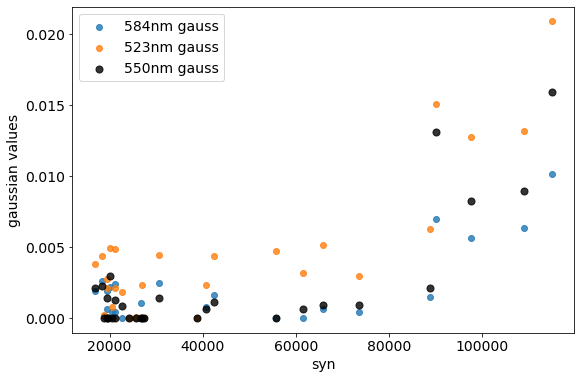

In [55]:
fig, ax = plt.subplots(figsize=(9,6))
ax.scatter((optical_df.SynA+optical_df.SynB)/2, optical_df.agaus584, alpha=0.8, label='584nm gauss')
ax.scatter((optical_df.SynA+optical_df.SynB)/2, optical_df.agaus523, alpha=0.8, label='523nm gauss')
# ax.scatter((optical_df.SynA+optical_df.SynB)/2, optical_df.agaus453, alpha=0.8, label='453nm gauss')
ax.scatter((optical_df.SynA+optical_df.SynB)/2, optical_df.agaus550, alpha=0.8, label='550nm gauss', color='black', s=50)

ax.legend()


ax.set_xlabel('syn')
ax.set_ylabel('gaussian values')
# plt.savefig('syn_v_gaussians.png', dpi=300)

Text(0, 0.5, 'gaussian values')

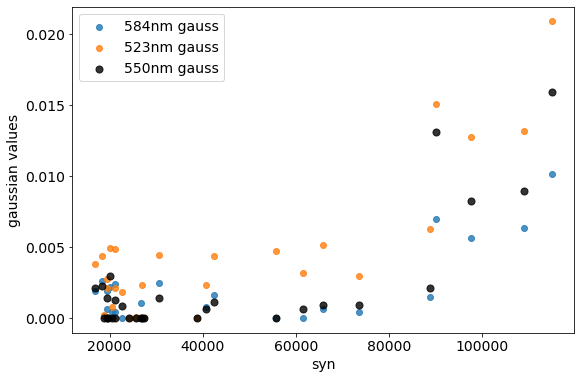

In [56]:
fig, ax = plt.subplots(figsize=(9,6))
ax.scatter((optical_df.SynA+optical_df.SynB)/2, optical_df.agaus584, alpha=0.8, label='584nm gauss')
ax.scatter((optical_df.SynA+optical_df.SynB)/2, optical_df.agaus523, alpha=0.8, label='523nm gauss')
# ax.scatter((optical_df.SynA+optical_df.SynB)/2, optical_df.agaus453, alpha=0.8, label='453nm gauss')
ax.scatter((optical_df.SynA+optical_df.SynB)/2, optical_df.agaus550, alpha=0.8, label='550nm gauss', color='black', s=50)

ax.legend()


ax.set_xlabel('syn')
ax.set_ylabel('gaussian values')
# plt.savefig('syn_v_gaussians.png', dpi=300)

## Calculate density along the transect

In [57]:
import gsw

In [58]:
# need to smooth out the per second measurements of S and T to minute rolling bins

In [59]:
tsg_df['sigma'] = gsw.density.sigma0(tsg_df.Sal, tsg_df.Temp)#.rolling(window=5).mean()

Calculate density gradient, this isn't really a high quality way to calculate it but just a rough calc

In [60]:
tsg_df['sigma_grad'] = np.gradient(tsg_df['sigma'])

In [61]:
tn_names = ['transect_1', 'transect_2', 'transect_3', 'transect_4', 'transect_5', 'transect_6', 'transect_7', 'transect_8', 'transect_9']

In [62]:
# bad practice but they're too noisy
import warnings
warnings.filterwarnings("ignore")

### Checking out transects from DVM timing

In [63]:
dvm_start_times = ['2021-09-5 22:00:00', '2021-09-6 21:00:00']
dvm_end_times = ['2021-09-6 00:56:00','2021-09-7 00:22:00',]

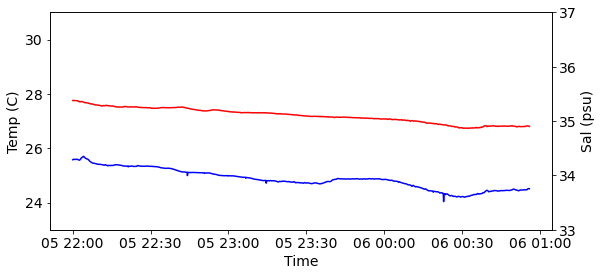

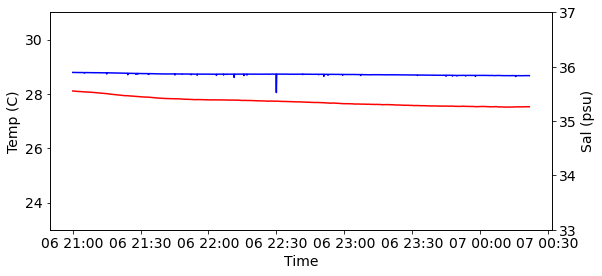

In [64]:
for i in range(2):
    df_subset = tsg_df.loc[dvm_start_times[i]:dvm_end_times[i]]
    fig, ax = plt.subplots(figsize=(9,4))
    
    ax.plot(df_subset.datetime,df_subset['Temp'], c='red')

    ax2 = ax.twinx()
    ax2.plot(df_subset.datetime,df_subset['Sal'], c='blue')

    ax.set_ylim(23,31)
    ax2.set_ylim(33,37)
    ax.set_ylabel('Temp (C)')
    ax2.set_ylabel('Sal (psu)')
    ax.set_xlabel('Time')
    plt.show()

In [65]:
goes_ds = xr.open_dataset(data_src+'jplStarG16SSTv270_8997_d932_2101.nc')

(-76.8, -73.5)

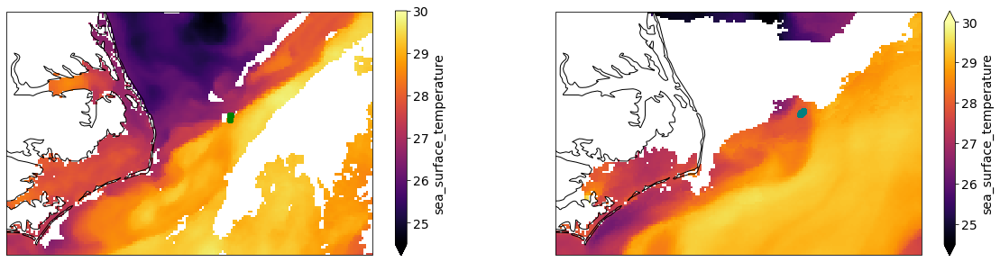

In [66]:
fig, ax = plt.subplots(1,2,figsize=(20,5), subplot_kw=dict(projection=crs.PlateCarree()))
ax[0].coastlines(resolution='10m')
ax[1].coastlines(resolution='10m')

goes_ds.sel(time=slice(pd.to_datetime(dvm_start_times[0]), pd.to_datetime(dvm_end_times[0])-timedelta(hours=2.5))).sea_surface_temperature.mean(dim='time').plot(ax=ax[0], vmin=24.5, vmax=30, cmap='inferno')
goes_ds.sel(time=slice(pd.to_datetime(dvm_start_times[1]), pd.to_datetime(dvm_end_times[1]))).sea_surface_temperature.mean(dim='time').plot(ax=ax[1], vmin=24.5, vmax=30, cmap='inferno')

tsg_gdf.loc[dvm_start_times[0]:dvm_end_times[0]].plot(ax=ax[0], color='green')
tsg_gdf.loc[dvm_start_times[1]:dvm_end_times[1]].plot(ax=ax[1], color='teal')
ax[0].set_ylim(34.5,36.7)
ax[0].set_xlim(-76.8,-73.5)
ax[1].set_ylim(34.5,36.7)
ax[1].set_xlim(-76.8,-73.5)
# plt.savefig('dvm_monitoring.png',dpi=600)

(-76.8, -73.5)

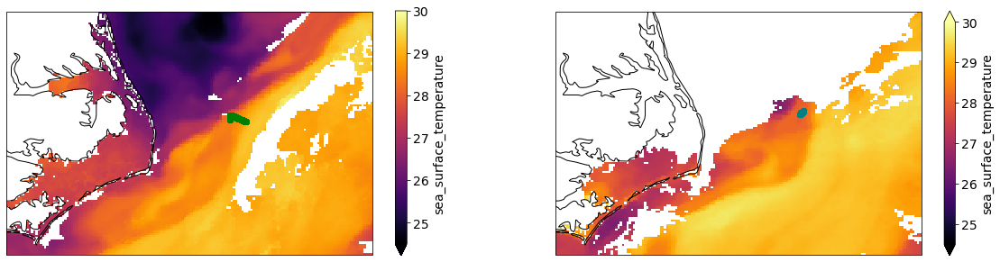

In [67]:
fig, ax = plt.subplots(1,2,figsize=(20,5), subplot_kw=dict(projection=crs.PlateCarree()))
ax[0].coastlines(resolution='10m')
ax[1].coastlines(resolution='10m')

goes_ds.sel(time=slice(pd.to_datetime(dvm_start_times[0]), pd.to_datetime(dvm_end_times[0])+timedelta(hours=2.5))).sea_surface_temperature.mean(dim='time').plot(ax=ax[0], vmin=24.5, vmax=30, cmap='inferno')
goes_ds.sel(time=slice(pd.to_datetime(dvm_start_times[1]), pd.to_datetime(dvm_end_times[1])-timedelta(hours=2.5))).sea_surface_temperature.mean(dim='time').plot(ax=ax[1], vmin=24.5, vmax=30, cmap='inferno')

tsg_gdf.loc[dvm_start_times[0]:pd.to_datetime(dvm_end_times[0])+timedelta(hours=2.5)].plot(ax=ax[0], color='green')
tsg_gdf.loc[dvm_start_times[1]:dvm_end_times[1]].plot(ax=ax[1], color='teal')
ax[0].set_ylim(34.5,36.7)
ax[0].set_xlim(-76.8,-73.5)
ax[1].set_ylim(34.5,36.7)
ax[1].set_xlim(-76.8,-73.5)
# plt.savefig('dvm_monitoring.png',dpi=600)

In [68]:
! pip install geopy

In [69]:
from geopy import distance

In [70]:
def get_dist(df, df_start, flip=False):
    distances = []
    # flip allows you to swap the starting side so that it can always do dist from the same side
    if flip == False:
        first_row = df_start.iloc[0]
    else:
        first_row = df_start.iloc[-1]
    for row in df.itertuples(index=False):
        distances.append(distance.distance((row.lat, row.lon),(first_row.lat,first_row.lon)).meters)
    return(distances)

In [72]:
start_times = ['2021-09-5 13:00:00', '2021-09-5 18:15:00', '2021-09-6 1:00:00', '2021-09-6 5:10:00', '2021-09-6 12:30:00', '2021-09-6 16:45:00', '2021-09-7 2:55:00', '2021-09-7 6:45:00', '2021-09-7 12:10:00']
end_times = ['2021-09-5 17:30:00','2021-09-5 20:30:00', '2021-09-6 4:00:00', '2021-09-6 6:45:00', '2021-09-6 15:00:00', '2021-09-6 19:20:00', '2021-09-7 5:35:00', '2021-09-7 9:00:00', '2021-09-7 15:30:00']

In [73]:
tsg_df['distances'] = -999
# for i in [0,1,4,5,8]:
for i in range(9):
    flip=False
    if i in [1,8]:
        flip = True
    df_distances = get_dist(tsg_df.loc[start_times[i]:end_times[i]],tsg_df.loc[start_times[i]:end_times[i]],flip=flip)
    tsg_df.loc[start_times[i]:end_times[i], 'distances'] = df_distances
    

In [74]:
temp_gs = 28.225
sal_eddy_gs = 35.8
sal_shelf = 34

tsg_df['water_mass'] = 'slope'
tsg_df['water_mass'][tsg_df.Sal > sal_eddy_gs] = 'eddy'
tsg_df['water_mass'][tsg_df.Temp > temp_gs] = 'gulfstream'
tsg_df['water_mass'][tsg_df.Sal < sal_shelf] = 'shelf'

tsg_df['water_mass_color'] = 'green' # slope
tsg_df['water_mass_color'][tsg_df.Sal > sal_eddy_gs] = 'yellow' # eddy
tsg_df['water_mass_color'][tsg_df.Temp > temp_gs] = 'blue' # gulfstream
tsg_df['water_mass_color'][tsg_df.Sal < sal_shelf] = 'brown' # shelf

tsg_df['water_mass_code'] = 1
tsg_df['water_mass_code'][tsg_df.Sal > sal_eddy_gs] = 2
tsg_df['water_mass_code'][tsg_df.Temp > temp_gs] = 3
tsg_df['water_mass_code'][tsg_df.Sal < sal_shelf] = 0

In [75]:
optical_df['water_mass'] = 'slope'
optical_df['water_mass'][optical_df.sal > sal_eddy_gs] = 'eddy'
optical_df['water_mass'][optical_df.temp > temp_gs] = 'gulfstream'
optical_df['water_mass'][optical_df.sal < sal_shelf] = 'shelf'

optical_df['water_mass_color'] = 'green' # slope
optical_df['water_mass_color'][optical_df.sal > sal_eddy_gs] = 'yellow' # eddy
optical_df['water_mass_color'][optical_df.temp > temp_gs] = 'blue' # gulfstream
optical_df['water_mass_color'][optical_df.sal < sal_shelf] = 'brown' # shelf

optical_df['water_mass_code'] = 1
optical_df['water_mass_code'][optical_df.sal > sal_eddy_gs] = 2
optical_df['water_mass_code'][optical_df.temp > temp_gs] = 3
optical_df['water_mass_code'][optical_df.sal < sal_shelf] = 0

Let's write out the TSdata

In [77]:
len(tsg_df[tsg_df.BacteriaB > 0])

86

In [78]:
# tsg_df[tsg_df.BacteriaB > 0].to_csv('sept_sw_stations_all_details_220223.csv')

In [79]:
plt.rcParams.update({'font.size': 20})

In [80]:
optical_start_times = ['2021-09-5 14:20:00', '2021-09-5 18:15:00', '2021-09-6 1:00:00', '2021-09-6 5:10:00', '2021-09-6 16:45:00', '2021-09-7 2:55:00', '2021-09-7 6:45:00', '2021-09-7 12:45:00']
optical_end_times = ['2021-09-5 17:00:00','2021-09-5 20:30:00', '2021-09-6 4:00:00', '2021-09-6 6:45:00', '2021-09-6 19:20:00', '2021-09-7 5:35:00', '2021-09-7 9:00:00', '2021-09-7 15:30:00']

dfs = []
for i in range(len(optical_start_times)):
    dfs.append(optical_df.loc[optical_start_times[i]:optical_end_times[i]])
optical_df_quality = pd.concat(dfs)

### Here we're going to visualize a lot of the data along each transect

########################################
Transect 1
########################################


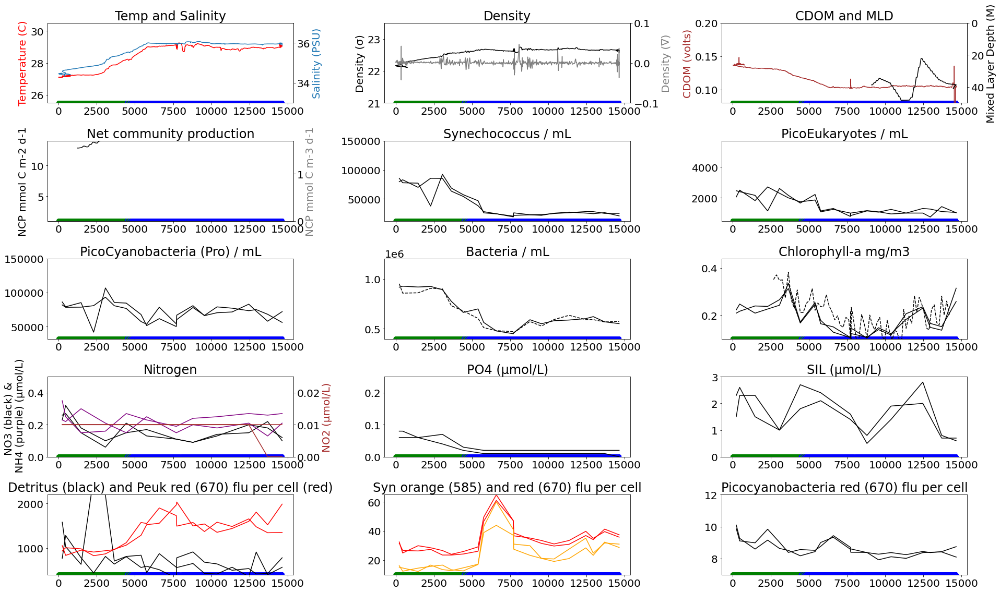

----------------------------------------------------------------------------------------------------------


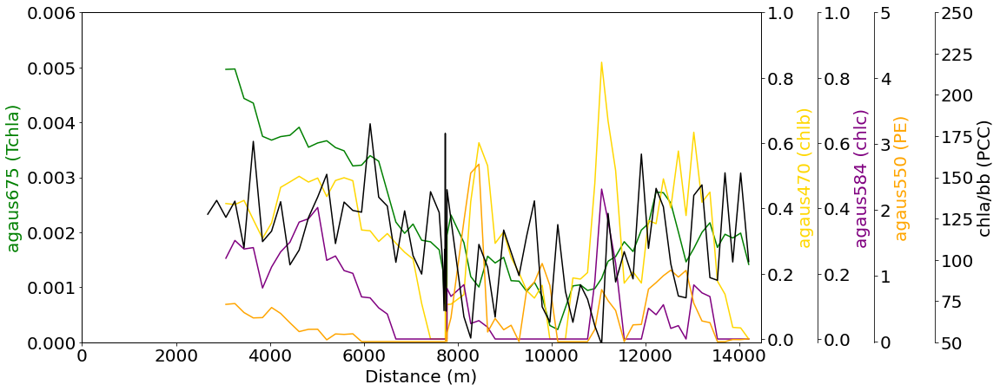

########################################
Transect 2
########################################


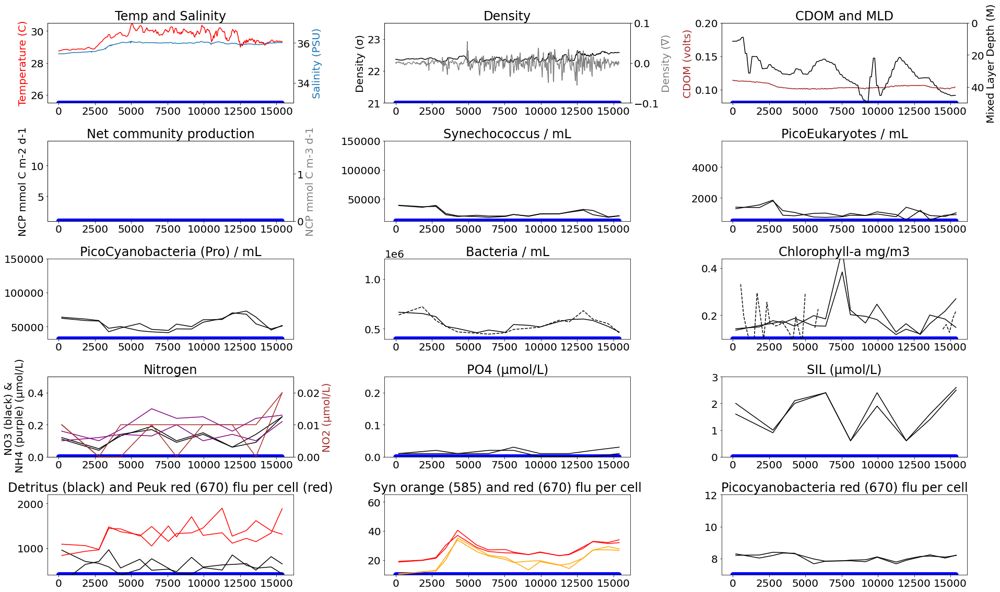

----------------------------------------------------------------------------------------------------------


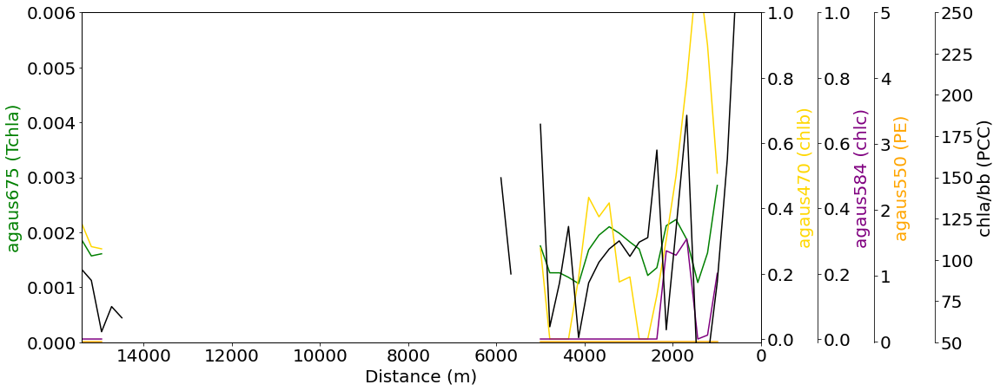

########################################
Transect 3
########################################


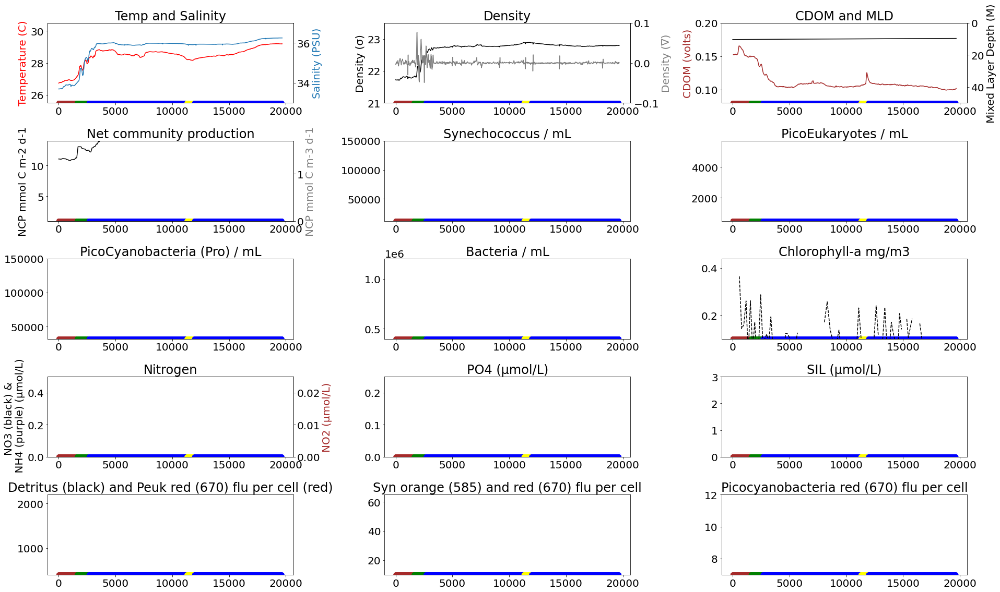

----------------------------------------------------------------------------------------------------------


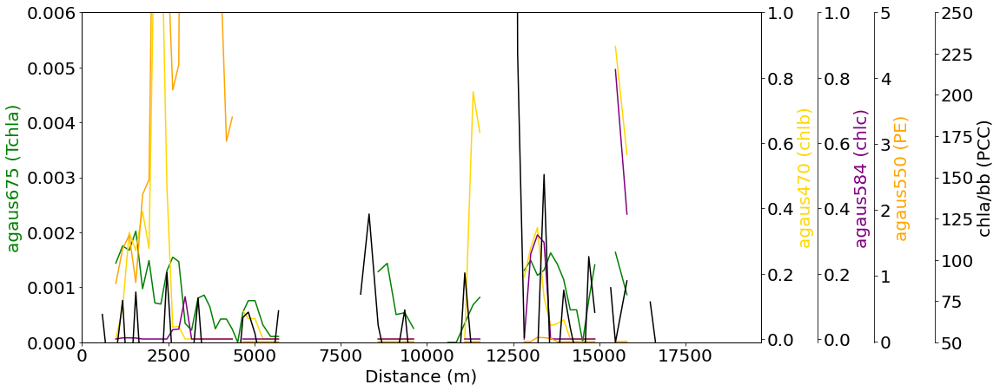

########################################
Transect 4
########################################


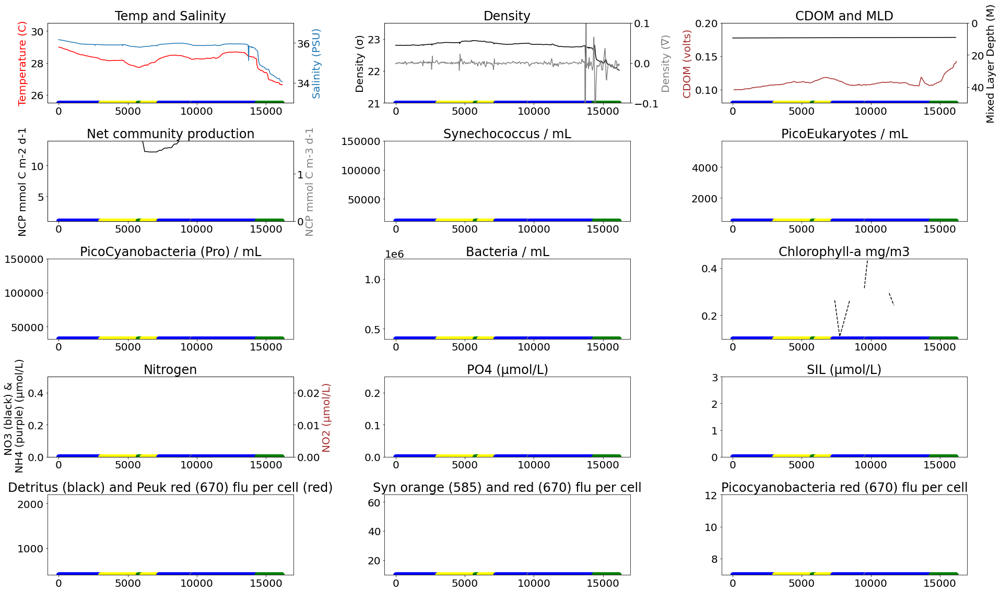

----------------------------------------------------------------------------------------------------------


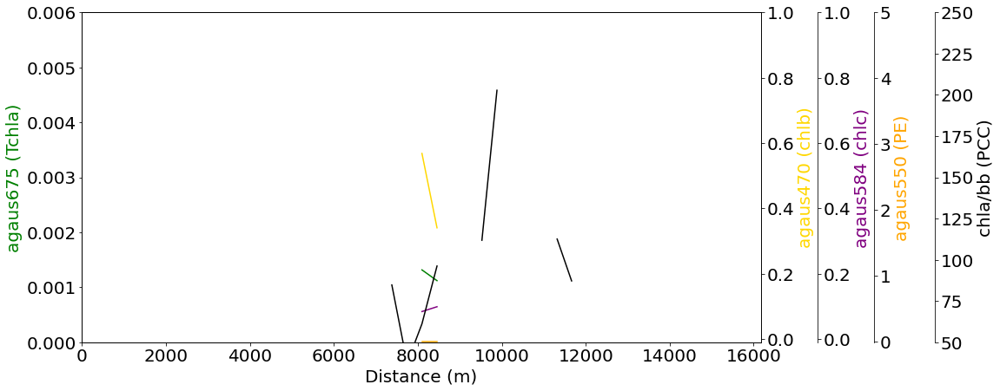

########################################
Transect 5
########################################


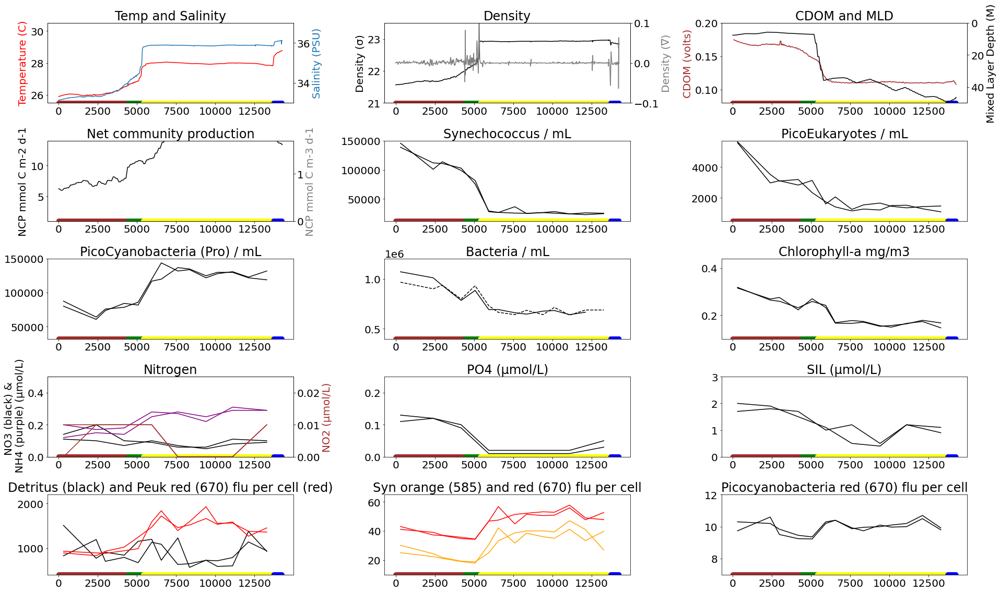

----------------------------------------------------------------------------------------------------------
---no optical data this transect---


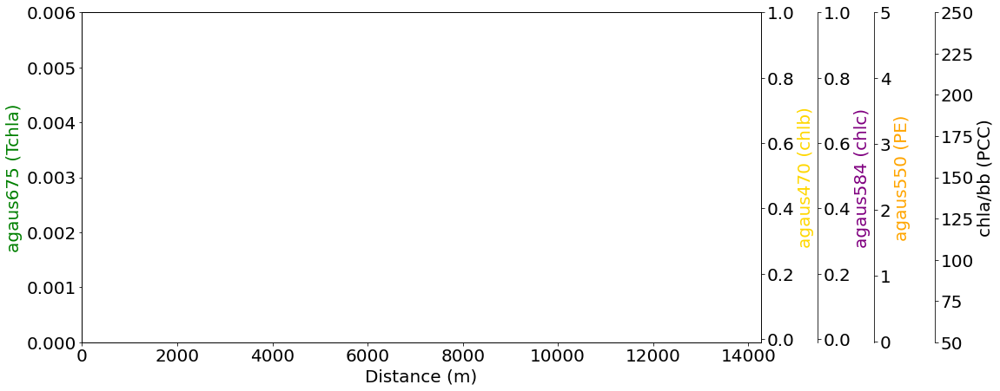

########################################
Transect 6
########################################


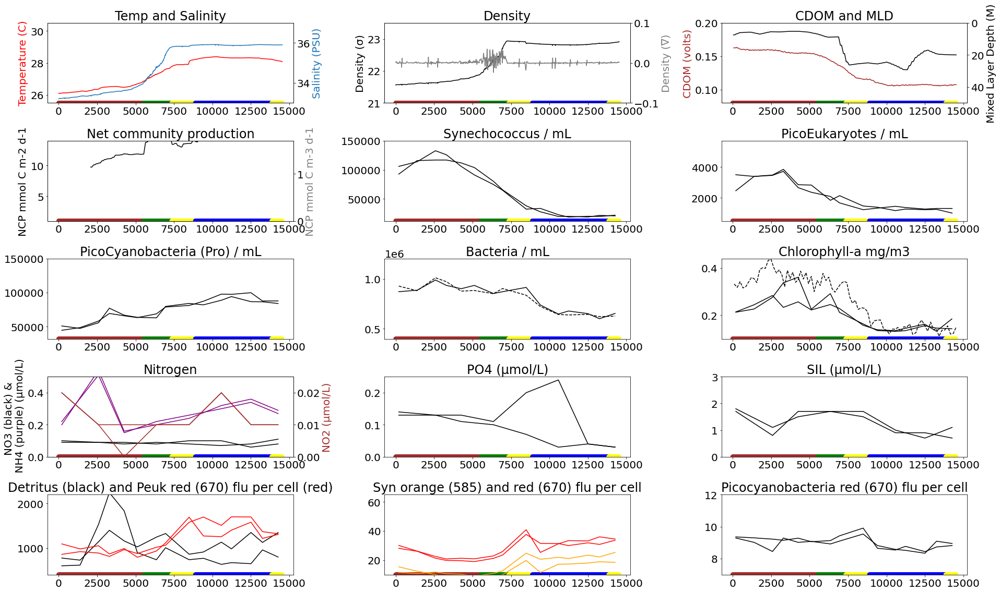

----------------------------------------------------------------------------------------------------------


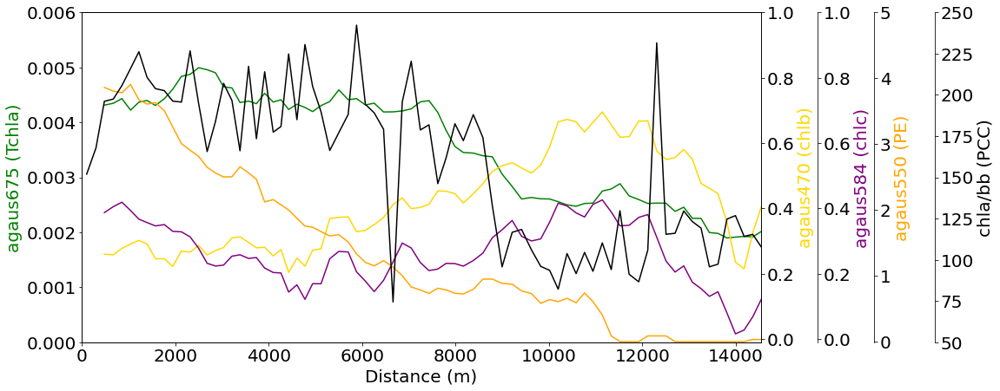

########################################
Transect 7
########################################


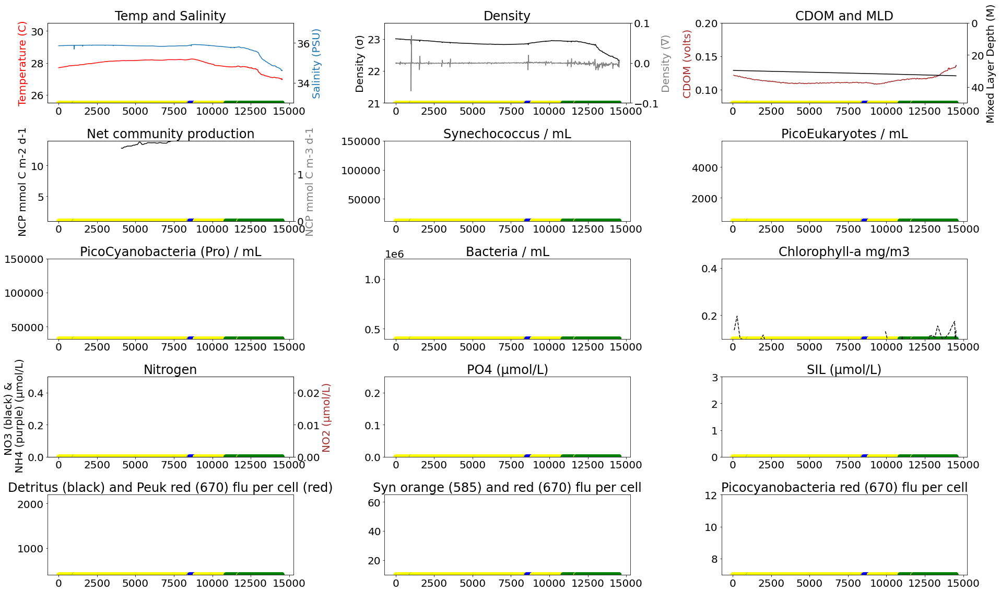

----------------------------------------------------------------------------------------------------------


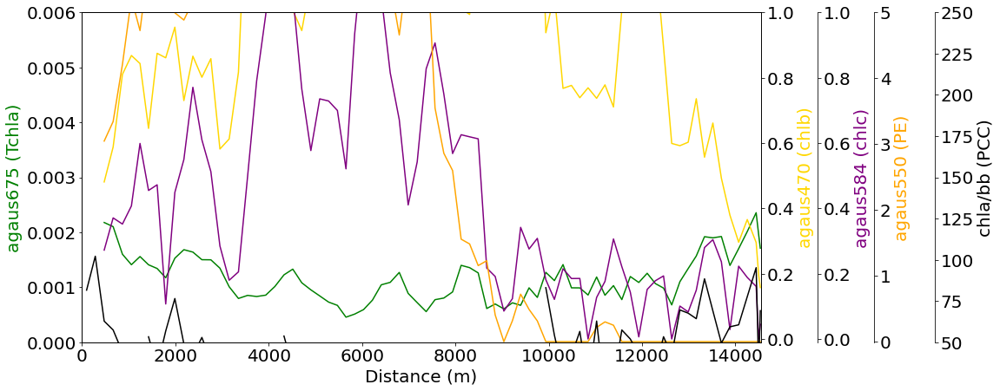

########################################
Transect 8
########################################


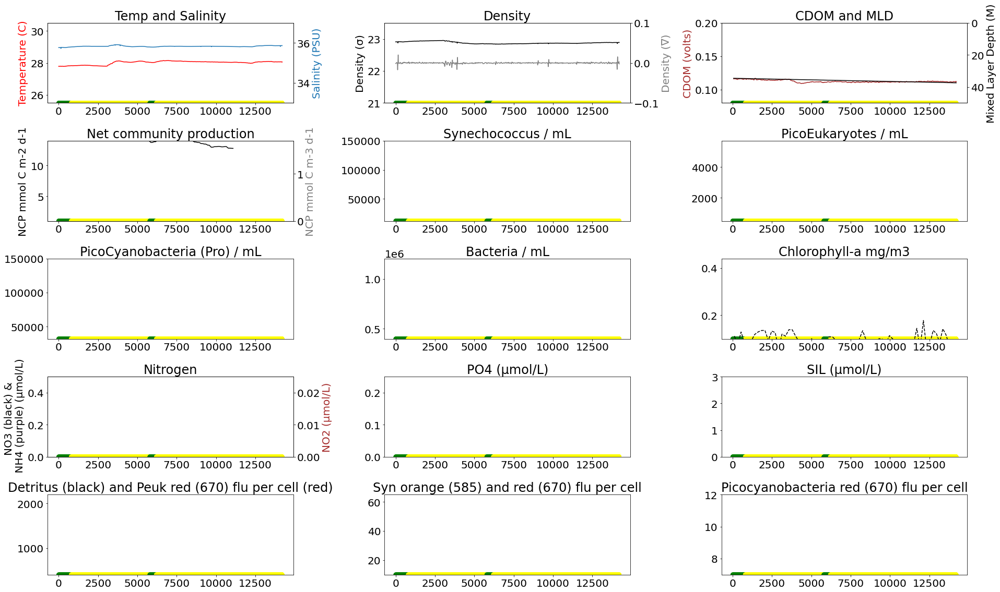

----------------------------------------------------------------------------------------------------------


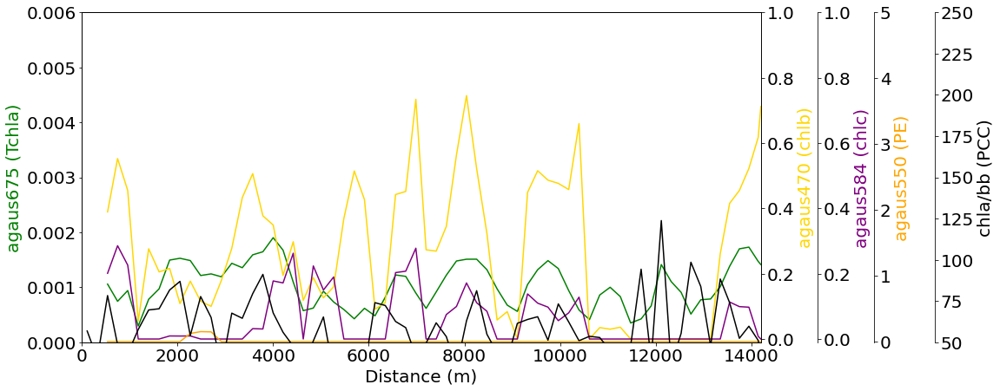

########################################
Transect 9
########################################


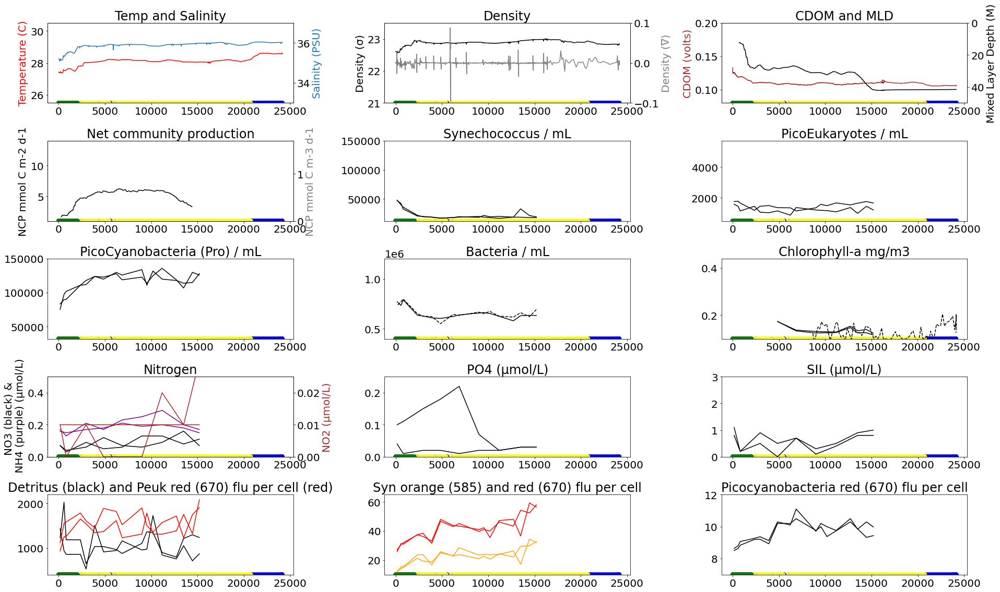

----------------------------------------------------------------------------------------------------------


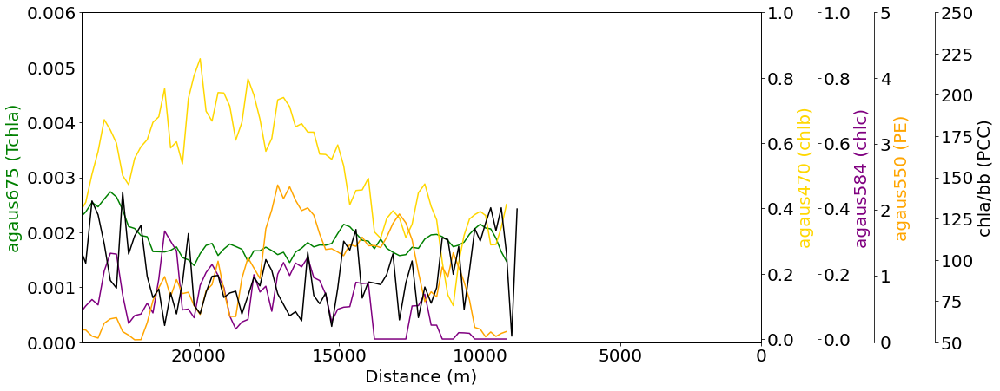

In [81]:
start_times = ['2021-09-5 13:00:00', '2021-09-5 18:15:00', '2021-09-6 1:00:00', '2021-09-6 5:10:00', '2021-09-6 12:30:00', '2021-09-6 16:45:00', '2021-09-7 2:55:00', '2021-09-7 6:45:00', '2021-09-7 12:10:00']
end_times = ['2021-09-5 17:30:00','2021-09-5 20:30:00', '2021-09-6 4:00:00', '2021-09-6 6:45:00', '2021-09-6 15:00:00', '2021-09-6 19:20:00', '2021-09-7 5:35:00', '2021-09-7 9:00:00', '2021-09-7 15:30:00']
hours = [0,0,0,0,0,0,0,0,0]

titles = ['Transect 1 (Sept 5 daytime AM)', 'Transect 2 (Sept 5 daytime PM)', 'Transect 3 (Sept 5 nighttime)', 'Transect 4 (Sept 5 nighttime)', 
        'Transect 5 (Sept 6 daytime AM)', 'Transect 6 (Sept 6 daytime PM)', 'Transect 7 (Sept 6 nighttime)', 'Transect 8 (Sept 6 nighttime)',
        'Transect 9 (Sept 7 daytime AM)']

for i in range(9):
# for i in [0,1,4,5,8]:
    
        print("########################################")
        print('Transect '+str(i+1))
        print("########################################")
        
        # time series plot
        fig = plt.figure(figsize=(27,16))

        gs = fig.add_gridspec(5,3)
        
        temp_ax = fig.add_subplot(gs[0, 0]) # S/T
        density_ax = fig.add_subplot(gs[0, 1]) # density
        cdom_ax = fig.add_subplot(gs[0, 2]) # cdom
        ncp_ax = fig.add_subplot(gs[1, 0]) # ncp
        syn_ax = fig.add_subplot(gs[1, 1]) # syn
        picoeu_ax = fig.add_subplot(gs[1, 2]) # picoeu
        picocy_ax = fig.add_subplot(gs[2, 0]) # picocy
        bac_ax = fig.add_subplot(gs[2, 1])
        chla_ax = fig.add_subplot(gs[2, 2])
        
        nit_ax = fig.add_subplot(gs[3, 0])
        po4_ax = fig.add_subplot(gs[3, 1])
        sil_ax = fig.add_subplot(gs[3, 2])
        
        detritus_ax = fig.add_subplot(gs[4, 0])
        synflu_ax = fig.add_subplot(gs[4, 1])
        picoflu_ax = fig.add_subplot(gs[4, 2])

        sal_ax = temp_ax.twinx()
        density_grad_ax = density_ax.twinx()
        ncp_vol_ax = ncp_ax.twinx()
        mld_ax = cdom_ax.twinx()
        
        no2_ax = nit_ax.twinx()
        
#         temp_ax.axhline(temp_only_shelf,color='green')
#         sal_ax.axhline(sal_only_shelf,color='green', ls='--')
    

#         temp_ax.axhline(temp_gs,color='blue')
#         sal_ax.axhline(sal_gs,color='blue', ls='--')
        
#         ax3 = ax.twinx()
#         ax4 = ax.twinx()
#         ax5 = ax.twinx()
#         ax6 = ax.twinx()
#         ax7 = ax.twinx()
#         ax8 = ax7.twinx()
#         ax9 = ax.twinx()

        temp_ax.set_ylim(25.5, 30.5)
        sal_ax.set_ylim(33, 37)
        cdom_ax.set_ylim(.08, .2)
        syn_ax.set_ylim(12000, 150000)
        picoeu_ax.set_ylim(500, 5700)
        picocy_ax.set_ylim(32000, 150000)
        bac_ax.set_ylim(400000, 1200000)
        chla_ax.set_ylim(.1, .44)
        ncp_ax.set_ylim(1, 14)
        density_ax.set_ylim(21, 23.5)
        density_grad_ax.set_ylim(-.1, .1)
        ncp_vol_ax.set_ylim(0, 1.7)
        mld_ax.set_ylim(50,0)
        
        detritus_ax.set_ylim(400,2200)
        synflu_ax.set_ylim(10,65)
        picoflu_ax.set_ylim(7,12)
        
        nit_ax.set_ylim(0,0.5)
        po4_ax.set_ylim(0,0.25)
        sil_ax.set_ylim(0,3)
        no2_ax.set_ylim(0,0.025)
        
#         temp_ax.axhline(28.225, ls='--',c='red')
#         sal_ax.axhline(35.8, ls='--')
#         sal_ax.axhline(34, ls='--')
        
        markersize = 60
        temp_ax.scatter(tsg_df.loc[start_times[i]:end_times[i]].distances, len(tsg_df.loc[start_times[i]:end_times[i]].distances)*[25.5],s=markersize, c=tsg_df.loc[start_times[i]:end_times[i]]['water_mass_color'].values)
        syn_ax.scatter(tsg_df.loc[start_times[i]:end_times[i]].distances, len(tsg_df.loc[start_times[i]:end_times[i]].distances)*[12000],s=markersize, c=tsg_df.loc[start_times[i]:end_times[i]]['water_mass_color'].values)
        picoeu_ax.scatter(tsg_df.loc[start_times[i]:end_times[i]].distances, len(tsg_df.loc[start_times[i]:end_times[i]].distances)*[500],s=markersize, c=tsg_df.loc[start_times[i]:end_times[i]]['water_mass_color'].values)
        picocy_ax.scatter(tsg_df.loc[start_times[i]:end_times[i]].distances, len(tsg_df.loc[start_times[i]:end_times[i]].distances)*[32000],s=markersize, c=tsg_df.loc[start_times[i]:end_times[i]]['water_mass_color'].values)
        bac_ax.scatter(tsg_df.loc[start_times[i]:end_times[i]].distances, len(tsg_df.loc[start_times[i]:end_times[i]].distances)*[400000],s=markersize, c=tsg_df.loc[start_times[i]:end_times[i]]['water_mass_color'].values)
        chla_ax.scatter(tsg_df.loc[start_times[i]:end_times[i]].distances, len(tsg_df.loc[start_times[i]:end_times[i]].distances)*[.1],s=markersize, c=tsg_df.loc[start_times[i]:end_times[i]]['water_mass_color'].values)
        density_ax.scatter(tsg_df.loc[start_times[i]:end_times[i]].distances, len(tsg_df.loc[start_times[i]:end_times[i]].distances)*[21],s=markersize, c=tsg_df.loc[start_times[i]:end_times[i]]['water_mass_color'].values)
        ncp_ax.scatter(tsg_df.loc[start_times[i]:end_times[i]].distances, len(tsg_df.loc[start_times[i]:end_times[i]].distances)*[1],s=markersize, c=tsg_df.loc[start_times[i]:end_times[i]]['water_mass_color'].values)
        cdom_ax.scatter(tsg_df.loc[start_times[i]:end_times[i]].distances, len(tsg_df.loc[start_times[i]:end_times[i]].distances)*[0.08],s=markersize, c=tsg_df.loc[start_times[i]:end_times[i]]['water_mass_color'].values)

        nit_ax.scatter(tsg_df.loc[start_times[i]:end_times[i]].distances, len(tsg_df.loc[start_times[i]:end_times[i]].distances)*[0],s=markersize, c=tsg_df.loc[start_times[i]:end_times[i]]['water_mass_color'].values)
        po4_ax.scatter(tsg_df.loc[start_times[i]:end_times[i]].distances, len(tsg_df.loc[start_times[i]:end_times[i]].distances)*[0],s=markersize, c=tsg_df.loc[start_times[i]:end_times[i]]['water_mass_color'].values)
        sil_ax.scatter(tsg_df.loc[start_times[i]:end_times[i]].distances, len(tsg_df.loc[start_times[i]:end_times[i]].distances)*[0],s=markersize, c=tsg_df.loc[start_times[i]:end_times[i]]['water_mass_color'].values)
        
        detritus_ax.scatter(tsg_df.loc[start_times[i]:end_times[i]].distances, len(tsg_df.loc[start_times[i]:end_times[i]].distances)*[400],s=markersize, c=tsg_df.loc[start_times[i]:end_times[i]]['water_mass_color'].values)
        synflu_ax.scatter(tsg_df.loc[start_times[i]:end_times[i]].distances, len(tsg_df.loc[start_times[i]:end_times[i]].distances)*[10],s=markersize, c=tsg_df.loc[start_times[i]:end_times[i]]['water_mass_color'].values)
        picoflu_ax.scatter(tsg_df.loc[start_times[i]:end_times[i]].distances, len(tsg_df.loc[start_times[i]:end_times[i]].distances)*[7],s=markersize, c=tsg_df.loc[start_times[i]:end_times[i]]['water_mass_color'].values)
        
        
#         ax.axhline(temp_gs, color='red')
#         ax1.axhline(sal_gs, color='blue')
#         ax1.axhline(sal_only_gs, color='blue', ls='--')
        # salinity
        
#         ax3.set_yscale('log')
#         ax4.set_yscale('log')
#         ax5.set_yscale('log')
#         ax6.set_yscale('log')

#         ax.set_xlabel("Time (UTC)")
        temp_ax.set_title("Temp and Salinity")
        temp_ax.set_ylabel("Temperature (C)")
        sal_ax.set_ylabel("Salinity (PSU)")
        
        cdom_ax.set_title("CDOM and MLD")
        cdom_ax.set_ylabel("CDOM (volts)")
        mld_ax.set_ylabel('Mixed Layer Depth (M)')
        
        syn_ax.set_title("Synechococcus / mL")
        picoeu_ax.set_title("PicoEukaryotes / mL")
        picocy_ax.set_title("PicoCyanobacteria (Pro) / mL")
        bac_ax.set_title("Bacteria / mL")
        chla_ax.set_title("Chlorophyll-a mg/m3")
        
        density_ax.set_title('Density')
        density_ax.set_ylabel('Density (σ)')
        density_grad_ax.set_ylabel('Density (∇)')
        
        ncp_ax.set_title('Net community production')
        ncp_ax.set_ylabel('NCP mmol C m-2 d-1')
        ncp_vol_ax.set_ylabel('NCP mmol C m-3 d-1')
        
        nit_ax.set_title('Nitrogen')
        nit_ax.set_ylabel('NO3 (black) & \n NH4 (purple) (µmol/L)')
        no2_ax.set_ylabel('NO2 (µmol/L)')
        po4_ax.set_title('PO4 (µmol/L)')
        sil_ax.set_title('SIL (µmol/L)')
        
        detritus_ax.set_title('Detritus (black) and Peuk red (670) flu per cell (red)')
        synflu_ax.set_title('Syn orange (585) and red (670) flu per cell')
        picoflu_ax.set_title('Picocyanobacteria red (670) flu per cell')

        p1, = temp_ax.plot(tsg_df.loc[start_times[i]:end_times[i]].distances, tsg_df.loc[start_times[i]:end_times[i]]['Temp'], color='red', label='Temp')
        p2, = sal_ax.plot(tsg_df.loc[start_times[i]:end_times[i]].distances, tsg_df.loc[start_times[i]:end_times[i]]['Sal'], label='Salinity')
        
        p10, = density_ax.plot(tsg_df.loc[start_times[i]:end_times[i]].distances, tsg_df.loc[start_times[i]:end_times[i]]['sigma'], label='Density (sigma)',  color='black')
        p11, = density_grad_ax.plot(tsg_df.loc[start_times[i]:end_times[i]].distances, tsg_df.loc[start_times[i]:end_times[i]]['sigma_grad'], label='Density (sigma)',  color='grey')

        p3, = cdom_ax.plot(tsg_df[tsg_df['cdomVolts'].notnull()].loc[start_times[i]:end_times[i]].distances, 
                             tsg_df[tsg_df['cdomVolts'].notnull()].loc[start_times[i]:end_times[i]].rolling(window=5).mean()['cdomVolts'], label='CDOM',color='brown')

        p4, = syn_ax.plot(tsg_df[tsg_df['SynA'].notnull()].loc[start_times[i]:end_times[i]].distances, 
                       tsg_df[tsg_df['SynA'].notnull()].loc[start_times[i]:end_times[i]]['SynA'], label='Syn/mL', color='k')
        p4, = syn_ax.plot(tsg_df[tsg_df['SynB'].notnull()].loc[start_times[i]:end_times[i]].distances, 
                       tsg_df[tsg_df['SynB'].notnull()].loc[start_times[i]:end_times[i]]['SynB'], label='Syn/mL', color='k')
        p5, = picoeu_ax.plot(tsg_df[tsg_df['PeuksA'].notnull()].loc[start_times[i]:end_times[i]].distances, 
                         tsg_df[tsg_df['PeuksA'].notnull()].loc[start_times[i]:end_times[i]]['PeuksA'], label='Peuks/mL', color='k')
        p5, = picoeu_ax.plot(tsg_df[tsg_df['PeuksB'].notnull()].loc[start_times[i]:end_times[i]].distances, 
                         tsg_df[tsg_df['PeuksB'].notnull()].loc[start_times[i]:end_times[i]]['PeuksB'], label='Peuks/mL', color='k')
        p6, = picocy_ax.plot(tsg_df[tsg_df['PicoCyanoA'].notnull()].loc[start_times[i]:end_times[i]].distances, 
                         tsg_df[tsg_df['PicoCyanoA'].notnull()].loc[start_times[i]:end_times[i]]['PicoCyanoA'], label='PicoCyano/mL', color='k')
        p6, = picocy_ax.plot(tsg_df[tsg_df['PicoCyanoB'].notnull()].loc[start_times[i]:end_times[i]].distances, 
                         tsg_df[tsg_df['PicoCyanoB'].notnull()].loc[start_times[i]:end_times[i]]['PicoCyanoB'], label='PicoCyano/mL', color='k')
        p7, = bac_ax.plot(tsg_df[tsg_df['BacteriaA'].notnull()].loc[start_times[i]:end_times[i]].distances, 
                         tsg_df[tsg_df['BacteriaA'].notnull()].loc[start_times[i]:end_times[i]]['BacteriaA'], label='Bacteria/mL', color='k')
        p7, = bac_ax.plot(tsg_df[tsg_df['BacteriaB'].notnull()].loc[start_times[i]:end_times[i]].distances, 
                         tsg_df[tsg_df['BacteriaB'].notnull()].loc[start_times[i]:end_times[i]]['BacteriaB'],label='Bacteria/mL', color='k', ls='--')
        p8, = chla_ax.plot(tsg_df[tsg_df['ChlaA'].notnull()].loc[start_times[i]:end_times[i]].distances, 
                         tsg_df[tsg_df['ChlaA'].notnull()].loc[start_times[i]:end_times[i]]['ChlaA'], label='Chla mg/m3', color='k')
        p8, = chla_ax.plot(tsg_df[tsg_df['ChlaB'].notnull()].loc[start_times[i]:end_times[i]].distances, 
                         tsg_df[tsg_df['ChlaB'].notnull()].loc[start_times[i]:end_times[i]]['ChlaB'], label='Chla mg/m3', color='k')
        p9, = ncp_ax.plot(tsg_df[tsg_df['NCPm2'].notnull()].loc[start_times[i]:end_times[i]].distances, 
                          tsg_df[tsg_df['NCPm2'].notnull()].loc[start_times[i]:end_times[i]]['NCPm2'], label='NCP mmol C m-2 d-1', color='k')    
        p12, = ncp_vol_ax.plot(tsg_df[tsg_df['NCPm3'].notnull()].loc[start_times[i]:end_times[i]].distances, 
                               tsg_df[tsg_df['NCPm3'].notnull()].loc[start_times[i]:end_times[i]]['NCPm3'], label='NCP mmol C m-3 d-1', color='grey')
        p13, = mld_ax.plot(tsg_df[tsg_df['MLD'].notnull()].loc[start_times[i]:end_times[i]].distances, 
                               tsg_df[tsg_df['MLD'].notnull()].loc[start_times[i]:end_times[i]]['MLD'], label='Mixed Layer Depth', color='black')  
        
        
        optical_df_distances = get_dist(optical_df_quality.loc[start_times[i]:end_times[i]],tsg_df.loc[start_times[i]:end_times[i]])
        chla_ax.plot(optical_df_distances, 
                         (optical_df_quality.loc[start_times[i]:end_times[i]].chl_ap676lh+.001)*2, label='Chla mg/m3', color='k', ls='--')
        
        
        
        
#         'NO3a', 'PO4a', 'SILa', 'NO2a', 'NH4a', 'NO3b', 'PO4b','SILb', 'NO2b', 'NH4b',
        
        p14, = nit_ax.plot(tsg_df[tsg_df['NO3a'].notnull()].loc[start_times[i]:end_times[i]].distances, 
                               tsg_df[tsg_df['NO3a'].notnull()].loc[start_times[i]:end_times[i]]['NO3a'], label='NO3', color='black')  
        p15, = nit_ax.plot(tsg_df[tsg_df['NO3b'].notnull()].loc[start_times[i]:end_times[i]].distances, 
                               tsg_df[tsg_df['NO3b'].notnull()].loc[start_times[i]:end_times[i]]['NO3b'], label='NO3', color='black')  
        
        p16, = no2_ax.plot(tsg_df[tsg_df['NO2a'].notnull()].loc[start_times[i]:end_times[i]].distances, 
                               tsg_df[tsg_df['NO2a'].notnull()].loc[start_times[i]:end_times[i]]['NO2a'], label='NO2', color='brown')  
        p17, = no2_ax.plot(tsg_df[tsg_df['NO2b'].notnull()].loc[start_times[i]:end_times[i]].distances, 
                               tsg_df[tsg_df['NO2b'].notnull()].loc[start_times[i]:end_times[i]]['NO2b'], label='NO2', color='brown') 
        
        p18, = nit_ax.plot(tsg_df[tsg_df['NH4a'].notnull()].loc[start_times[i]:end_times[i]].distances, 
                               tsg_df[tsg_df['NH4a'].notnull()].loc[start_times[i]:end_times[i]]['NH4a'], label='NH4', color='purple')  
        p19, = nit_ax.plot(tsg_df[tsg_df['NH4b'].notnull()].loc[start_times[i]:end_times[i]].distances, 
                               tsg_df[tsg_df['NH4b'].notnull()].loc[start_times[i]:end_times[i]]['NH4b'], label='NH4', color='purple') 
        
        
        
        p20, = po4_ax.plot(tsg_df[tsg_df['PO4a'].notnull()].loc[start_times[i]:end_times[i]].distances, 
                               tsg_df[tsg_df['PO4a'].notnull()].loc[start_times[i]:end_times[i]]['PO4a'], label='PO4', color='black')  
        p21, = po4_ax.plot(tsg_df[tsg_df['PO4b'].notnull()].loc[start_times[i]:end_times[i]].distances, 
                               tsg_df[tsg_df['PO4b'].notnull()].loc[start_times[i]:end_times[i]]['PO4b'], label='PO4', color='black')
        
        
        p22, = sil_ax.plot(tsg_df[tsg_df['SILa'].notnull()].loc[start_times[i]:end_times[i]].distances, 
                               tsg_df[tsg_df['SILa'].notnull()].loc[start_times[i]:end_times[i]]['SILa'], label='SIL', color='black')  
        p23, = sil_ax.plot(tsg_df[tsg_df['SILb'].notnull()].loc[start_times[i]:end_times[i]].distances, 
                               tsg_df[tsg_df['SILb'].notnull()].loc[start_times[i]:end_times[i]]['SILb'], label='SIL', color='black')
        
        
        ### fluoresence and detritus
        
        p24, = detritus_ax.plot(tsg_df[tsg_df['DetritusA'].notnull()].loc[start_times[i]:end_times[i]].distances, 
                               tsg_df[tsg_df['DetritusA'].notnull()].loc[start_times[i]:end_times[i]]['DetritusA'], label='Detritus', color='black')
        p25, = detritus_ax.plot(tsg_df[tsg_df['DetritusB'].notnull()].loc[start_times[i]:end_times[i]].distances, 
                               tsg_df[tsg_df['DetritusB'].notnull()].loc[start_times[i]:end_times[i]]['DetritusB'], label='Detritus', color='black')
        
        p26, = synflu_ax.plot(tsg_df[tsg_df['SynredfluA'].notnull()].loc[start_times[i]:end_times[i]].distances, 
                               tsg_df[tsg_df['SynredfluA'].notnull()].loc[start_times[i]:end_times[i]]['SynredfluA'], label='Synredflu', color='red')
        p27, = synflu_ax.plot(tsg_df[tsg_df['SynredfluB'].notnull()].loc[start_times[i]:end_times[i]].distances, 
                               tsg_df[tsg_df['SynredfluB'].notnull()].loc[start_times[i]:end_times[i]]['SynredfluB'], label='Synredflu', color='red')
        
        p28, = synflu_ax.plot(tsg_df[tsg_df['SynorangefluA'].notnull()].loc[start_times[i]:end_times[i]].distances, 
                               tsg_df[tsg_df['SynorangefluA'].notnull()].loc[start_times[i]:end_times[i]]['SynorangefluA'], label='Synorangeflu', color='orange')
        p29, = synflu_ax.plot(tsg_df[tsg_df['SynorangefluB'].notnull()].loc[start_times[i]:end_times[i]].distances, 
                               tsg_df[tsg_df['SynorangefluB'].notnull()].loc[start_times[i]:end_times[i]]['SynorangefluB'], label='Synorangeflu', color='orange')
        
        p30, = picoflu_ax.plot(tsg_df[tsg_df['PicoredfluA'].notnull()].loc[start_times[i]:end_times[i]].distances, 
                               tsg_df[tsg_df['PicoredfluA'].notnull()].loc[start_times[i]:end_times[i]]['PicoredfluA'], label='Picoredflu', color='black')
        p31, = picoflu_ax.plot(tsg_df[tsg_df['PicoredfluB'].notnull()].loc[start_times[i]:end_times[i]].distances, 
                               tsg_df[tsg_df['PicoredfluB'].notnull()].loc[start_times[i]:end_times[i]]['PicoredfluB'], label='Picoredflu', color='black')
        
        p32, = detritus_ax.plot(tsg_df[tsg_df['PicoeukredfluA'].notnull()].loc[start_times[i]:end_times[i]].distances, 
                               tsg_df[tsg_df['PicoeukredfluA'].notnull()].loc[start_times[i]:end_times[i]]['PicoeukredfluA'], label='Picoeukredflu', color='red')
        p33, = detritus_ax.plot(tsg_df[tsg_df['PicoeukredfluB'].notnull()].loc[start_times[i]:end_times[i]].distances, 
                               tsg_df[tsg_df['PicoeukredfluB'].notnull()].loc[start_times[i]:end_times[i]]['PicoeukredfluB'], label='Picoeukredflu', color='red')

#         ax.set_title(titles[i])

#         lns = [p1, p2, p3, p4,p5,p6,p7,p8, p9]
        #ax.legend(handles=lns, loc='best')

        # right, left, top, bottom
#         ax2.spines['right'].set_position(('outward', 50))
#         ax2.spines['left'].set_position(('outward', 60))
#         ax2.spines['left'].set_visible(True)
#         ax2.yaxis.set_label_position('left')
#         ax2.yaxis.set_ticks_position('left')
#         ax9.spines['left'].set_position(('outward', 120))
#         ax9.spines['left'].set_visible(True)
#         ax9.yaxis.set_label_position('left')
#         ax9.yaxis.set_ticks_position('left')
#         ax3.spines['right'].set_position(('outward', 160))
#         ax4.spines['right'].set_position(('outward', 250))
#         ax5.spines['right'].set_position(('outward', 345))
#         ax6.spines['right'].set_position(('outward', 440))
#         ax7.spines['right'].set_position(('outward', 540))
#         ax8.spines['right'].set_position(('outward', 640))
#         ax9.spines['right'].set_position(('outward', 740))

        # no x-ticks                 
#         ax.xaxis.set_ticks([])
#         ax3.xaxis.set_ticks([])
#         ax4.xaxis.set_ticks([])
#         ax5.xaxis.set_ticks([])
#         ax6.xaxis.set_ticks([])
#         ax7.xaxis.set_ticks([])
#         fig.autofmt_xdate(rotation=45)

        # Sometimes handy, same for xaxis
        #par2.yaxis.set_ticks_position('right')

        # Move "Velocity"-axis to the left
        # par2.spines['left'].set_position(('outward', 60))
        # par2.spines['left'].set_visible(True)
        # par2.yaxis.set_label_position('left')
        # par2.yaxis.set_ticks_position('left')
        
#         for a in [temp_ax,density_ax,cdom_ax,ncp_ax,syn_ax,picoeu_ax,picocy_ax,bac_ax,chla_ax, nit_ax, po4_ax, sil_ax ,detritus_ax, synflu_ax, picoflu_ax]:
#             if i ==0:
#                 a.set_xlim(pd.to_datetime(start_times[i]),pd.to_datetime(end_times[i]))
#             elif i ==1:
#                  a.set_xlim(pd.to_datetime(end_times[i]), pd.to_datetime(start_times[i]))
#             elif i ==4:
#                 a.set_xlim(pd.to_datetime(start_times[i]),pd.to_datetime(end_times[i]))
#             elif i ==5:
#                 a.set_xlim(pd.to_datetime(start_times[i]),pd.to_datetime(end_times[i]))
#             elif i ==8:
#                 a.set_xlim(pd.to_datetime(end_times[i]), pd.to_datetime(start_times[i]))
                
#             a.xaxis.set_ticks([])

        temp_ax.yaxis.label.set_color(p1.get_color())
        sal_ax.yaxis.label.set_color(p2.get_color())
        cdom_ax.yaxis.label.set_color(p3.get_color())
        density_ax.yaxis.label.set_color(p10.get_color())
        density_grad_ax.yaxis.label.set_color(p11.get_color())
        mld_ax.yaxis.label.set_color(p13.get_color())
        ncp_ax.yaxis.label.set_color(p9.get_color())
        ncp_vol_ax.yaxis.label.set_color(p12.get_color())
        nit_ax.yaxis.label.set_color('black')
        no2_ax.yaxis.label.set_color(p17.get_color())
#         ax3.yaxis.label.set_color(p4.get_color())
#         ax4.yaxis.label.set_color(p5.get_color())
#         ax5.yaxis.label.set_color(p6.get_color())
#         ax6.yaxis.label.set_color(p7.get_color())
#         ax7.yaxis.label.set_color(p8.get_color())
#         ax8.yaxis.label.set_color(p9.get_color())

        # Adjust spacings w.r.t. figsize
        fig.tight_layout()
#         fig.savefig('figs/s_t_division'+titles[i] +'.png',dpi=600)
    #     plt.close()
        plt.show()
        print('----------------------------------------------------------------------------------------------------------')
        
#         fig, ax = plt.subplots(figsize=(10,8))
#         sc = ax.scatter(df.loc[start_times[i]:end_times[i]]['TSG--sal'],  df.loc[start_times[i]:end_times[i]]['TSG--temp-SBE38'], alpha=0.8,c=df.loc[start_times[i]:end_times[i]]['lon'], cmap='cividis', label='chla')
#         ax.set_xlim(33,37)
#         ax.set_ylim(25,31)
        
#         ax.set_xlabel("Salinity")
#         ax.set_ylabel("Temperature")
#         ax.axvline(35.7)
#         ax.axvline(34.5)

#         fig.savefig('figs/s_t_diagram'+titles[i] +'.png')
    
        #################################################
    
        fig, ax = plt.subplots(figsize=(14,7))
        
#         ax.set_xlim(pd.to_datetime(start_times[i]), pd.to_datetime(end_times[i]))

        ax1 = ax.twinx()
        ax2 = ax.twinx()
        ax3 = ax.twinx()
        ax4 = ax.twinx()
#         ax4 = ax.twinx()
        
#         ax.set_ylim(20, 29)
#         ax1.set_ylim(32, 36.6)
#         ax2.set_ylim(.0, .24)
#         ax3.set_ylim(.0, 2)

        ax.set_xlabel("Distance (m)")
        ax.set_ylabel("agaus675 (Tchla)")
        ax1.set_ylabel("agaus470 (chlb)")
        ax2.set_ylabel("agaus584 (chlc)")
        ax3.set_ylabel("agaus550 (PE)")
        ax4.set_ylabel("chla/bb (PCC)")
#         ax3.set_ylabel("Chla (mg/m3)")
#         ax4.set_ylabel("Density")
#         ax5.set_ylabel("Density Grad")
        
        ax.set_xlim(tsg_df.loc[start_times[i]:end_times[i]].distances[0], tsg_df.loc[start_times[i]:end_times[i]].distances[-1])
        
        # plot optical data if it exists
        if optical_df_quality.loc[start_times[i]:end_times[i]].empty:
            print('---no optical data this transect---')
        else:
            optical_df_distances = get_dist(optical_df_quality.loc[start_times[i]:end_times[i]],tsg_df.loc[start_times[i]:end_times[i]])
            
            window = 3
            
#             tchla = (optical_df.loc[start_times[i]:end_times[i]]['agaus675'] / np.exp(A))**(1/B)
            tchla = optical_df_quality.loc[start_times[i]:end_times[i]]['agaus675'].rolling(window=window).mean()
            
#             PPC = (optical_df.loc[start_times[i]:end_times[i]]['agaus470'] / np.exp(A))**(1/B)
            chlb = optical_df_quality.loc[start_times[i]:end_times[i]]['agaus660'].rolling(window=window).mean()/ tchla
            

#             PSC = (optical_df.loc[start_times[i]:end_times[i]]['agaus523'] / np.exp(A))**(1/B)
            chlc = optical_df_quality.loc[start_times[i]:end_times[i]]['agaus638'].rolling(window=window).mean()/ tchla
            
            # this algorithm currently doesn't have a specific coefficient for PE
            PE = optical_df_quality.loc[start_times[i]:end_times[i]]['agaus550'].rolling(window=window).mean()/ tchla
            
            ax.plot(optical_df_distances, tchla, label='agaus434',  color='green')
            ax1.plot(optical_df_distances, chlb, label='agaus470',  color='gold')
            ax2.plot(optical_df_distances, chlc, label='agaus584',  color='purple')
            ax3.plot(optical_df_distances, PE, label='agaus550',  color='orange')
            
            ax4.plot(optical_df_distances, optical_df_quality.loc[start_times[i]:end_times[i]]['chl_ap676lh']/optical_df_quality.loc[start_times[i]:end_times[i]]['bbp1'], label='chla/bb',  color='black')
            
            
        
#        ax1.spines['right'].set_position(('outward', 65))    
        ax2.spines['right'].set_position(('outward', 65))
        ax3.spines['right'].set_position(('outward', 130))
        ax4.spines['right'].set_position(('outward', 200))


        ax.yaxis.label.set_color('green')
        ax1.yaxis.label.set_color('gold')
        ax2.yaxis.label.set_color('purple')
        ax3.yaxis.label.set_color('orange')
        ax4.yaxis.label.set_color('black')
        
        ax.set_ylim(0,.006)
        ax1.set_ylim( -0.01,1)
        ax2.set_ylim(-0.01,1)
        ax3.set_ylim(-0.01,5)
        ax4.set_ylim(50,250)
#         fig.colorbar(sc)
        plt.show()

Read in the ACS devicefile to get the wavelengths

Then let's look at that data!

In [185]:
import numpy as np

In [187]:
acs_device_file = open(data_src+'acs_wavelengths.txt', "r").read()
acs_lambda = []
for line in acs_device_file.splitlines():
    acs_lambda.append(float(line[8:13]))
acs_wavelength = np.array(acs_lambda)

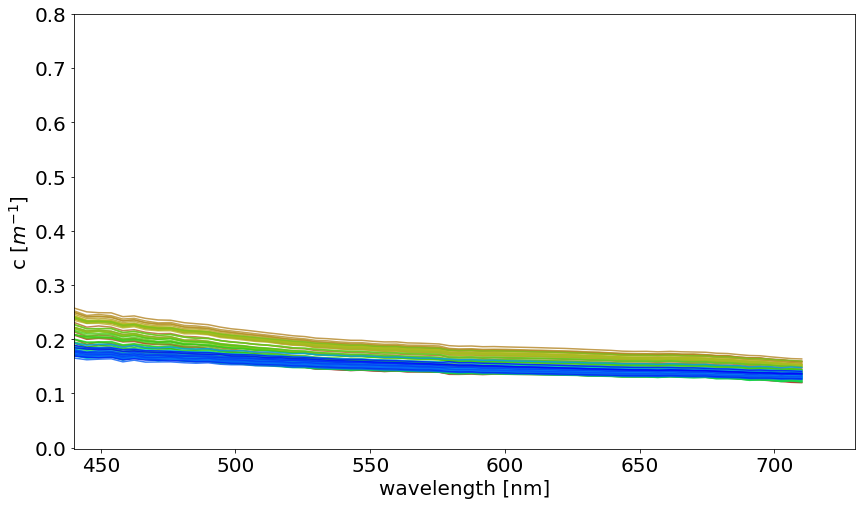

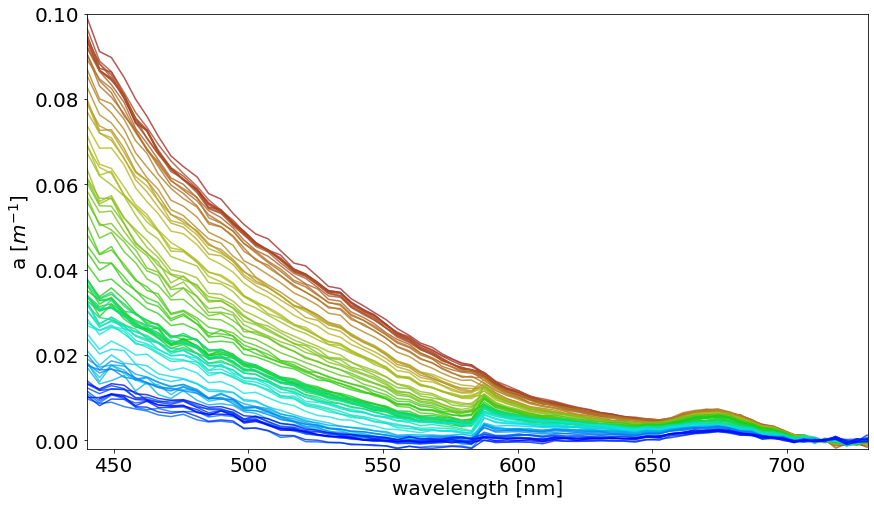

In [93]:
from colour import Color

df_subset = optical_df.loc[start_times[5]:end_times[5]]

colors = list(Color("brown").range_to(Color("blue"),len(df_subset)))
hex_colors = [j.hex for j in colors]

fig, ax = plt.subplots(figsize=(14,8))
for i in range(len(df_subset)):
    if ~df_subset.iloc[i,1:82].isnull().values.all():
        ax.plot(acs_wavelength,df_subset.iloc[i,1+83:82+83].rolling(window=1, win_type='triang').mean(), alpha=.8, c=hex_colors[i])
ax.set_ylim(-0.002,.8)
ax.set_xlim(440,730)
#ax.set_title('Particulate Abs')
ax.set_ylabel('c [$m^{-1}$]')
ax.set_xlabel('wavelength [nm]')  
# plt.title('Absorption colored by time (blue to brown) across an open ocean to coastal transect')
# plt.savefig('figs/sept_c_spec.png',dpi=300)
plt.show()


fig, ax = plt.subplots(figsize=(14,8))
for i in range(len(df_subset)):
    if ~df_subset.iloc[i,1:82].isnull().values.all():
        ax.plot(acs_wavelength,df_subset.iloc[i,1:82].rolling(window=1, win_type='triang').mean(), alpha=.8, c=hex_colors[i])
ax.set_ylim(-0.002,.1)
ax.set_xlim(440,730)
#ax.set_title('Particulate Abs')
ax.set_ylabel('a [$m^{-1}$]')
ax.set_xlabel('wavelength [nm]')  
# plt.title('Absorption colored by time (blue to brown) across an open ocean to coastal transect')
# plt.savefig('figs/sept_a_spec.png',dpi=300)
plt.show()

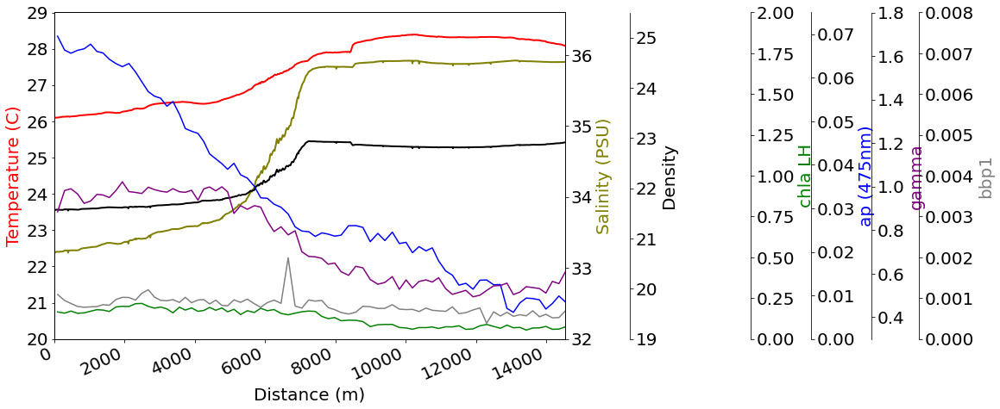

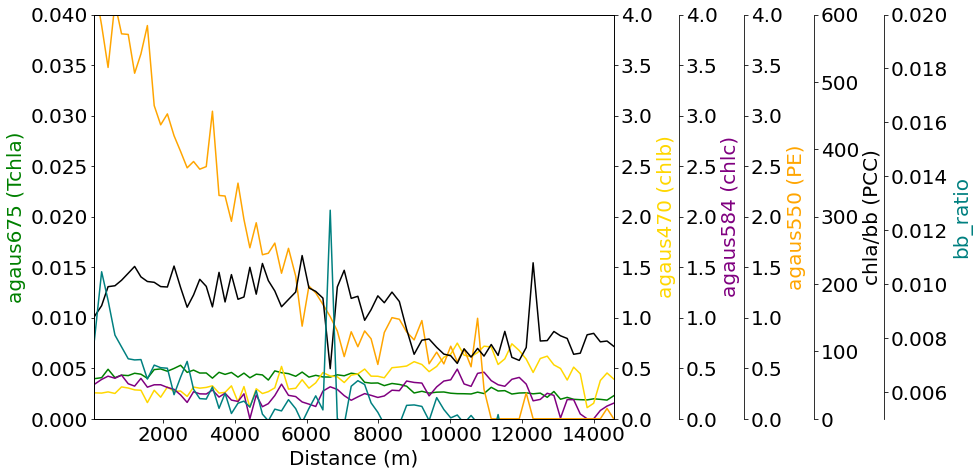

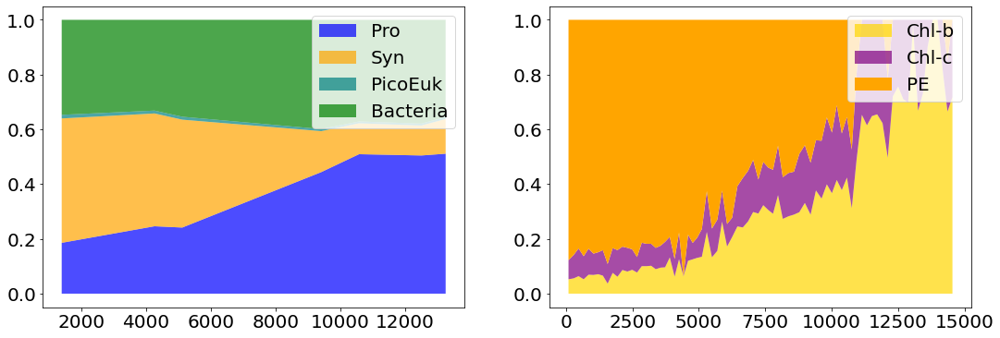

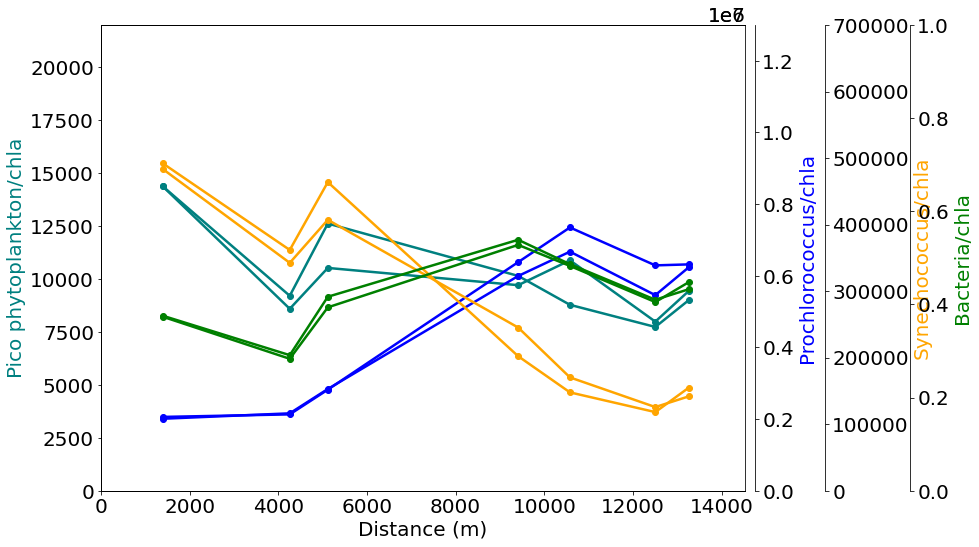

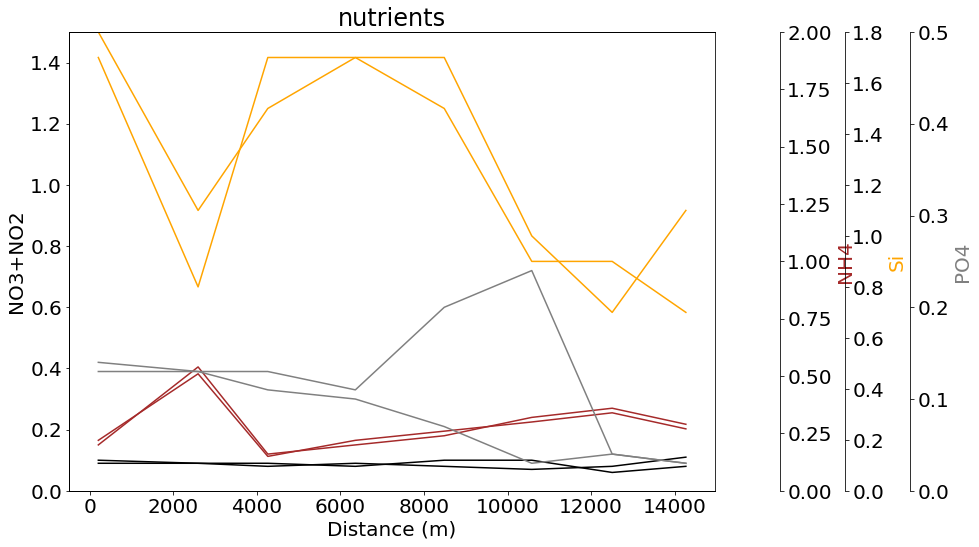

#######################################################################


In [94]:
df = tsg_df
for i in range(len(start_times)):
#     print(i)
    if i != 5:
        continue
# for i in range(len(start_times)):
# for i in [0,1,2,5,7,9,10,12]:
#     if trios_df.loc[start_times[i]:end_times[i]]['chla_oci'].empty:
#         pass
#     if profiles.loc[start_times[i]:end_times[i]].empty:
#         pass
# # #     elif hplc_df.loc[start_times[i]:end_times[i]]['datetime'].empty:
# # #         pass
#     else:
#         if not trios_gdf.loc[start_times[i]:end_times[i]]['440'].empty:
#             print('we have trios data')
#         else:
#             print('no TriOS data')

    # time series plot
    fig, ax = plt.subplots(figsize=(16.5,7))

    ax1 = ax.twinx()
#         ax2 = ax.twinx()
#         ax3 = ax.twinx()
    ax4 = ax.twinx()
#         ax5 = ax.twinx()
    ax6 = ax.twinx()
#         ax7 = ax.twinx()
    ax8 = ax.twinx()
    ax9 = ax.twinx()
    ax10 = ax.twinx()

    ax.set_ylim(20, 29)
    ax1.set_ylim(32, 36.6)
#         ax2.set_ylim(.0, .24)
#         ax3.set_ylim(.0, 2)
#         ax4.set_ylim(.07, .50)
#         ax5.set_ylim(.07, .50)
    ax4.set_ylim(19, 25.5)
#         ax5.set_ylim(-.1, .1)
    ax6.set_ylim(0,2)
#         ax7.set_ylim(0,0.0085)
    ax8.set_ylim(0,.075)
    ax9.set_ylim(0.3,1.8)
    ax10.set_ylim(0,0.008)

    ax.set_xlabel("Distance (m)")
    ax.set_ylabel("Temperature (C)")
    ax1.set_ylabel("Salinity (PSU)")
#         ax2.set_ylabel("CDOM (volts)")
#         ax3.set_ylabel("Chla (mg/m3)")
    ax4.set_ylabel("Density")
#         ax5.set_ylabel("Density Grad")
    ax6.set_ylabel("chla LH")
#         ax7.set_ylabel("agaus523 (phyco)")
    ax8.set_ylabel("ap (475nm)")
    ax9.set_ylabel("gamma")
    ax10.set_ylabel("bbp1")

    color1 = plt.cm.viridis(0)
    color2 = plt.cm.viridis(0.5)
    color3 = plt.cm.viridis(.9)

    df_distances = get_dist(df.loc[start_times[i]:end_times[i]],df.loc[start_times[i]:end_times[i]])
    ax.set_xlim(df_distances[0], df_distances[-1])

    p1, = ax.plot(df_distances, df.loc[start_times[i]:end_times[i]]['Temp'], color='red', label='Temp', lw=2)
    p2, = ax1.plot(df_distances, df.loc[start_times[i]:end_times[i]]['Sal'], label='Salinity', color='olive', lw=2)

#         p3  = ax2.scatter(cdom_data_x, cdom_data_y, color='brown', label='CDOM', s=1)


#         trios_df_distances = get_dist(trios_gdf.loc[start_times[i]:end_times[i]],df.loc[start_times[i]:end_times[i]])

#         trios_data_x = trios_gdf.loc[start_times[i]:end_times[i]].rolling(window=6*1).mean().index
#         trios_data_y = trios_gdf.loc[start_times[i]:end_times[i]].rolling(window=6*1).mean()['chla_oci']
#         p4  = ax3.plot(trios_df_distances, trios_data_y, color='green', label='Chla', ls='--')

#         p5 = ax4.scatter(hplc_df.loc[start_times[i]:end_times[i]].index, hplc_df.loc[start_times[i]:end_times[i]]['[TChl a]'], 
#                    color='orange', label='TChl a', s=50)
#         p6 = ax5.scatter(hplc_df.loc[start_times[i]:end_times[i]].index, hplc_df.loc[start_times[i]:end_times[i]]['[Zea]'], 
#                    color='purple', label='Zea', s=50)

#         ax.set_title(titles[i])

    p5, = ax4.plot(df_distances, tsg_df.loc[start_times[i]:end_times[i]]['sigma'],  color='black', lw=2)
#         p6, = ax5.plot(df_distances, tsg_df.loc[start_times[i]:end_times[i]]['sigma_grad'], label='Density grad',  color='grey')



#         df_subset = profiles.loc[start_times[i]:end_times[i]]
#         # now add in the proper locations for these guys
#         df_subset = profile_locs(df_subset)

    # integrate down to z depth
    #depths = [-2,-5,-10,-20,-40,-60,-80, -100]
#         depths=[-2,-10,-20,-40,-80]

#         colors = list(Color("black").range_to(Color("blue"),len(depths)))
#         hex_colors = [j.hex for j in colors]

#         for idx, z in enumerate(depths):
#             # cut it off at depth (dBars) >= z
#             df_tmp = df_subset[df_subset['depth (dBars)'] >= z] 
#             df_tmp_grouped = df_tmp.groupby('profile_num').median()
#             df_tmp_grouped['datetime'] = pd.to_datetime('2021-1-1') + pd.to_timedelta(df_tmp_grouped.time, unit='D') - pd.Timedelta(days=1)
#             df_subset_distances = get_dist(df_tmp_grouped, df.loc[start_times[i]:end_times[i]])


#             ax4.plot(df_subset_distances,df_tmp_grouped['potential density (kg/m^3 -1000)'], label='density mean(0'+str(z)+')', color=hex_colors[idx], ls='--')
#             ax4.scatter(df_subset_distances,df_tmp_grouped['potential density (kg/m^3 -1000)'], color=hex_colors[idx], ls='--')

        #             ax2.legend()


    # plot some optical data if it exists
    if optical_df.loc[start_times[i]:end_times[i]].empty:
        print('---no optical data this transect---')
    else:
        optical_df_distances = get_dist(optical_df.loc[start_times[i]:end_times[i]],df.loc[start_times[i]:end_times[i]])
        p7, = ax6.plot(optical_df_distances, optical_df.loc[start_times[i]:end_times[i]]['chl_ap676lh'], label='chl_ap676lh',  color='green')
#             p8, = ax7.plot(optical_df_distances, optical_df.loc[start_times[i]:end_times[i]]['agaus523'], label='agaus523',  color='gold')
        p9, = ax8.plot(optical_df_distances, optical_df.loc[start_times[i]:end_times[i]].iloc[:,16:20].mean(axis=1), label='ap(475)',  color='blue')
        p10, = ax9.plot(optical_df_distances, optical_df.loc[start_times[i]:end_times[i]]['gamma'], label='gamma',  color='purple')
        p11, = ax10.plot(optical_df_distances, optical_df.loc[start_times[i]:end_times[i]]['bbp1'], label='bbp_1',  color='grey')


#     p1, = ax.plot([0, 1, 2], [0, 1, 2],    color=color1, label="Density")
#     p2, = ax1.plot([0, 1, 2], [0, 3, 2],    color=color2, label="Temperature")
#     p3, = ax2.plot([0, 1, 2], [50, 30, 15], color=color3, label="Velocity")

#         ax4.legend(loc='lower left')
#         lns = [p1, p2, p4 p5, p6, p7, p9, p10]
    #ax.legend(handles=lns, loc='upper right')

    # right, left, top, bottom
#         ax2.spines['right'].set_position(('outward', 210))

    ax3.spines['right'].set_position(('outward', 215-65))

    ax4.spines['right'].set_position(('outward', 75))

#         ax5.spines['right'].set_position(('outward', 130))
    ax6.spines['right'].set_position(('outward', 280-65))
#         ax7.spines['right'].set_position(('outward', 280))
    ax8.spines['right'].set_position(('outward', 350-65))
    ax9.spines['right'].set_position(('outward', 420-65))
    ax10.spines['right'].set_position(('outward', 475-65))

    # no x-ticks                 
#     ax2.xaxis.set_ticks([])
    fig.autofmt_xdate(rotation=25)
    #ax.xaxis.set_major_formatter(myFmt)

    # Sometimes handy, same for xaxis
    #par2.yaxis.set_ticks_position('right')

    # Move "Velocity"-axis to the left
    # par2.spines['left'].set_position(('outward', 60))
    # par2.spines['left'].set_visible(True)
    # par2.yaxis.set_label_position('left')
    # par2.yaxis.set_ticks_position('left')

    ax.yaxis.label.set_color(p1.get_color())
    ax1.yaxis.label.set_color(p2.get_color())
#         ax2.yaxis.label.set_color('brown')
    ax3.yaxis.label.set_color('green')
    ax4.yaxis.label.set_color('black')
#         ax5.yaxis.label.set_color('grey')
    ax6.yaxis.label.set_color('green')
#         ax7.yaxis.label.set_color('gold')
    ax8.yaxis.label.set_color('blue')
    ax9.yaxis.label.set_color('purple')
    ax10.yaxis.label.set_color('grey')


    # Adjust spacings w.r.t. figsize
    fig.tight_layout()
#         if i == 2:
#             fig.savefig('figs/psc_std_transect_1620utc_290821.png')
#     plt.close()
#         fig.savefig('figs/transect_aug'+titles[i]+'.png')
#     plt.savefig('full_fig_sept.png',dpi=300)

    plt.show()




            ###########################

    # gaussian decomp section

    fig, ax = plt.subplots(figsize=(14,7))

#         ax.set_xlim(pd.to_datetime(start_times[i]), pd.to_datetime(end_times[i]))

    ax1 = ax.twinx()
    ax2 = ax.twinx()
    ax3 = ax.twinx()
    ax4 = ax.twinx()
    ax5 = ax.twinx()
#         ax6 = ax.twinx()
#         ax4 = ax.twinx()

#         ax.set_ylim(20, 29)
#         ax1.set_ylim(32, 36.6)
#         ax2.set_ylim(.0, .24)
#         ax3.set_ylim(.0, 2)

    ax.set_xlabel("Distance (m)")
    ax.set_ylabel("agaus675 (Tchla)")
    ax1.set_ylabel("agaus470 (chlb)")
    ax2.set_ylabel("agaus584 (chlc)")
    ax3.set_ylabel("agaus550 (PE)")
    ax4.set_ylabel("chla/bb (PCC)")
    ax5.set_ylabel("bb_ratio")
#         ax6.set_ylabel("HH_G50")
#         ax3.set_ylabel("Chla (mg/m3)")
#         ax4.set_ylabel("Density")
#         ax5.set_ylabel("Density Grad")

    ax.set_xlim(df_distances[0], df_distances[1])


    # plot some optical data if it exists
    if optical_df.loc[start_times[i]:end_times[i]].empty:
        print('---no optical data this transect---')
    else:
        optical_df_distances = get_dist(optical_df.loc[start_times[i]:end_times[i]],df.loc[start_times[i]:end_times[i]])

        window = 1

#             tchla = (optical_df.loc[start_times[i]:end_times[i]]['agaus675'] / np.exp(A))**(1/B)
        tchla = optical_df.loc[start_times[i]:end_times[i]]['agaus675'].rolling(window=window).mean()

#             PPC = (optical_df.loc[start_times[i]:end_times[i]]['agaus470'] / np.exp(A))**(1/B)
        chlb = optical_df.loc[start_times[i]:end_times[i]]['agaus660'].rolling(window=window).mean()/ tchla


#             PSC = (optical_df.loc[start_times[i]:end_times[i]]['agaus523'] / np.exp(A))**(1/B)
        chlc = optical_df.loc[start_times[i]:end_times[i]]['agaus638'].rolling(window=window).mean()/ tchla

        # this algorithm currently doesn't have a specific coefficient for PE
        PE = optical_df.loc[start_times[i]:end_times[i]]['agaus550'].rolling(window=window).mean()/ tchla

        ax.plot(optical_df_distances, tchla, label='agaus434',  color='green')
        ax1.plot(optical_df_distances, chlb, label='agaus470',  color='gold')
        ax2.plot(optical_df_distances, chlc, label='agaus584',  color='purple')
        ax3.plot(optical_df_distances, PE, label='agaus550',  color='orange')

        ax4.plot(optical_df_distances, optical_df.loc[start_times[i]:end_times[i]]['chl_ap676lh']/optical_df.loc[start_times[i]:end_times[i]]['bbp1'], label='chla/bb',  color='black')
        ax5.plot(optical_df_distances, optical_df.loc[start_times[i]:end_times[i]]['bbp_ratio_440'], label='bbp_ratio_440',  color='teal')
#             ax6.plot(optical_df_distances, optical_df.loc[start_times[i]:end_times[i]]['HH_G50'], label='HH_G50',  color='teal')


#        ax1.spines['right'].set_position(('outward', 65))    
    ax2.spines['right'].set_position(('outward', 65))
    ax3.spines['right'].set_position(('outward', 130))
    ax4.spines['right'].set_position(('outward', 200))
    ax5.spines['right'].set_position(('outward', 270))
#         ax6.spines['right'].set_position(('outward', 340))

    ax.set_xlim(optical_df_distances[0], optical_df_distances[-1])


    ax.yaxis.label.set_color('green')
    ax1.yaxis.label.set_color('gold')
    ax2.yaxis.label.set_color('purple')
    ax3.yaxis.label.set_color('orange')
    ax4.yaxis.label.set_color('black')
    ax5.yaxis.label.set_color('teal')

    ax.set_ylim(0,.04)
    ax1.set_ylim(0,.04*100)
    ax2.set_ylim(0,.04*100)
    ax3.set_ylim(0,.04*100)
    ax4.set_ylim(0,600)
    ax5.set_ylim(0.005,.02)



    # Adjust spacings w.r.t. figsize
    fig.tight_layout()
#         if i == 2:
#             fig.savefig('figs/psc_std_transect_1620utc_290821.png')
#     plt.close()
#         fig.savefig('figs/transect_aug'+titles[i]+'.png')
#     plt.savefig('gauss_decom_fig_sept_chlanorm.png',dpi=300)

    plt.show()
    
    
    ###########################

    samples_gdf_subset = optical_df.loc[start_times[i]:end_times[i]]
    samples_gdf_subset = samples_gdf_subset[samples_gdf_subset['PicoCyanoA'].notnull()]
    sample_df_distances = get_dist(samples_gdf_subset,df.loc[start_times[i]:end_times[i]])

    fig, (ax,ax1) = plt.subplots(1,2,figsize=(18,6))
    # normalize by the total
    
    # maybe add in the biovolume via v_for_sphere
    
    total_pop = samples_gdf_subset.PicoCyanoA + samples_gdf_subset.SynA + samples_gdf_subset.PeuksA +  samples_gdf_subset.BacteriaA/10
    # total_pop = total_pop / samples_gdf_subset.chla_lh

    y = np.row_stack((samples_gdf_subset.PicoCyanoA/total_pop, samples_gdf_subset.SynA/total_pop, samples_gdf_subset.PeuksA/total_pop,  (samples_gdf_subset.BacteriaA/10)/total_pop))  
    # this call to 'cumsum' (cumulative sum), passing in your y data, 
    # is necessary to avoid having to manually order the datasets
    x = sample_df_distances
    y_stack = np.cumsum(y, axis=0)   # a 3x10 array


    ax.fill_between(x, 0, y_stack[0,:], facecolor="blue", alpha=.7, label='Pro')
    ax.fill_between(x, y_stack[0,:], y_stack[1,:], facecolor="orange", alpha=.7, label='Syn')
    ax.fill_between(x, y_stack[1,:], y_stack[2,:], facecolor="teal",alpha=0.7, label='PicoEuk')
    ax.fill_between(x, y_stack[2,:], y_stack[3,:], facecolor="green",alpha=0.7,label='Bacteria')

#     ax.set_xlim(sample_df_distances[0], sample_df_distances[-1])

    ax.legend()

    if optical_df.loc[start_times[i]:end_times[i]].empty:
        pass
    else:

        total_pigment = chlb + chlc + PE

        y = np.row_stack((chlb/total_pigment, chlc/total_pigment, PE/total_pigment))   
        # this call to 'cumsum' (cumulative sum), passing in your y data, 
        # is necessary to avoid having to manually order the datasets
        x = optical_df_distances
        y_stack = np.cumsum(y, axis=0)   # a 3x10 array


        ax1.fill_between(x, 0, y_stack[0,:], facecolor="gold", alpha=.7, label='Chl-b')
        ax1.fill_between(x, y_stack[0,:], y_stack[1,:], facecolor="purple", alpha=.7, label='Chl-c')
        ax1.fill_between(x, y_stack[1,:], y_stack[2,:], facecolor="orange", label='PE')

#         ax1.set_xlim(optical_df_distances[0], optical_df_distances[-1])
        ax1.legend()
    
#     plt.savefig('pcc_gauss_sept.png',dpi=300)

    plt.show()


    ###########################

    ###########################



#         trios_df_transect = trios_gdf.loc[start_times[i]:end_times[i]]

#         fig, ax = plt.subplots(figsize=(12.5,8))
#         # ax.plot(trios_df_transect['440'].rolling(window=1).mean())
#         # ax.plot(trios_df_transect['460'].rolling(window=1).mean())
#         # ax.plot(trios_df_transect['440'].rolling(window=6*3).mean())
#         # ax.plot(df_filtered['440'])

#         window = 7
#         ax.plot(trios_df_distances,trios_df_transect['440'].rolling(window=window).mean(),c='blue', label='440nm')
# #         ax.plot(trios_df_distances,trios_df_transect['440'].rolling(window=window).mean()+static_trios_df.rolling(6).mean()['440'].std(),c='blue',ls='--',alpha=0.5)
# #         ax.plot(trios_df_distances,trios_df_transect['440'].rolling(window=window).mean()-static_trios_df.rolling(6).mean()['440'].std(),c='blue',ls='--',alpha=0.5)

#         ax.plot(trios_df_distances,trios_df_transect['550'].rolling(window=window).mean(),c='green', label='550nm')
# #         ax.plot(trios_df_distances,trios_df_transect['550'].rolling(window=window).mean()+static_trios_df.rolling(6).mean()['550'].std(),c='green',ls='--',alpha=0.5)
# #         ax.plot(trios_df_distances,trios_df_transect['550'].rolling(window=window).mean()-static_trios_df.rolling(6).mean()['550'].std(),c='green',ls='--',alpha=0.5)

#         ax.plot(trios_df_distances,trios_df_transect['660'].rolling(window=window).mean(),c='red', label='660nm')
# #         ax.plot(trios_df_distances,trios_df_transect['660'].rolling(window=window).mean()+static_trios_df.rolling(6).mean()['660'].std(),c='red',ls='--',alpha=0.5)
# #         ax.plot(trios_df_distances,trios_df_transect['660'].rolling(window=window).mean()-static_trios_df.rolling(6).mean()['660'].std(),c='red',ls='--',alpha=0.5)

#         ax.set_ylabel('Remote sensing reflectance')
#         ax.set_xlabel('Distance (m)')
#         ax.set_ylim(0,0.008)
#         ax.set_xlim(df_distances[-1], df_distances[0])
#         ax.legend()

# #         plt.savefig('rrs_march_spectra.png',dpi=300)
#         plt.show()

########################

    fig, ax = plt.subplots(figsize=(14,8))


    samples_gdf_subset = optical_df.loc[start_times[i]:end_times[i]]
    samples_gdf_subset = samples_gdf_subset[samples_gdf_subset['PicoCyanoA'].notnull()]
    sample_df_distances = get_dist(samples_gdf_subset,df.loc[start_times[i]:end_times[i]])

#         samples_gdf_subset.plot('Category',ax=map_ax,lw=2, legend=True, facecolor='none', s=100)
    ax2 = ax.twinx()
    ax3 = ax.twinx()
    ax4 = ax.twinx()

#         ax.plot(sample_df_distances, (samples_gdf_subset.picosa+samples_gdf_subset.picosb)/2, color='teal', label='Picos')
# #         ax.plot(samples_df.loc[start_times[i]:end_times[i]].index, samples_gdf_subset.picosb, color='teal', label='PicosB')

#         ax2.plot(sample_df_distances, (samples_gdf_subset.prosa+samples_gdf_subset.prosb)/2, color='blue', label='Pros')
# #         fcm_ax.plot(samples_df.loc[start_times[i]:end_times[i]].index, samples_gdf_subset.prosb, color='blue', label='ProsB')

#         ax3.plot(sample_df_distances, (samples_gdf_subset.synsa+samples_gdf_subset.synsb)/2, color='orange', label='Syns')
# #         fcm3_ax.plot(samples_df.loc[start_times[i]:end_times[i]].index, samples_gdf_subset.synsb, color='orange', label='SynsB')

#         ax4.plot(sample_df_distances, (samples_gdf_subset.nanosa+samples_gdf_subset.nanosb)/2, color='green', label='Nanos')
# #         fcm2_ax.plot(samples_df.loc[start_times[i]:end_times[i]].index, samples_gdf_subset.nanosb, color='green', label='NanosB')


    ax.plot(sample_df_distances, samples_gdf_subset.PeuksA/samples_gdf_subset.ChlaAvg, color='teal', label='Picos', ls='-',lw=2.5,marker='o')
    ax.plot(sample_df_distances, samples_gdf_subset.PeuksB/samples_gdf_subset.ChlaAvg, color='teal', label='Picos', ls='-',lw=2.5,marker='o')
#         ax.plot(samples_df.loc[start_times[i]:end_times[i]].index, samples_gdf_subset.picosb, color='teal', label='PicosB')

    ax2.plot(sample_df_distances, samples_gdf_subset.PicoCyanoA/samples_gdf_subset.ChlaAvg, color='blue', label='Pros',ls='-',lw=2.5,marker='o')
    ax2.plot(sample_df_distances, samples_gdf_subset.PicoCyanoB/samples_gdf_subset.ChlaAvg, color='blue', label='Pros',ls='-',lw=2.5,marker='o')
#         fcm_ax.plot(samples_df.loc[start_times[i]:end_times[i]].index, samples_gdf_subset.prosb, color='blue', label='ProsB')

    ax3.plot(sample_df_distances, samples_gdf_subset.SynA/samples_gdf_subset.ChlaAvg, color='orange', label='Syns',ls='-',lw=2.5,marker='o')
    ax3.plot(sample_df_distances, samples_gdf_subset.SynB/samples_gdf_subset.ChlaAvg, color='orange', label='Syns',ls='-',lw=2.5,marker='o')
#         fcm3_ax.plot(samples_df.loc[start_times[i]:end_times[i]].index, samples_gdf_subset.synsb, color='orange', label='SynsB')

    ax4.plot(sample_df_distances, samples_gdf_subset.BacteriaA/samples_gdf_subset.ChlaAvg, color='green', label='Bacteria',ls='-',lw=2.5,marker='o')
    ax4.plot(sample_df_distances, samples_gdf_subset.BacteriaB/samples_gdf_subset.ChlaAvg, color='green', label='Bacteria',ls='-',lw=2.5,marker='o')
#         fcm2_ax.plot(samples_df.loc[start_times[i]:end_times[i]].index, samples_gdf_subset.nanosb, color='green', label='NanosB')

#         ax.set_ylim(0,30000)
#         ax2.set_ylim(0,30000)
#         ax3.set_ylim(0,30000)
#         ax4.set_ylim(0,200)
    ax.set_ylim(0,22000)
    ax2.set_ylim(0,1.3e6)
    ax3.set_ylim(0,.7e6)
    ax4.set_ylim(0,10e6)

    ax.set_xlabel("Distance (m)")
    ax.set_ylabel("Pico phytoplankton/chla")
    ax2.set_ylabel("Prochlorococcus/chla")
    ax3.set_ylabel("Synechococcus/chla")
    ax4.set_ylabel("Bacteria/chla")

    ax2.spines['right'].set_position(('outward', 10))        
    ax3.spines['right'].set_position(('outward', 80))
    ax4.spines['right'].set_position(('outward', 165))

    ax.yaxis.label.set_color('teal')
    ax2.yaxis.label.set_color('blue')
    ax3.yaxis.label.set_color('orange')
    ax4.yaxis.label.set_color('green')
    ax.set_xlim(df_distances[0], df_distances[-1])

    fig.tight_layout()

#     plt.savefig('fcm_sept_chlanorm.png',dpi=300)
    plt.show()

    ######

    fig, ax = plt.subplots(figsize=(14,8))

    ax.set_title('nutrients')

    # NO3a	PO4a	SILa	NO2a	NH4a	NO3b	PO4b	SILb	NO2b	NH4b
    
    nuts_subset = tsg_df.loc[start_times[i]:end_times[i]]
    nuts_subset = nuts_subset[nuts_subset['NO3a'].notnull()]
    nuts_distances = get_dist(nuts_subset,df.loc[start_times[i]:end_times[i]])

    ax2 = ax.twinx()
    ax3 = ax.twinx()
    ax4 = ax.twinx()

    ax.plot(nuts_distances, nuts_subset['NO3a'], color='black', label='NO3')
    ax.plot(nuts_distances, nuts_subset['NO3b'], color='black')

    ax2.plot(nuts_distances, nuts_subset['NH4a'], color='brown', label='NH4')
    ax2.plot(nuts_distances, nuts_subset['NH4b'], color='brown')

    ax3.plot(nuts_distances, nuts_subset['SILa'], color='orange', label='Si')
    ax3.plot(nuts_distances, nuts_subset['SILb'], color='orange')
    
    ax4.plot(nuts_distances, nuts_subset['PO4a'], color='grey', label='PO4')
    ax4.plot(nuts_distances, nuts_subset['PO4b'], color='grey')

    ax2.spines['right'].set_position(('outward', 65))
    ax3.spines['right'].set_position(('outward', 130))
    ax4.spines['right'].set_position(('outward', 195))

    ax.set_xlabel("Distance (m)")
    ax.set_ylabel("NO3+NO2")
    ax2.set_ylabel("NH4")
    ax3.set_ylabel("Si")
    ax4.set_ylabel("PO4")

    ax.yaxis.label.set_color('black')
    ax2.yaxis.label.set_color('brown')
    ax3.yaxis.label.set_color('orange')
    ax4.yaxis.label.set_color('grey')

    ax.set_ylim(0,1.5)
    ax2.set_ylim(0,2)
    ax3.set_ylim(0,1.8)
    ax4.set_ylim(0,0.5)
    
    fig.tight_layout()

#     fig.savefig('nutrients_sept.png',dpi=300)

    plt.show()

    print('#######################################################################')

#         plt.savefig('figs/trios_transect_aug'+titles[i]+'.png')
        

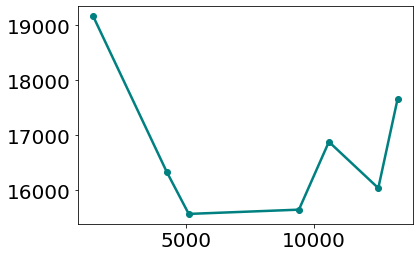

In [95]:
plt.plot(sample_df_distances, samples_gdf_subset.PeuksA/samples_gdf_subset.chl_ap676lh, color='teal', label='Picos', ls='-',lw=2.5,marker='o')
plt.show()

### Calculate MLD in each category

In [96]:
mld_df = pd.read_csv(data_src+'mld_sept21_sw_pcg_corrected090622.csv')

mld_df['datetime'] = pd.to_datetime(mld_df['datetime (UTC)'])
mld_df['utc_dt'] = mld_df['datetime']
mld_df  = mld_df.set_index('utc_dt')
mld_df = mld_df.sort_index(ascending=True)
mld_df

,datetime (UTC),MLD (m),datetime
utc_dt,,,
2021-09-05 13:52:21.803404800,2021-09-05 13:52:21.803404800,-17.739322,2021-09-05 13:52:21.803404800
2021-09-05 13:55:03.008351999,2021-09-05 13:55:03.008351999,-16.929464,2021-09-05 13:55:03.008351999
2021-09-05 13:57:48.150547200,2021-09-05 13:57:48.150547200,-14.743430,2021-09-05 13:57:48.150547200
2021-09-05 14:00:40.557686400,2021-09-05 14:00:40.557686400,-13.460093,2021-09-05 14:00:40.557686400
2021-09-05 14:03:26.652873599,2021-09-05 14:03:26.652873599,-12.009898,2021-09-05 14:03:26.652873599
...,...,...,...
2021-09-07 14:46:45.822345600,2021-09-07 14:46:45.822345600,-25.825381,2021-09-07 14:46:45.822345600
2021-09-07 14:51:36.766310400,2021-09-07 14:51:36.766310400,-28.482889,2021-09-07 14:51:36.766310400
2021-09-07 14:57:35.485632000,2021-09-07 14:57:35.485632000,-27.155214,2021-09-07 14:57:35.485632000


In [97]:
np.median(mld_df['MLD (m)'][14:29]), np.std(mld_df['MLD (m)'][14:29])

(-36.349746914926165, 6.682778417698626)

In [98]:
np.median(mld_df['MLD (m)'][-25:-2]), np.std(mld_df['MLD (m)'][-25:-2])

(-29.81158334192385, 4.343850024911311)

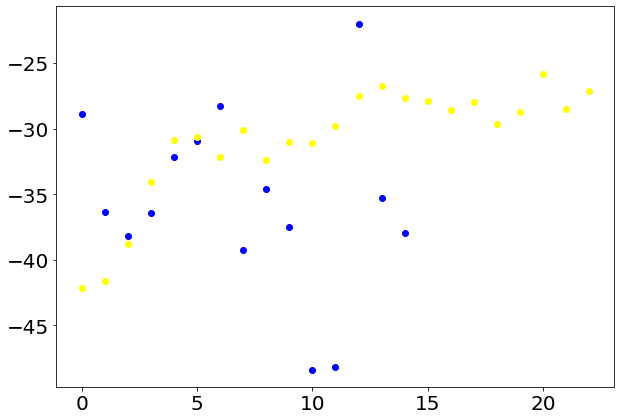

In [99]:
fig, ax = plt.subplots(figsize=(10,7))
ax.scatter(range(len(mld_df['MLD (m)'][14:29])), mld_df['MLD (m)'][14:29], color='blue', label='Gulf Stream')
ax.scatter(range(len(mld_df['MLD (m)'][-25:-2])), mld_df['MLD (m)'][-25:-2], color='Yellow', label='Eddy')

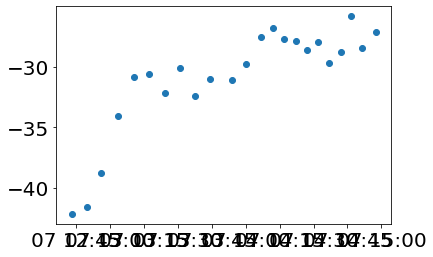

In [100]:
plt.scatter(mld_df.datetime[-25:-2], mld_df['MLD (m)'][-25:-2])

In [101]:
water_mass_code = []
water_mass = []

for i in range(len(mld_df)):
    idx = tsg_df.index[tsg_df.index.get_loc(pd.to_datetime(mld_df.iloc[i].datetime), method='nearest')]
    water_mass_code.append(tsg_df.loc[idx].water_mass_code)
    water_mass.append(tsg_df.loc[idx].water_mass)

mld_df['water_mass_code'] = water_mass_code
mld_df['water_mass'] = water_mass

In [102]:
np.unique(mld_df.water_mass)

array(['eddy', 'gulfstream', 'shelf', 'slope'], dtype=object)

-6.000454074843249
0.6848850369466287
-13.272718713615635
4.344245556042553
-31.108839209231995
6.854609449504655
-29.734042746228752
8.900128753597663


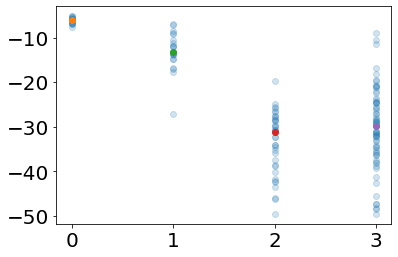

In [103]:
plt.scatter(mld_df.water_mass_code, mld_df['MLD (m)'],alpha=0.2)

for i in range(4):
    plt.scatter(i, np.median(mld_df[mld_df.water_mass_code == i]['MLD (m)']))
    print(np.median(mld_df[mld_df.water_mass_code == i]['MLD (m)']))
    print(np.std(mld_df[mld_df.water_mass_code == i]['MLD (m)']))

### assign all the NCP rows a MLD based on the above calculations and their surface T and S properties

In [105]:
df_ncp['water_mass'] = 'slope'
df_ncp['water_mass'][df_ncp.sal > sal_eddy_gs] = 'eddy'
df_ncp['water_mass'][df_ncp.temp > temp_gs] = 'gulfstream'
df_ncp['water_mass'][df_ncp.sal < sal_shelf] = 'shelf'

df_ncp['water_mass_color'] = 'green' # slope
df_ncp['water_mass_color'][df_ncp.sal > sal_eddy_gs] = 'yellow' # eddy
df_ncp['water_mass_color'][df_ncp.temp > temp_gs] = 'blue' # gulfstream
df_ncp['water_mass_color'][df_ncp.sal < sal_shelf] = 'brown' # shelf

df_ncp['water_mass_code'] = 1
df_ncp['water_mass_code'][df_ncp.sal > sal_eddy_gs] = 2
df_ncp['water_mass_code'][df_ncp.temp > temp_gs] = 3
df_ncp['water_mass_code'][df_ncp.sal < sal_shelf] = 0

In [106]:
updated_mld = np.zeros(len(df_ncp))
updated_mld[df_ncp.water_mass_code == 0] = 6.0
updated_mld[df_ncp.water_mass_code == 1] = 13.3
updated_mld[df_ncp.water_mass_code == 2] = 31.1
updated_mld[df_ncp.water_mass_code == 3] = 29.7

df_ncp['MLD'] = updated_mld

In [107]:
df_ncp['updated_ncp_m3'] = df_ncp.updated_ncp_m2/df_ncp.MLD

<AxesSubplot:xlabel='dt'>

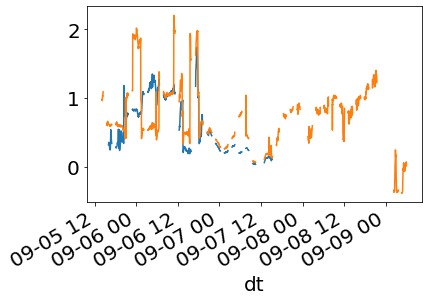

In [108]:
df_ncp['NCP (mmol C m-3 d-1)'].plot()
df_ncp.updated_ncp_m3.plot()

In [110]:
# df_ncp.to_csv('ncp_with_mld.csv')

### Make overview fig for Jess

#### This is a figure for Gronniger et al 2023 that shows all the data from her work overlaid with the physical data and the mean SST

In [111]:
som_df = pd.read_csv(data_src+'SW_DNA_meta_jess_040822.csv')

In [112]:
som_df.head()

,Sample,Temp,Sal,lat,lon,Syn,PicoCyano,Bacteria,ChlaAvg,Sample#,...,sigma,distances,water_mass,DNA,Transect,kcluster4,Order,kcolor,wcolor,Num
0,SW1,27.1014,34.5053,35.628687,-74.903693,93800,107000,1030000,0.22945,1,...,22.201725,-999.000000,slope,1,1,2,1,#00CC00,#00CC00,1
1,SW2,27.1237,34.4413,35.649813,-74.876883,82550,86300,933500,0.21620,2,...,22.147495,233.385724,slope,1,1,2,2,#00CC00,#00CC00,2
2,SW3,27.1541,34.4829,35.649313,-74.879577,80350,79300,891500,0.23245,3,...,22.168430,456.947641,slope,1,1,2,3,#00CC00,#00CC00,3
3,SW4,27.2409,34.7642,35.639493,-74.863198,73500,85400,889000,0.22445,4,...,22.347776,1466.250076,slope,1,1,2,4,#00CC00,#00CC00,4
4,SW6,27.5502,35.0682,35.631058,-74.848755,88800,107000,895000,0.25445,6,...,22.472004,3063.371213,slope,1,1,2,6,#00CC00,#00CC00,6


In [113]:
tsg_df[tsg_df['Sample#'] == 1]

,DateTime,Temp,Sal,Unknown,datetime,lat,lon,geometry,SynA,PeuksA,...,PO4b,SILb,NO2b,NH4b,sigma,sigma_grad,distances,water_mass,water_mass_color,water_mass_code
utc_dt,,,,,,,,,,,,,,,,,,,,,
2021-09-05 12:07:02.003,"09/05/2021,12:07:02.003,",27.1014,34.5053,1539.11,2021-09-05 12:07:02.003,35.628687,-74.903693,POINT (-74.90369 35.62869),97700.0,2780.0,...,0.08,1.1,0.0,0.18,22.201725,-0.0001,-999.0,slope,green,1


In [114]:
water_classes = []
times = []
for i in range(len(som_df)):
    try:
        row = tsg_df[tsg_df['Sample#'] == som_df.iloc[i].Num].iloc[0]
        water_classes.append(row.water_mass)
        times.append(row.datetime)
    except KeyError:
        water_classes.append('none')
        times.append('none')

som_df['water_class'] = water_classes
som_df['datetime'] = times

In [115]:
som_df['utc_dt'] = som_df['datetime']
som_df  = som_df.set_index('utc_dt')
som_df = som_df.sort_index(ascending=True)

In [116]:
goes_df = xr.open_dataset(data_src+'jplStarG16SSTv270_3377_b691_aa78.nc')

In [117]:
goes_df_mean = goes_df.mean(dim='time')

In [118]:
goes_df_mean

<xarray.Dataset>
Dimensions:                  (latitude: 401, longitude: 551)
Coordinates:
  * latitude                 (latitude) float32 38.01 37.99 ... 30.03 30.01
  * longitude                (longitude) float32 -82.99 -82.97 ... -72.01 -71.99
Data variables:
    sea_surface_temperature  (latitude, longitude) float32 nan nan ... 28.65

make maps with NC, coastline, SST and overlaid on it colors based on clusters and shape based ocean group 

In [119]:
som_gdf = gpd.GeoDataFrame(
    som_df, geometry=gpd.points_from_xy(som_df.lon, som_df.lat))

In [120]:
wc_markers = []
wc_colors = [] 
# o, P, *, ^,

for wc in water_classes:
    if wc == 'slope':
        wc_markers.append('o')
#         wc_colors.append('brown')
    elif wc == 'gulfstream':
        wc_markers.append('P')
#         wc_colors.append('blue')
    elif wc == 'shelf':
        wc_markers.append('s')
#         wc_colors.append('green')
    elif wc == 'eddy':
        wc_markers.append('^')
#         wc_colors.append('yellow')

som_gdf['markers'] = wc_markers

In [121]:
wc_markers = []
wc_colors = [] 
# o, P, *, ^,

for kc in som_gdf.kcluster4.values:
    if kc == 1:
        wc_colors.append('#006600')
    elif kc == 2:
        wc_colors.append('#00CC00')
    elif kc == 3:
        wc_colors.append('#0000CC')
    elif kc == 4:
        wc_colors.append('#3399FF')
        
som_gdf['wc_colors'] = wc_colors

In [122]:
color_dict = {1 : "#006600", 2 : "#00CC00", 3 : "#0000CC", 4 : "#3399FF"}

def mscatter(x,y,ax=None, m=None, **kw):
    import matplotlib.markers as mmarkers
    if not ax: ax=plt.gca()
    sc = ax.scatter(x,y,**kw)
    if (m is not None) and (len(m)==len(x)):
        paths = []
        for marker in m:
            if isinstance(marker, mmarkers.MarkerStyle):
                marker_obj = marker
            else:
                marker_obj = mmarkers.MarkerStyle(marker)
            path = marker_obj.get_path().transformed(
                        marker_obj.get_transform())
            paths.append(path)
        sc.set_paths(paths)
    return sc

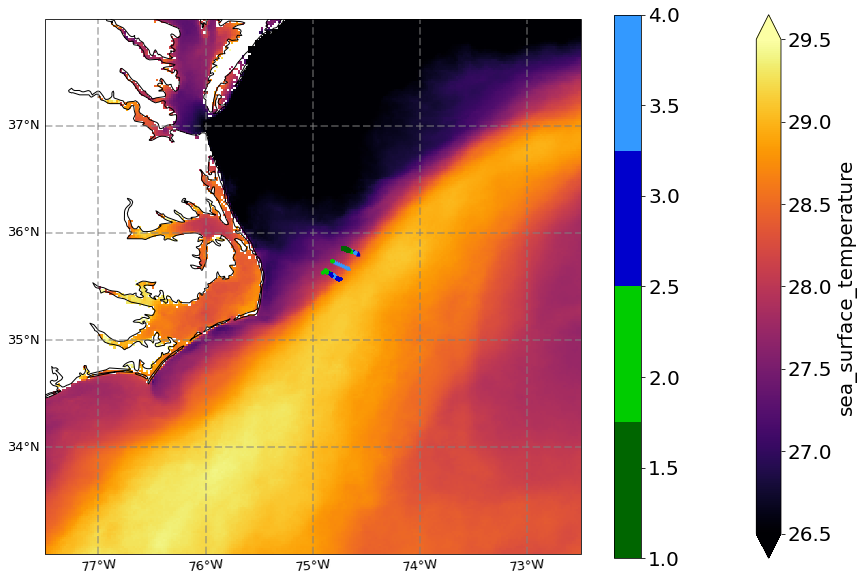

In [123]:
import matplotlib.ticker as mticker
import cartopy.crs as ccrs
import matplotlib.colors as colors


from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER

fig, ax = plt.subplots(figsize=(15,10), subplot_kw=dict(projection=crs.PlateCarree()))
ax.coastlines(resolution='10m')
goes_df_mean.sea_surface_temperature[:,:].plot(ax=ax, vmin=26.5, vmax=29.5, cmap='inferno')

cmap=colors.ListedColormap(list(color_dict.values()))

som_gdf.plot(ax=ax, markersize=1, alpha=1, column="kcluster4", legend=True, cmap=colors.ListedColormap(list(color_dict.values())))
scatter = mscatter(som_gdf.lon, som_gdf.lat, c=wc_colors, s=[10], m=som_gdf.markers, ax=ax)



gl = ax.gridlines(crs=crs.PlateCarree(), draw_labels=True,
                  linewidth=2, color='gray', alpha=0.5, linestyle='--')
gl.xlabels_top = False
gl.ylabels_left = True
gl.ylabels_right = False
# gl.xlines = False
gl.xlocator = mticker.FixedLocator([-73,-74,-75,-76,-77])
gl.ylocator = mticker.FixedLocator([34,35,36,37])
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER
gl.xlabel_style = {'size': 13, 'color': 'black', 'rotation':5}
gl.ylabel_style = {'size': 13, 'color': 'black'}
# gl.xlabel_style = {'color': 'red', 'weight': 'bold'}

# ax.tick_params(axis='x', which='minor', pad=45)

ax.set_xlim(-77.5,-72.5)
ax.set_ylim(33,38)

# fig.savefig('sample_points_overview.png',dpi=400)

plt.show()

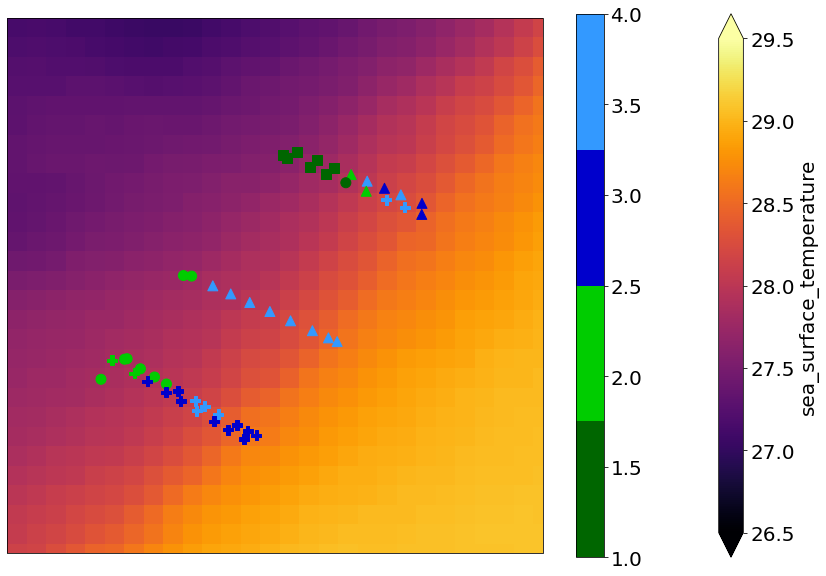

In [124]:
import matplotlib.ticker as mticker
import cartopy.crs as ccrs
import matplotlib.colors as colors

from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER

fig, ax = plt.subplots(figsize=(15,10), subplot_kw=dict(projection=crs.PlateCarree()))
ax.coastlines(resolution='10m')
goes_df_mean.sea_surface_temperature[:,:].plot(ax=ax, vmin=26.5, vmax=29.5, cmap='inferno')


cmap=colors.ListedColormap(list(color_dict.values()))

som_gdf.plot(ax=ax, markersize=1, alpha=1, column="kcluster4", legend=True, cmap=colors.ListedColormap(list(color_dict.values())))
scatter = mscatter(som_gdf.lon, som_gdf.lat, c=wc_colors, s=[100], m=som_gdf.markers, ax=ax)


gl = ax.gridlines(crs=crs.PlateCarree(), draw_labels=True,
                  linewidth=2, color='gray', alpha=0.5, linestyle='--')
gl.xlabels_top = False
gl.ylabels_left = True
gl.ylabels_right = False
# gl.xlines = False
gl.xlocator = mticker.FixedLocator([-73,-74,-75,-76,-77])
gl.ylocator = mticker.FixedLocator([34,35,36,37])
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER
gl.xlabel_style = {'size': 13, 'color': 'black', 'rotation':5}
gl.ylabel_style = {'size': 13, 'color': 'black'}
# gl.xlabel_style = {'color': 'red', 'weight': 'bold'}

# ax.tick_params(axis='x', which='minor', pad=45)

ax.set_xlim(-75,-74.45)
ax.set_ylim(35.45,36)

# fig.savefig('sample_points_overview_zoom2.png',dpi=400)


plt.show()

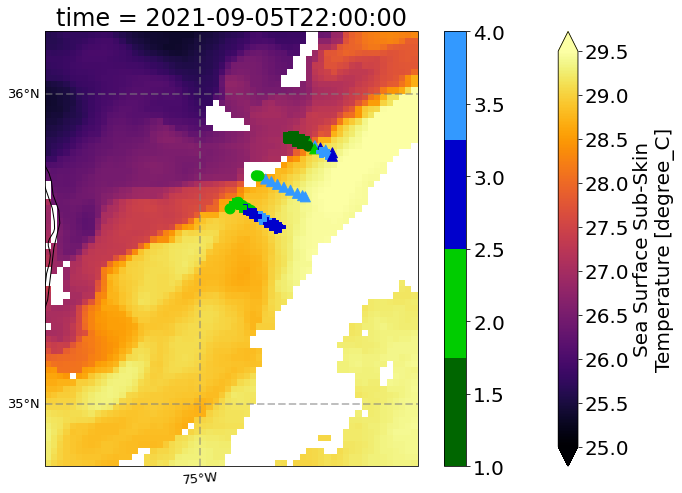

In [125]:
fig, ax = plt.subplots(figsize=(12,8), subplot_kw=dict(projection=crs.PlateCarree()))
ax.coastlines(resolution='10m')
goes_df.sea_surface_temperature[860].plot(ax=ax, vmin=25, vmax=29.5, cmap='inferno')
# gdf_subset.loc[start_times[0]:end_times[0]].plot(ax=ax, markersize=3, color='red', alpha=1)
# fig.savefig('sst_sept0523_studypoints.png',dpi=400)




# fig.savefig('goes_sst_sept0512.png',dpi=400)
# ax[1].set_title(titles[i] + ' zoom')
# fig.tight_layout()
#     fig.savefig('figs/'+titles[i] +'sat_overview.png')
#     plt.close()

som_gdf.plot(ax=ax, markersize=1, alpha=1, column="kcluster4", legend=True, cmap=colors.ListedColormap(list(color_dict.values())))
scatter = mscatter(som_gdf.lon, som_gdf.lat, c=wc_colors, s=[100], m=som_gdf.markers, ax=ax)

gl = ax.gridlines(crs=crs.PlateCarree(), draw_labels=True,
                  linewidth=2, color='gray', alpha=0.5, linestyle='--')
gl.xlabels_top = False
gl.ylabels_left = True
gl.ylabels_right = False
# gl.xlines = False
gl.xlocator = mticker.FixedLocator([-73,-74,-75,-76,-77])
gl.ylocator = mticker.FixedLocator([34,35,36,37])
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER
gl.xlabel_style = {'size': 13, 'color': 'black', 'rotation':5}
gl.ylabel_style = {'size': 13, 'color': 'black'}
# gl.xlabel_style = {'color': 'red', 'weight': 'bold'}

# ax.tick_params(axis='x', which='minor', pad=45)

ax.set_xlim(-75.5,-74.3)
ax.set_ylim(34.8,36.2)
# fcm_gdf.plot(ax=ax, markersize=15, column='Chla_Avg', vmin=.1,vmax=.25, cmap='jet')
# plt.savefig('sampling_locations_sept4-9.png',dpi=300)
plt.show()

Look at the sampling locations in SST satellite imagery

In [126]:
goes_idxs = [852,858, 876, 881, 898]

In [127]:
som_gdf.loc[start_times[8]:end_times[8]]

,Sample,Temp,Sal,lat,lon,Syn,PicoCyano,Bacteria,ChlaAvg,Sample#,...,kcluster4,Order,kcolor,wcolor,Num,water_class,datetime,geometry,markers,wc_colors
utc_dt,,,,,,,,,,,,,,,,,,,,,
2021-09-07 12:49:03.388,SW70,28.0566,35.9828,35.671250,-74.670177,18300,126000,663500,0.12045,70,...,4,70,#3399FF,#0000CC,70,eddy,2021-09-07 12:49:03.388,POINT (-74.67018 35.67125),^,#3399FF
2021-09-07 13:07:03.418,SW72,28.0552,35.9347,35.678617,-74.686632,25600,107000,646500,0.12995,72,...,4,72,#3399FF,#0000CC,72,eddy,2021-09-07 13:07:03.418,POINT (-74.68663 35.67862),^,#3399FF
2021-09-07 13:29:03.407,SW74,28.1195,35.8671,35.688773,-74.709095,18200,136000,626500,0.12770,74,...,4,74,#3399FF,#0000CC,74,eddy,2021-09-07 13:29:03.407,POINT (-74.70910 35.68877),^,#3399FF
2021-09-07 13:44:03.413,SW76,28.1592,35.9186,35.698303,-74.730277,20000,114000,662500,0.12795,76,...,4,76,#3399FF,#0000CC,77,eddy,2021-09-07 13:44:03.413,POINT (-74.73028 35.69830),^,#3399FF
2021-09-07 14:09:03.439,SW78,28.2155,35.9103,35.707600,-74.750942,18950,119000,636500,0.13545,78,...,4,78,#3399FF,#0000CC,78,eddy,2021-09-07 14:09:03.439,POINT (-74.75094 35.70760),^,#3399FF
2021-09-07 14:28:03.438,SW80,28.1231,35.8558,35.716382,-74.770485,16850,123000,578000,0.17370,80,...,4,80,#3399FF,#0000CC,80,eddy,2021-09-07 14:28:03.438,POINT (-74.77048 35.71638),^,#3399FF
2021-09-07 14:46:03.436,SW82,28.0265,35.8668,35.724680,-74.788887,19500,118000,627000,NaN,82,...,4,82,#3399FF,#0000CC,82,eddy,2021-09-07 14:46:03.436,POINT (-74.78889 35.72468),^,#3399FF
2021-09-07 15:07:03.460,SW84,27.5504,35.4482,35.734663,-74.810643,34200,102000,794000,NaN,84,...,2,84,#00CC00,#00CC00,84,slope,2021-09-07 15:07:03.460,POINT (-74.81064 35.73466),o,#00CC00
2021-09-07 15:23:03.459,SW86,27.4123,35.1827,35.735258,-74.819117,47450,75400,751000,NaN,86,...,2,86,#00CC00,#00CC00,86,slope,2021-09-07 15:23:03.459,POINT (-74.81912 35.73526),o,#00CC00


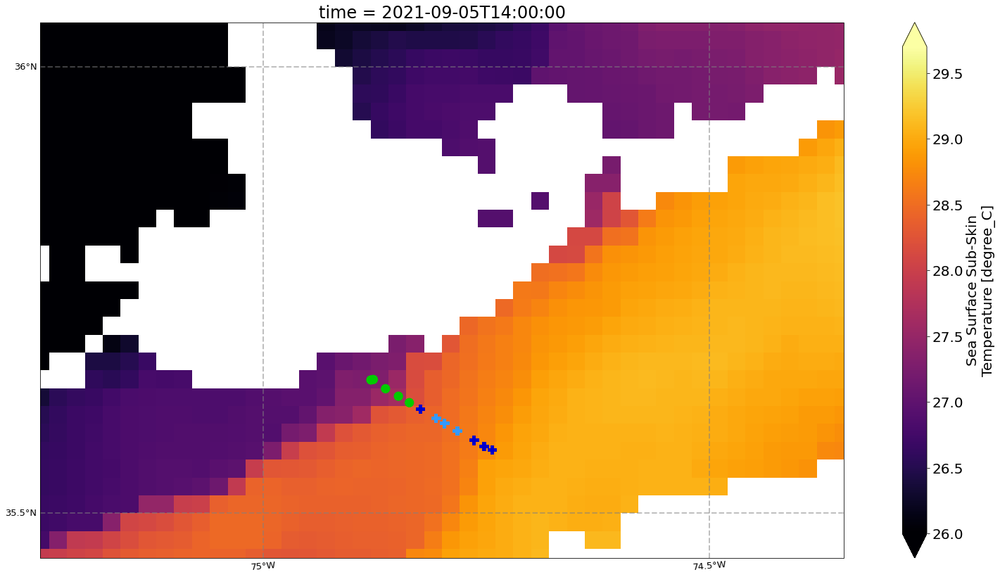

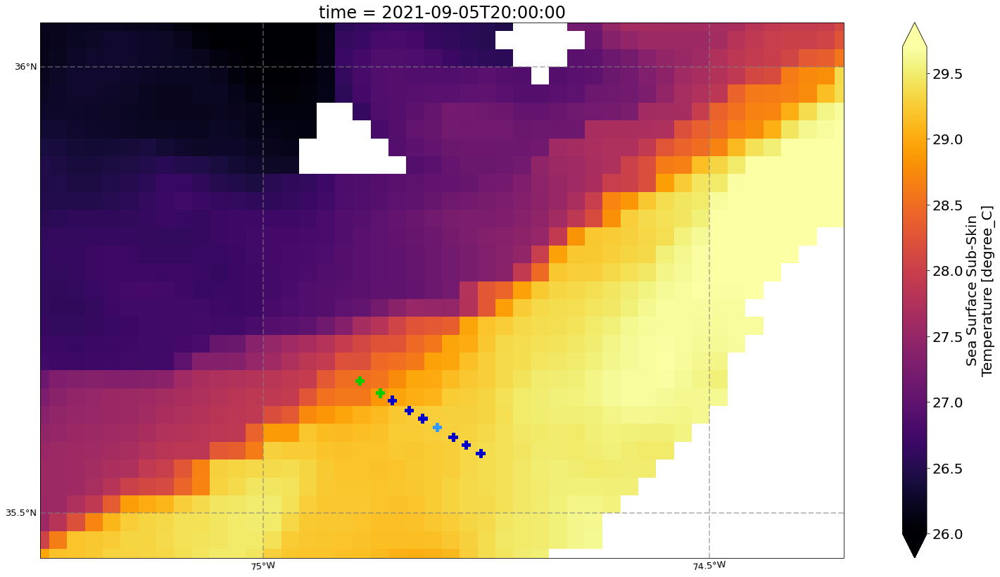

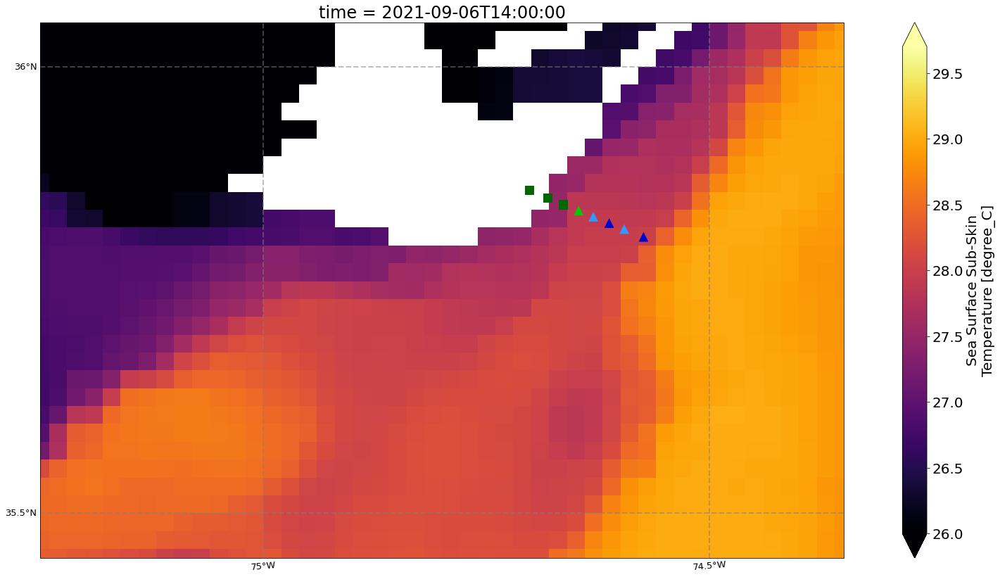

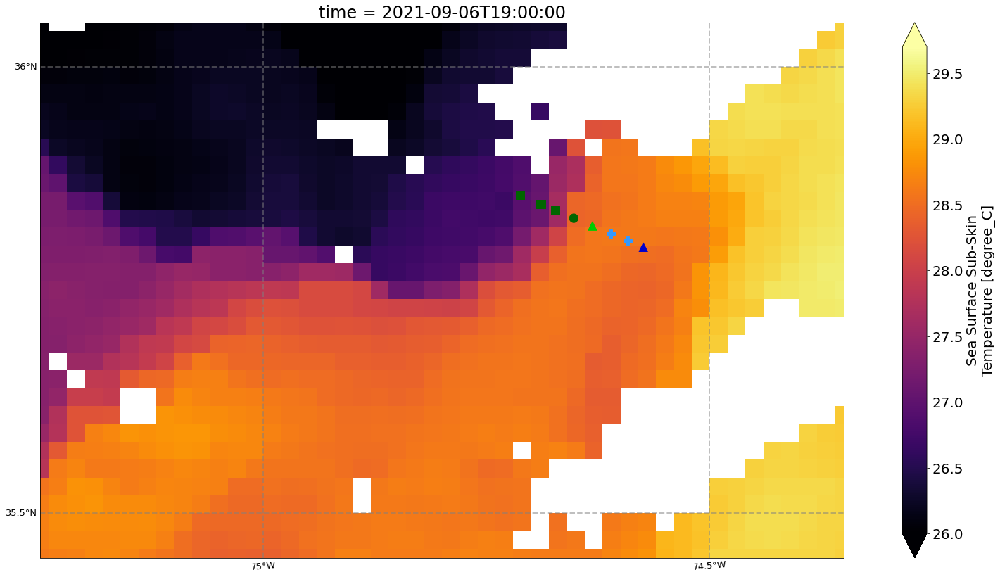

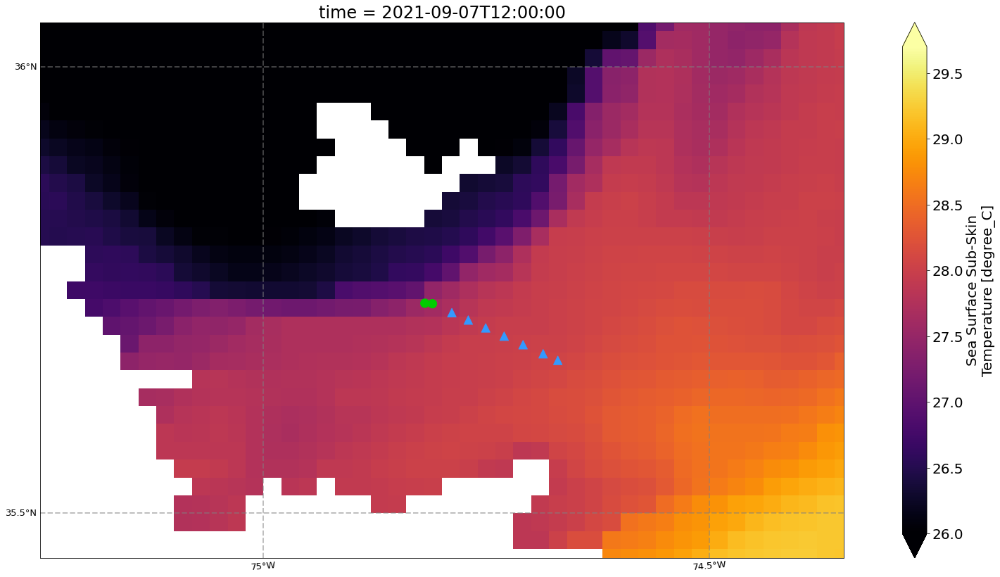

In [128]:
for goes_idx,time_idx in enumerate([0,1,4,5,8]):
    fig, ax = plt.subplots(figsize=(30,14), subplot_kw=dict(projection=crs.PlateCarree()))
    ax.coastlines(resolution='10m')
    goes_df.sea_surface_temperature[goes_idxs[goes_idx]].plot(ax=ax, vmin=26, vmax=29.7, cmap='inferno')
    # gdf_subset.loc[start_times[0]:end_times[0]].plot(ax=ax, markersize=3, color='red', alpha=1)
    # fig.savefig('sst_sept0523_studypoints.png',dpi=400)

    # fig.savefig('goes_sst_sept0512.png',dpi=400)
    # ax[1].set_title(titles[i] + ' zoom')
    # fig.tight_layout()
    #     fig.savefig('figs/'+titles[i] +'sat_overview.png')
    #     plt.close()

    som_gdf_sub = som_gdf.loc[start_times[time_idx]:end_times[time_idx]]

    som_gdf_sub.plot(ax=ax, markersize=1, alpha=1, column="kcluster4", legend=False, cmap=colors.ListedColormap(list(color_dict.values())))
    scatter = mscatter(som_gdf_sub.lon, som_gdf_sub.lat, c=som_gdf_sub.wc_colors, s=[150], m=som_gdf_sub.markers, ax=ax)

    gl = ax.gridlines(crs=crs.PlateCarree(), draw_labels=True,
                      linewidth=2, color='gray', alpha=0.5, linestyle='--')
    gl.xlabels_top = False
    gl.ylabels_left = True
    gl.ylabels_right = False
    # gl.xlines = False
    gl.xlocator = mticker.FixedLocator([-74.5,-75])
    gl.ylocator = mticker.FixedLocator([35.5,36])
    gl.xformatter = LONGITUDE_FORMATTER
    gl.yformatter = LATITUDE_FORMATTER
    gl.xlabel_style = {'size': 13, 'color': 'black', 'rotation':5}
    gl.ylabel_style = {'size': 13, 'color': 'black'}
    # gl.xlabel_style = {'color': 'red', 'weight': 'bold'}

    # ax.tick_params(axis='x', which='minor', pad=45)

    ax.set_xlim(-75.25,-74.35)
    ax.set_ylim(35.45,36.05)
    # fcm_gdf.plot(ax=ax, markersize=15, column='Chla_Avg', vmin=.1,vmax=.25, cmap='jet')
#     plt.savefig('sampling_locations_zoom_transect'+str(time_idx+1)+'.png',dpi=300)
    plt.show()

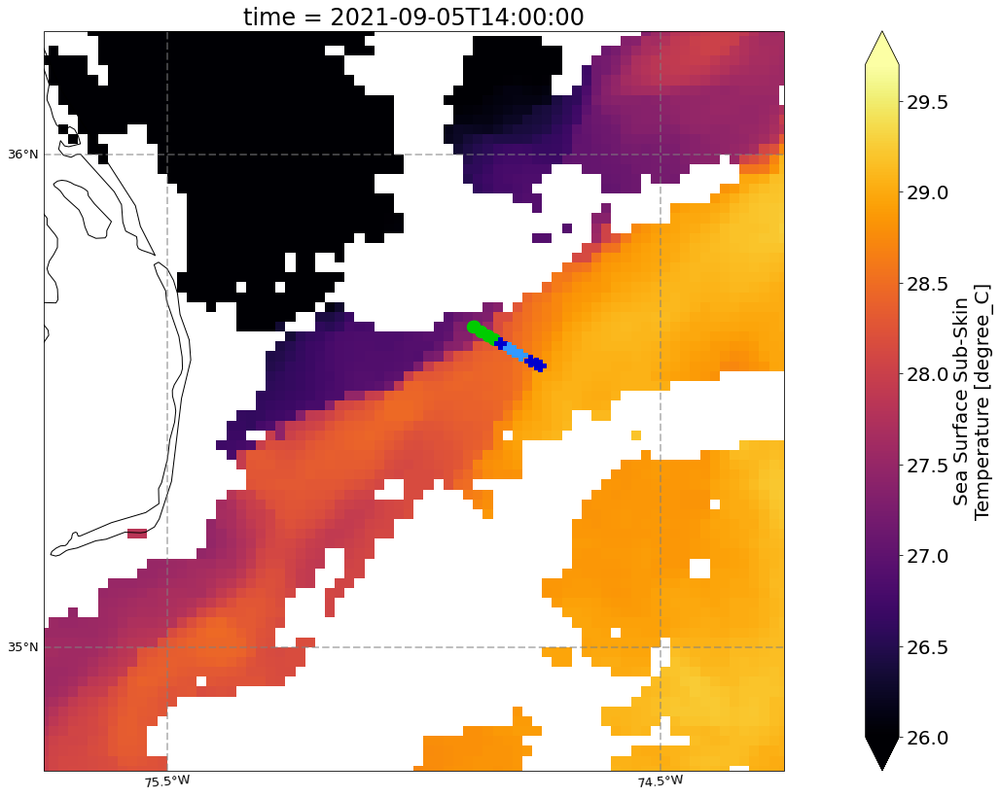

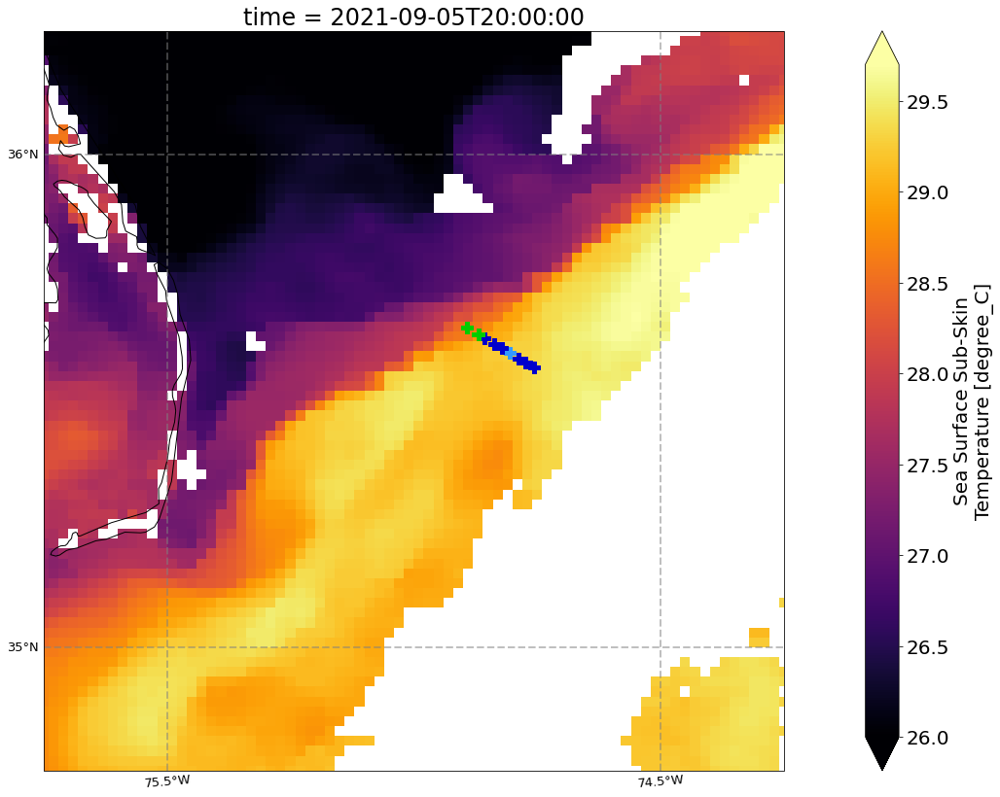

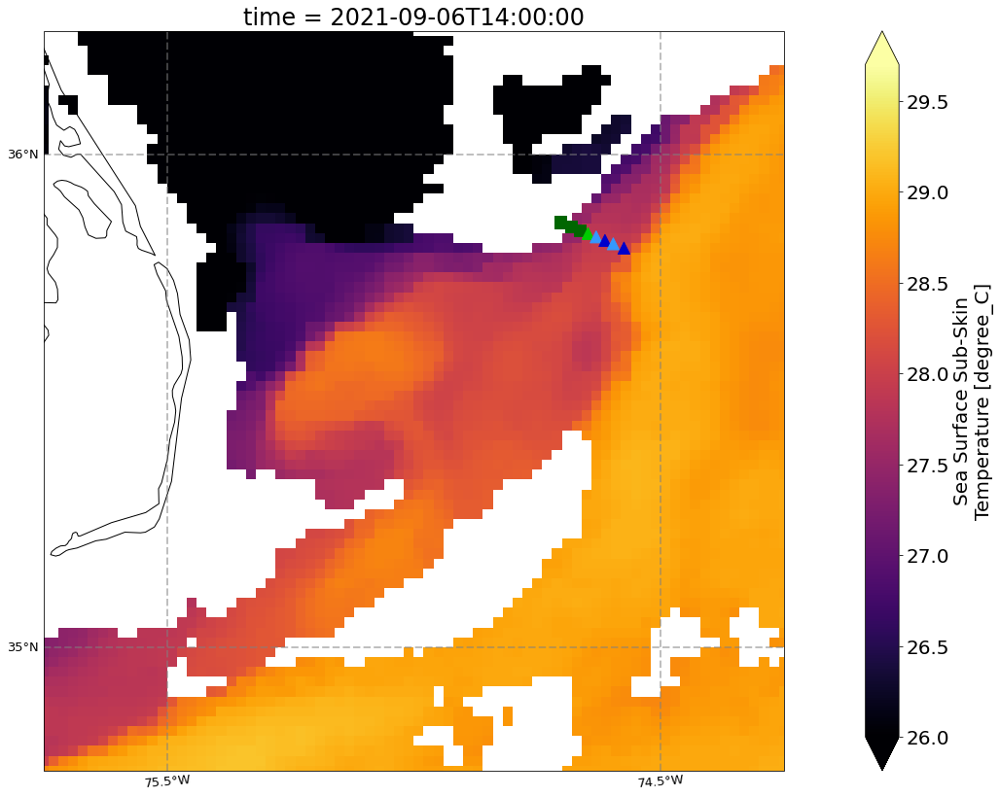

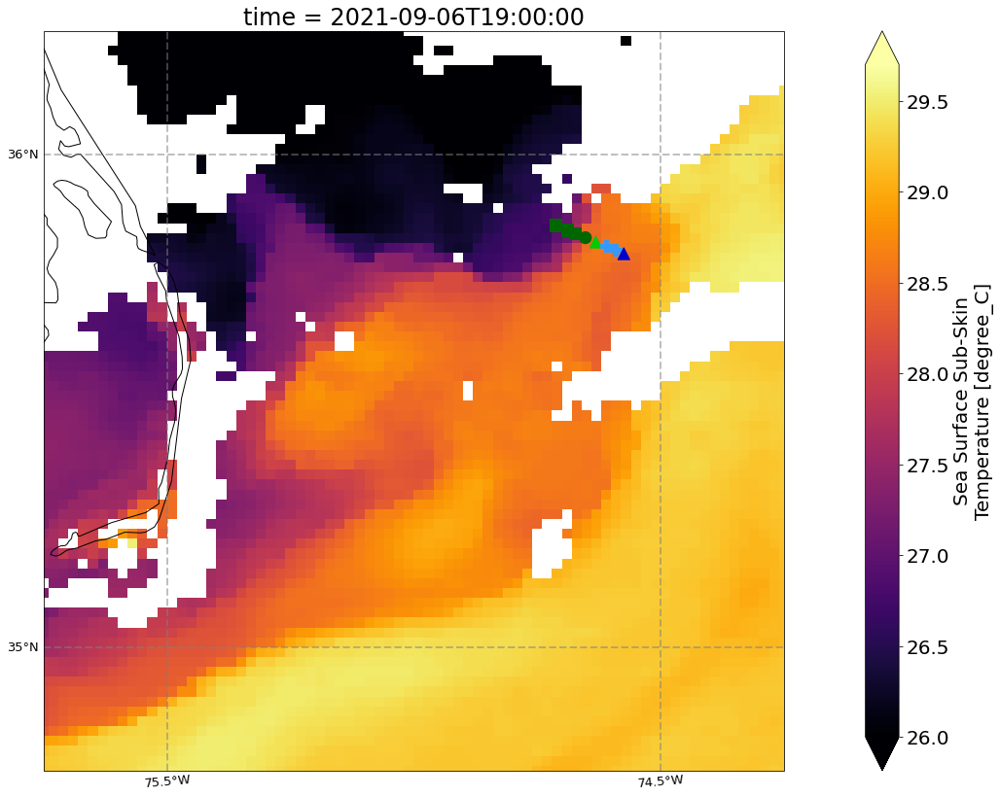

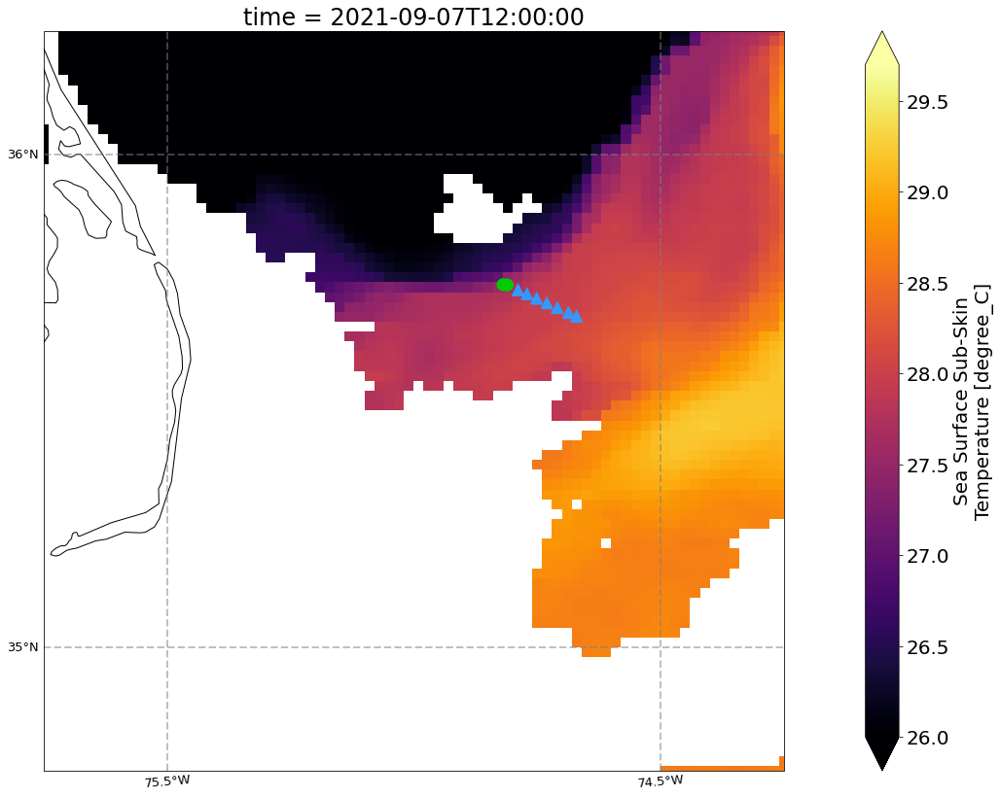

In [129]:
for goes_idx,time_idx in enumerate([0,1,4,5,8]):
    fig, ax = plt.subplots(figsize=(30,14), subplot_kw=dict(projection=crs.PlateCarree()))
    ax.coastlines(resolution='10m')
    goes_df.sea_surface_temperature[goes_idxs[goes_idx]].plot(ax=ax, vmin=26, vmax=29.7, cmap='inferno')
    # gdf_subset.loc[start_times[0]:end_times[0]].plot(ax=ax, markersize=3, color='red', alpha=1)
    # fig.savefig('sst_sept0523_studypoints.png',dpi=400)

    # fig.savefig('goes_sst_sept0512.png',dpi=400)
    # ax[1].set_title(titles[i] + ' zoom')
    # fig.tight_layout()
    #     fig.savefig('figs/'+titles[i] +'sat_overview.png')
    #     plt.close()

    som_gdf_sub = som_gdf.loc[start_times[time_idx]:end_times[time_idx]]

    som_gdf_sub.plot(ax=ax, markersize=1, alpha=1, column="kcluster4", legend=False, cmap=colors.ListedColormap(list(color_dict.values())))
    scatter = mscatter(som_gdf_sub.lon, som_gdf_sub.lat, c=som_gdf_sub.wc_colors, s=[150], m=som_gdf_sub.markers, ax=ax)

    gl = ax.gridlines(crs=crs.PlateCarree(), draw_labels=True,
                      linewidth=2, color='gray', alpha=0.5, linestyle='--')
    gl.xlabels_top = False
    gl.ylabels_left = True
    gl.ylabels_right = False
    # gl.xlines = False
    gl.xlocator = mticker.FixedLocator([-74.5,-75.5])
    gl.ylocator = mticker.FixedLocator([35,36])
    gl.xformatter = LONGITUDE_FORMATTER
    gl.yformatter = LATITUDE_FORMATTER
    gl.xlabel_style = {'size': 13, 'color': 'black', 'rotation':5}
    gl.ylabel_style = {'size': 13, 'color': 'black'}
    # gl.xlabel_style = {'color': 'red', 'weight': 'bold'}

    # ax.tick_params(axis='x', which='minor', pad=45)

    ax.set_xlim(-75.75,-74.25)
    ax.set_ylim(34.75,36.25)
    # fcm_gdf.plot(ax=ax, markersize=15, column='Chla_Avg', vmin=.1,vmax=.25, cmap='jet')
#     plt.savefig('sampling_locations_lesszoom_transect'+str(time_idx+1)+'.png',dpi=300)
    plt.show()

Grab just the daytime transects

In [130]:
start_times = ['2021-09-5 13:00:00',
 '2021-09-5 18:15:00',
 '2021-09-6 12:30:00',
 '2021-09-6 16:45:00',
 '2021-09-7 12:10:00']

end_times = ['2021-09-5 17:30:00',
 '2021-09-5 20:30:00',
 '2021-09-6 15:00:00',
 '2021-09-6 19:20:00',
 '2021-09-7 15:30:00']

dfs = []
for i in range(len(start_times)):
    dfs.append(tsg_df.loc[start_times[i]:end_times[i]])
tsg_df_subset = pd.concat(dfs)

Get all the transects

In [131]:
start_times = ['2021-09-5 13:00:00', '2021-09-5 18:15:00', '2021-09-6 1:00:00', '2021-09-6 5:10:00', '2021-09-6 12:30:00', '2021-09-6 16:45:00', '2021-09-7 2:55:00', '2021-09-7 6:45:00', '2021-09-7 12:10:00']
end_times = ['2021-09-5 17:30:00','2021-09-5 20:30:00', '2021-09-6 4:00:00', '2021-09-6 6:45:00', '2021-09-6 15:00:00', '2021-09-6 19:20:00', '2021-09-7 5:35:00', '2021-09-7 9:00:00', '2021-09-7 15:30:00']

dfs = []
for i in range(len(start_times)):
    dfs.append(tsg_df.loc[start_times[i]:end_times[i]])
tsg_df_subset = pd.concat(dfs)

In [132]:
# tsg_df_subset.to_csv('sept_sw_all_transects.csv')

In [133]:
dfs = []
for i in range(len(start_times)):
    dfs.append(df_ncp.loc[start_times[i]:end_times[i]])
ncp_df_subset = pd.concat(dfs)

In [135]:
x = [1,2,1,0]
y = [2,1,0,1]

temp_gs = 28.225
sal_eddy_gs = 35.8
sal_shelf = 34

tsg_df['water_mass'] = 'slope'
tsg_df['water_mass'][tsg_df.Sal > sal_eddy_gs] = 'eddy'
tsg_df['water_mass'][tsg_df.Temp > temp_gs] = 'gulfstream'
tsg_df['water_mass'][tsg_df.Sal < sal_shelf] = 'shelf'

tsg_df['water_mass_color'] = 'green' # slope
tsg_df['water_mass_color'][tsg_df.Sal > sal_eddy_gs] = 'yellow' # eddy
tsg_df['water_mass_color'][tsg_df.Temp > temp_gs] = 'blue' # gulfstream
tsg_df['water_mass_color'][tsg_df.Sal < sal_shelf] = 'brown' # shelf

tsg_df['water_mass_code'] = 1
tsg_df['water_mass_code'][tsg_df.Sal > sal_eddy_gs] = 2
tsg_df['water_mass_code'][tsg_df.Temp > temp_gs] = 3
tsg_df['water_mass_code'][tsg_df.Sal < sal_shelf] = 0

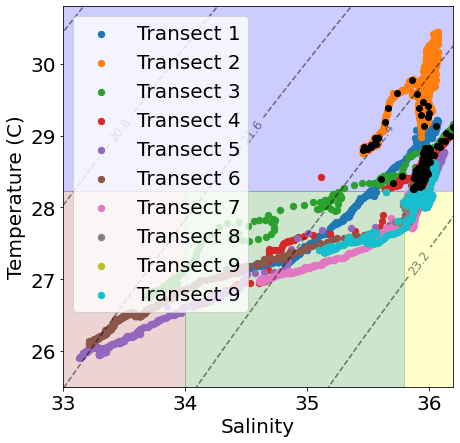

In [136]:
# Figure out boudaries (mins and maxs)
smin = 33-.7
smax = 36.2+.7
tmin = 25-.7
tmax = 30.8+.7

# Calculate how many gridcells we need in the x and y dimensions
xdim = int(round((smax-smin)/0.1+1,0))
ydim = int(round((tmax-tmin)+1,0))
 
# Create empty grid of zeros
dens = np.zeros((ydim,xdim))
 
# Create temp and salt vectors of appropiate dimensions
ti = np.linspace(1,ydim-1,ydim)+tmin
si = np.linspace(1,xdim-1,xdim)*0.1+smin
 
# Loop to fill in grid with densities
for j in range(0,int(ydim)):
    for i in range(0, int(xdim)):
        dens[j,i]=gsw.rho(si[i],ti[j],0)

# Substract 1000 to convert to sigma-t
dens = dens - 1000


    
# plot T and S diagrams first with distance from coast and then with other variables
fig, ax = plt.subplots(figsize=(7,7))
markersize=40

ax.fill_between([smin,smax],temp_gs,temp_gs+5,color='blue',alpha=.2)
ax.fill_between([sal_eddy_gs,smax],tmin,temp_gs,color='yellow',alpha=.2)
ax.fill_between([smin,sal_shelf],tmin,temp_gs,color='brown',alpha=.2)
ax.fill_between([sal_shelf,sal_eddy_gs],tmin,temp_gs,color='green',alpha=.2)


ax.set_xlim(33,36.2)
ax.set_ylim(25.5,30.8)
ax.set_xlabel('Salinity')
ax.set_ylabel('Temperature (C)')

CS = ax.contour(si,ti,dens, linestyles='dashed', colors='k', alpha=0.5)
ax.clabel(CS, fontsize=12, inline=1, fmt='%1.1f') # Label every second level
# ellipse = Ellipse(xy=(35.88, 28.05), width=0.5, height=1.2, angle=-20,
#                 edgecolor='k', fc='None', ls='--', lw=2)
# ax.add_patch(ellipse)
alpha=0.01

# colors=['blue','green','orange','red', 'aqua',]

# for idx,i in enumerate([0,1,4,5,8]):
for idx,i in enumerate([0,1,2,3,4,5,6,7,8]):
    df_subset_full = tsg_df.loc[start_times[i]:end_times[i]]
    im = ax.scatter(df_subset_full.Sal, df_subset_full.Temp, s=markersize,alpha=1, label='Transect '+str(i+1))
    

ax.scatter(df_subset_full.Sal, df_subset_full.Temp, s=markersize,alpha=1, label='Transect '+str(i+1))


optical_cp_subset = optical_df_quality[optical_df_quality['cp_12'] > .23]
optical_cp_subset = optical_cp_subset[optical_cp_subset.water_mass == 'gulfstream']
ax.scatter(optical_cp_subset.sal, optical_cp_subset.temp, c='black')
    
ax.legend()
# fig.savefig('figs/simple_t_s_diagram_all_transects_with_divisions.png',dpi=300)


##########################
Transect 1
##########################


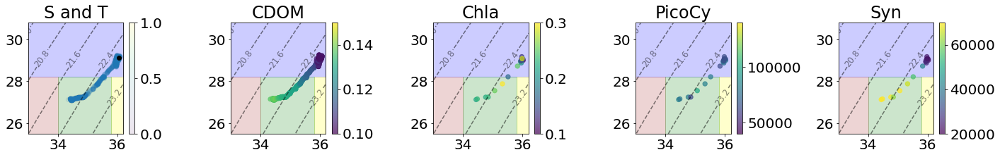

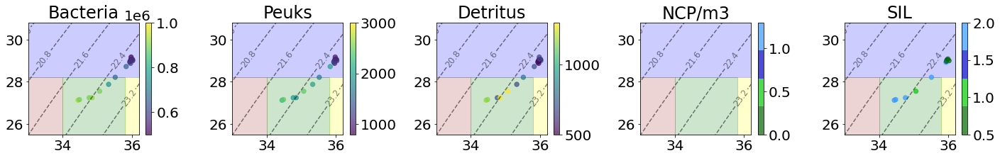

##########################
Transect 2
##########################


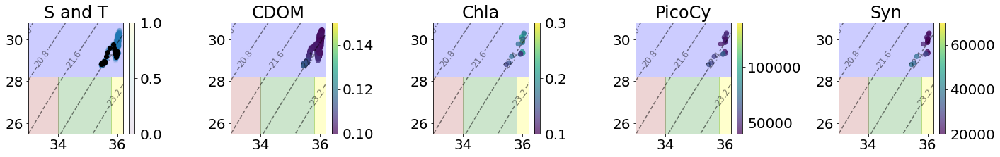

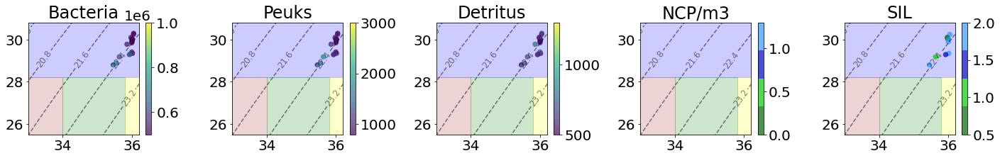

##########################
Transect 3
##########################


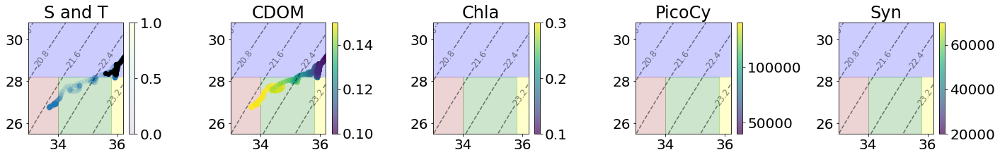

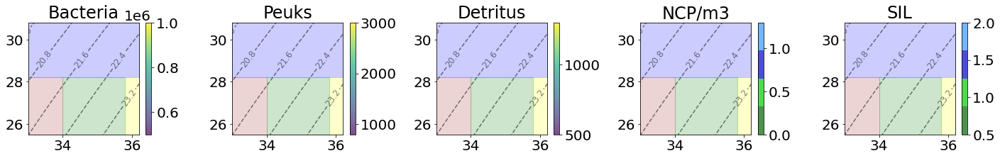

##########################
Transect 4
##########################


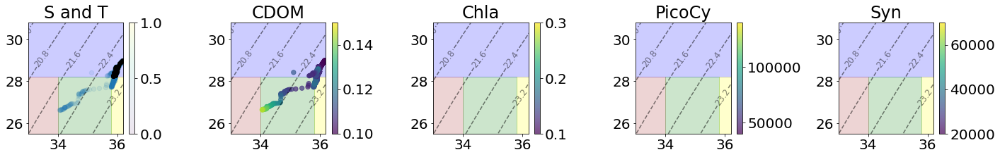

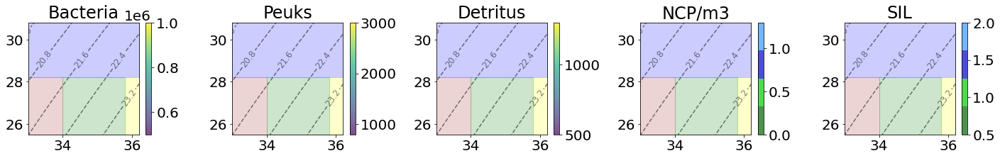

##########################
Transect 5
##########################


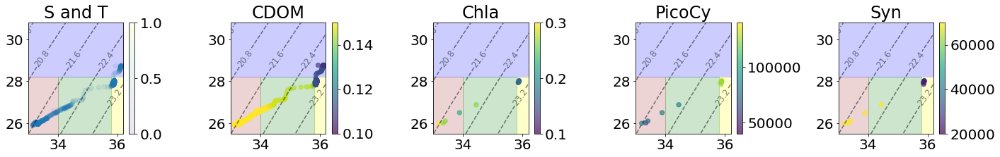

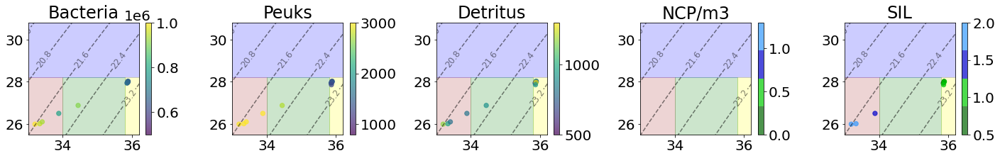

##########################
Transect 6
##########################


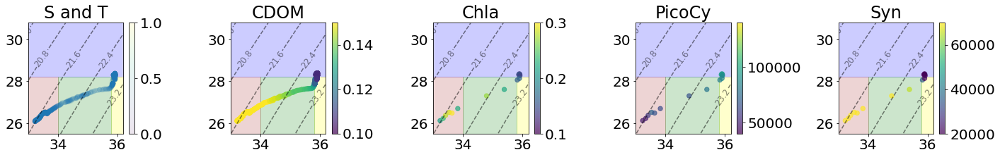

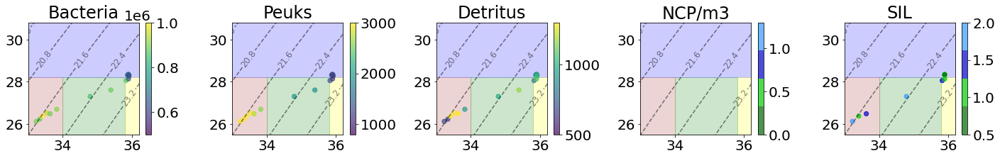

##########################
Transect 7
##########################


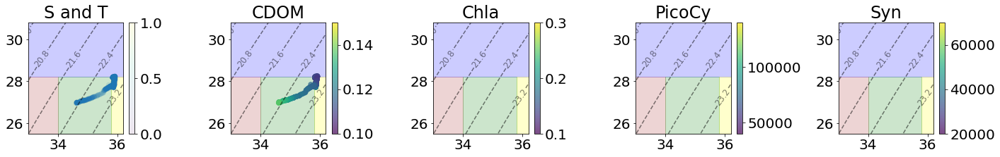

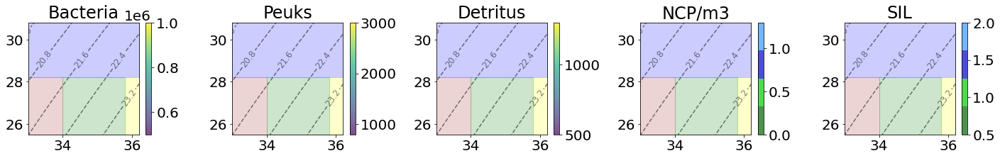

##########################
Transect 8
##########################


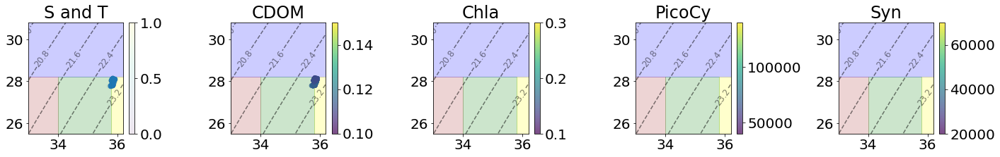

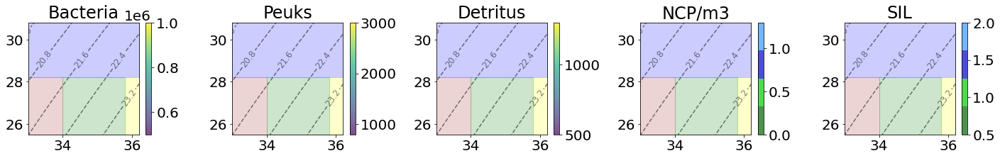

##########################
Transect 9
##########################


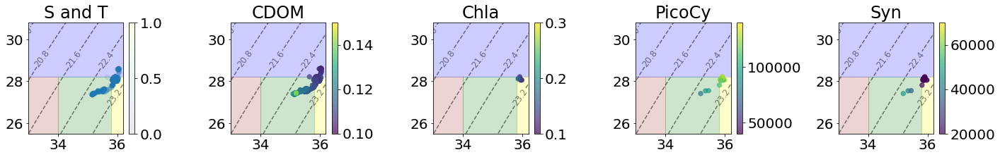

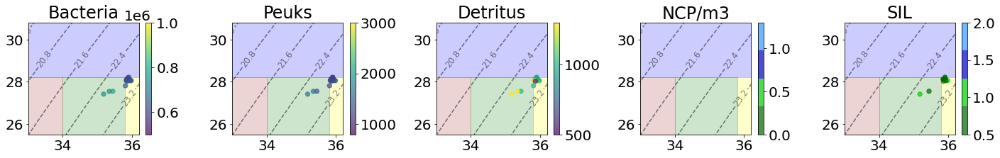

In [137]:
# Figure out boudaries (mins and maxs)
smin = 33-.7
smax = 36.2+.7
tmin = 25-.7
tmax = 30.8+.7

# Calculate how many gridcells we need in the x and y dimensions
xdim = int(round((smax-smin)/0.1+1,0))
ydim = int(round((tmax-tmin)+1,0))
 
# Create empty grid of zeros
dens = np.zeros((ydim,xdim))
 
# Create temp and salt vectors of appropiate dimensions
ti = np.linspace(1,ydim-1,ydim)+tmin
si = np.linspace(1,xdim-1,xdim)*0.1+smin
 
# Loop to fill in grid with densities
for j in range(0,int(ydim)):
    for i in range(0, int(xdim)):
        dens[j,i]=gsw.rho(si[i],ti[j],0)

# Substract 1000 to convert to sigma-t
dens = dens - 1000


# for outer_idx, i in enumerate([0,1,4,5,8]):
for outer_idx,i in enumerate([0,1,2,3,4,5,6,7,8]):
    print('##########################')
    print('Transect ' + str(i+1))
    print('##########################')
    
    # plot T and S diagrams first with distance from coast and then with other variables
    fig, ax = plt.subplots(1,5,figsize=(5*4,3.5))
    df_subset_full = tsg_df.loc[start_times[i]:end_times[i]]
    df_subset = df_subset_full[df_subset_full['BacteriaA'].notnull()]
    markersize=40
        
    titles = ['S and T','CDOM', 'Chla', 'PicoCy', 'Syn']
    
    for idx,a in enumerate([ax[0], ax[1], ax[2],ax[3],ax[4]]):
        a.fill_between([smin,smax],temp_gs,temp_gs+5,color='blue',alpha=.2)
        a.fill_between([sal_eddy_gs,smax],tmin,temp_gs,color='yellow',alpha=.2)
        a.fill_between([smin,sal_shelf],tmin,temp_gs,color='brown',alpha=.2)
        a.fill_between([sal_shelf,sal_eddy_gs],tmin,temp_gs,color='green',alpha=.2)

        a.set_xlim(33,36.2)
        a.set_ylim(25.5,30.8)
#         a.set_xlabel('Salinity')
#         a.set_ylabel('Temperature (C)')
        a.set_title(titles[idx])
        CS = a.contour(si,ti,dens, linestyles='dashed', colors='k', alpha=0.5)
        a.clabel(CS, fontsize=12, inline=1, fmt='%1.1f') # Label every second level
#         ellipse = Ellipse(xy=(35.88, 28.05), width=0.5, height=1.2, angle=-20,
#                         edgecolor='k', fc='None', ls='--', lw=2)
#         a.add_patch(ellipse)
        
    alpha=0.7
    im = ax[0].scatter(df_subset_full.Sal, df_subset_full.Temp, s=markersize,alpha=0.1)
    fig.colorbar(im,ax=ax[0])
    im = ax[1].scatter(df_subset_full.Sal, df_subset_full.Temp, s=markersize, c=df_subset_full.cdomVolts, vmin=0.1,vmax=.15,alpha=alpha)
    fig.colorbar(im,ax=ax[1])    
    im=ax[2].scatter(df_subset.Sal, df_subset.Temp, s=markersize, c=df_subset.ChlaAvg, vmin=.1,vmax=.3,alpha=alpha)
    fig.colorbar(im,ax=ax[2])
    im = ax[3].scatter(df_subset_full.Sal, df_subset_full.Temp, s=markersize, c=(df_subset_full.PicoCyanoA+df_subset_full.PicoCyanoB)/2, vmin=40000,vmax=140000,alpha=alpha)
    fig.colorbar(im,ax=ax[3])
    im = ax[4].scatter(df_subset_full.Sal, df_subset_full.Temp, s=markersize, c=(df_subset_full.SynA+df_subset_full.SynB)/2, vmin=20000,vmax=70000,alpha=alpha)
    fig.colorbar(im,ax=ax[4])
    
    optical_cp_subset = optical_df_quality[optical_df_quality['cp_12'] > .23]
    optical_cp_subset = optical_cp_subset[optical_cp_subset.water_mass == 'gulfstream']
    optical_cp_subset = optical_cp_subset.loc[start_times[i]:end_times[i]]
    ax[0].scatter(optical_cp_subset.sal, optical_cp_subset.temp, c='black')
    
    fig.tight_layout()
#     fig.savefig('figs/t_s_diagram_transect_'+str(i+1)+'_1.png',dpi=300)
    plt.show()
    
        # plot T and S diagrams first with distance from coast and then with other variables
    fig, ax = plt.subplots(1,5,figsize=(5*4,3.5))
    df_subset_full = tsg_df.loc[start_times[i]:end_times[i]]
    df_subset = df_subset_full[df_subset_full['BacteriaA'].notnull()]
    markersize=40
        
    titles = ['Bacteria','Peuks', 'Detritus', 'NCP/m3', 'SIL']
    
    for idx,a in enumerate([ax[0], ax[1], ax[2],ax[3],ax[4]]):

        a.set_xlim(33,36.2)
        a.set_ylim(25.5,30.8)
        a.fill_between([smin,smax],temp_gs,temp_gs+5,color='blue',alpha=.2)
        a.fill_between([sal_eddy_gs,smax],tmin,temp_gs,color='yellow',alpha=.2)
        a.fill_between([smin,sal_shelf],tmin,temp_gs,color='brown',alpha=.2)
        a.fill_between([sal_shelf,sal_eddy_gs],tmin,temp_gs,color='green',alpha=.2)
#         a.set_xlabel('Salinity')
#         a.set_ylabel('Temperature (C)')
        a.set_title(titles[idx])
        CS = a.contour(si,ti,dens, linestyles='dashed', colors='k', alpha=0.5)
        a.clabel(CS, fontsize=12, inline=1, fmt='%1.1f') # Label every second level
#         ellipse = Ellipse(xy=(35.88, 28.05), width=0.5, height=1.2, angle=-20,
#                         edgecolor='k', fc='None', ls='--', lw=2)
#         a.add_patch(ellipse)

        
    alpha=0.7
    im = ax[0].scatter(df_subset_full.Sal, df_subset_full.Temp, s=markersize,c=(df_subset_full.BacteriaA+df_subset_full.BacteriaB)/2, vmin=.5e6,vmax=1e6,alpha=alpha)
    fig.colorbar(im,ax=ax[0])
    im = ax[1].scatter(df_subset_full.Sal, df_subset_full.Temp, s=markersize, c=(df_subset_full.PeuksA+df_subset_full.PeuksB)/2, vmin=800,vmax=3000,alpha=alpha)
    fig.colorbar(im,ax=ax[1])    
    im=ax[2].scatter(df_subset_full.Sal, df_subset_full.Temp, s=markersize, c=(df_subset_full.DetritusA+df_subset_full.DetritusB)/2, vmin=500,vmax=1300,alpha=alpha)
    fig.colorbar(im,ax=ax[2])
#     im = ax[3].scatter(df_subset_full.Sal, df_subset_full.Temp, s=markersize, c=(df_subset_full.PicoCyanoA+df_subset_full.PicoCyanoB)/2, vmin=40000,vmax=140000,alpha=alpha)
#     fig.colorbar(im,ax=ax[3])
#     im = ax[4].scatter(df_subset_full.Sal, df_subset_full.Temp, s=markersize, c=(df_subset_full.SynA+df_subset_full.SynB)/2, vmin=20000,vmax=70000,alpha=alpha)
#     fig.colorbar(im,ax=ax[4])
    
    im = ax[3].scatter(df_subset_full.Sal, df_subset_full.Temp, s=markersize, c=df_subset_full.NCPm3, vmin=.0,vmax=1.3,alpha=alpha, cmap=cmap)
    fig.colorbar(im,ax=ax[3])    
    im=ax[4].scatter(df_subset_full.Sal, df_subset_full.Temp, s=markersize, c=(df_subset_full.SILa+df_subset_full.SILb)/2, vmin=.5,vmax=2, alpha=alpha, cmap=cmap)
    fig.colorbar(im,ax=ax[4])
    
    fig.tight_layout()
#     fig.savefig('figs/t_s_diagram_transect_'+str(i+1)+'_2.png',dpi=300)
    plt.show()


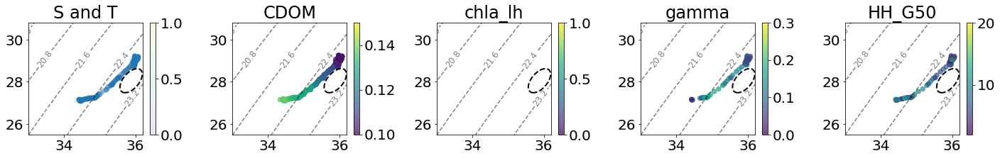

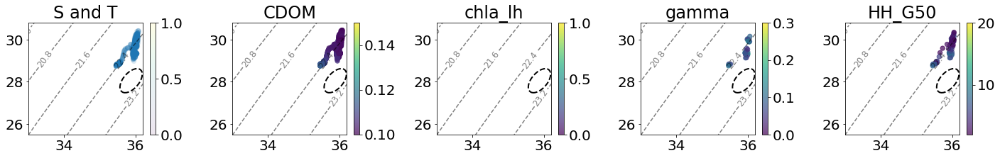

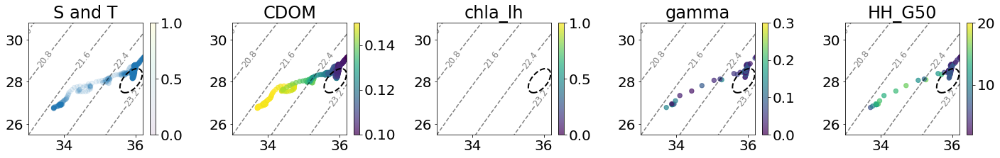

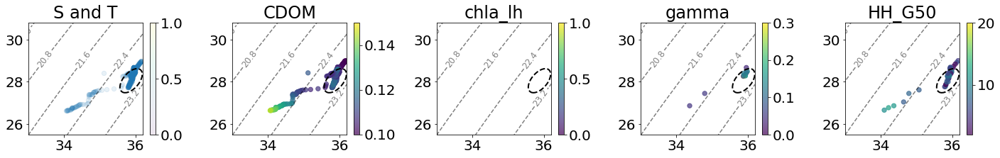

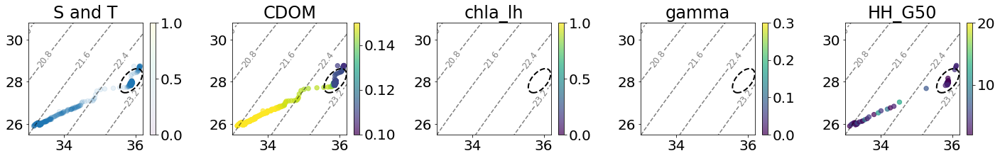

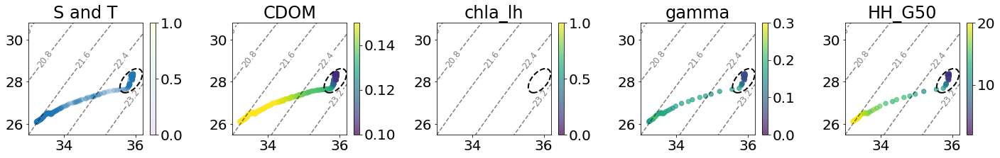

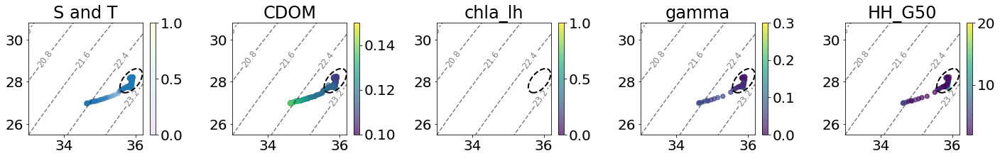

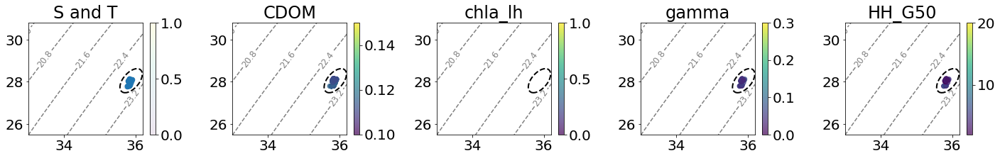

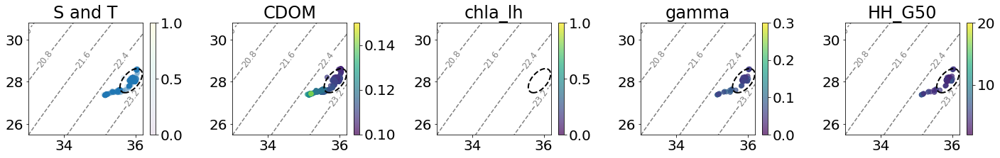

In [138]:
# Figure out boudaries (mins and maxs)
smin = 33-.7
smax = 36.2+.7
tmin = 25-.7
tmax = 30.8+.7

# Calculate how many gridcells we need in the x and y dimensions
xdim = int(round((smax-smin)/0.1+1,0))
ydim = int(round((tmax-tmin)+1,0))
 
# Create empty grid of zeros
dens = np.zeros((ydim,xdim))
 
# Create temp and salt vectors of appropiate dimensions
ti = np.linspace(1,ydim-1,ydim)+tmin
si = np.linspace(1,xdim-1,xdim)*0.1+smin
 
# Loop to fill in grid with densities
for j in range(0,int(ydim)):
    for i in range(0, int(xdim)):
        dens[j,i]=gsw.rho(si[i],ti[j],0)

# Substract 1000 to convert to sigma-t
dens = dens - 1000


# for outer_idx, i in enumerate([0,1,4,5,8]):
for outer_idx,i in enumerate([0,1,2,3,4,5,6,7,8]):
    
    # plot T and S diagrams first with distance from coast and then with other variables
    fig, ax = plt.subplots(1,5,figsize=(5*4,3.5))
    df_subset_full = tsg_df.loc[start_times[i]:end_times[i]]
    df_subset = df_subset_full[df_subset_full['BacteriaA'].notnull()]
    markersize=40
    
    optical_subset = optical_df.loc[start_times[i]:end_times[i]]
#     time_ordering = None
    
#     if i ==0:
#         time_ordering=df_subset.loc[start_times[i]:end_times[i]]['datetime'].values
#     elif i ==1:
#          time_ordering=np.flip(df_subset.loc[start_times[i]:end_times[i]]['datetime'].values)
#     elif i ==4:
#         time_ordering=df_subset.loc[start_times[i]:end_times[i]]['datetime'].values
#     elif i ==5:
#         time_ordering=df_subset.loc[start_times[i]:end_times[i]]['datetime'].values
#     elif i ==8:
#         time_ordering=np.flip(df_subset.loc[start_times[i]:end_times[i]]['datetime'].values)
        
    titles = ['S and T','CDOM', 'chla_lh', 'gamma', 'HH_G50']
    
    for idx,a in enumerate([ax[0], ax[1], ax[2],ax[3],ax[4]]):
        

        a.set_xlim(33,36.2)
        a.set_ylim(25.5,30.8)
#         a.set_xlabel('Salinity')
#         a.set_ylabel('Temperature (C)')
        a.set_title(titles[idx])
        CS = a.contour(si,ti,dens, linestyles='dashed', colors='k', alpha=0.5)
        a.clabel(CS, fontsize=12, inline=1, fmt='%1.1f') # Label every second level
        ellipse = Ellipse(xy=(35.88, 28.05), width=0.5, height=1.2, angle=-20,
                        edgecolor='k', fc='None', ls='--', lw=2)
        a.add_patch(ellipse)
    alpha=0.7
#     im = ax[0].scatter(df_subset.Sal, df_subset.Temp, s=markersize, c=df_subset.cdomVolts, vmin=0.08,vmax=.15,alpha=alpha)
#     fig.colorbar(im,ax=ax[0])
    im = ax[0].scatter(df_subset_full.Sal, df_subset_full.Temp, s=markersize,alpha=0.1)
    fig.colorbar(im,ax=ax[0])
    im = ax[1].scatter(df_subset_full.Sal, df_subset_full.Temp, s=markersize, c=df_subset_full.cdomVolts, vmin=0.1,vmax=.15,alpha=alpha)
    fig.colorbar(im,ax=ax[1])
#     ax[1].scatter(df_subset.Sal, df_subset.Temp, s=markersize, c=df_subset.NH4b, vmin=.1,vmax=.3)
    im = ax[2].scatter(df_subset_full.Sal, df_subset_full.Temp, s=markersize, c=df_subset_full.NCPm3, vmin=0,vmax=1,alpha=alpha)
    fig.colorbar(im,ax=ax[2])
#     im=ax[3].scatter(df_subset.Sal, df_subset.Temp, s=markersize, c=df_subset.ChlaAvg, vmin=.1,vmax=.3,alpha=alpha)
    im=ax[3].scatter(optical_subset.sal, optical_subset.temp, s=markersize, c=optical_subset.chl_ap676lh, vmin=0,vmax=.3, alpha=alpha)
    fig.colorbar(im,ax=ax[3])
#     im=ax[3].scatter(df_subset.Sal, df_subset.Temp, s=markersize, c=(df_subset.NH4a+df_subset.NH4b)/2, vmin=.1,vmax=.3,alpha=alpha)
#     fig.colorbar(im,ax=ax[3])
    #im = ax[4].scatter(df_subset.Sal, df_subset.Temp, s=markersize, c=((df_subset.NO3a+df_subset.NO3b)/2/(df_subset.PO4a+df_subset.PO4b)/2), vmin=.0,vmax=2,alpha=alpha)
#     optical_subset = optical_subset[(optical_subset.gamma/optical_df.chl_ap676lh).notnull()]
    im=ax[4].scatter(optical_subset.sal, optical_subset.temp, s=markersize, c=optical_subset.HH_G50, vmin=2,vmax=20, alpha=alpha)
    fig.colorbar(im,ax=ax[4])
    fig.tight_layout()
#     fig.savefig('figs/t_s_diagram_transect_'+str(i+1)+'.png',dpi=300)


In [139]:
import matplotlib.dates as mdates
myFmt = mdates.DateFormatter('%m/%d %H:%M')

In [140]:
i = 6
start_times[i],end_times[i]

('2021-09-7 2:55:00', '2021-09-7 5:35:00')

In [141]:
i = 5
pd.to_datetime([start_times[i],end_times[i]])

DatetimeIndex(['2021-09-06 16:45:00', '2021-09-06 19:20:00'], dtype='datetime64[ns]', freq=None)

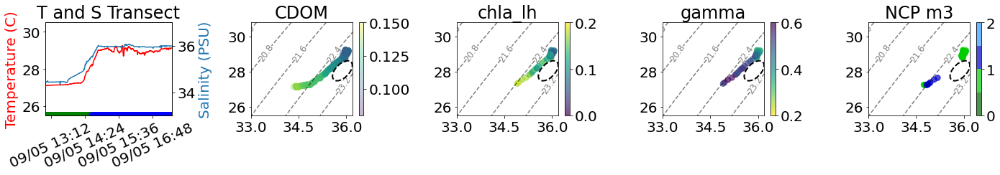

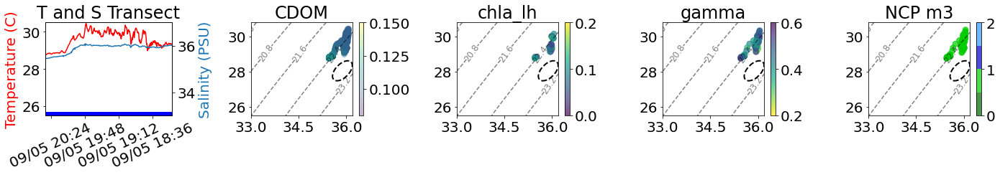

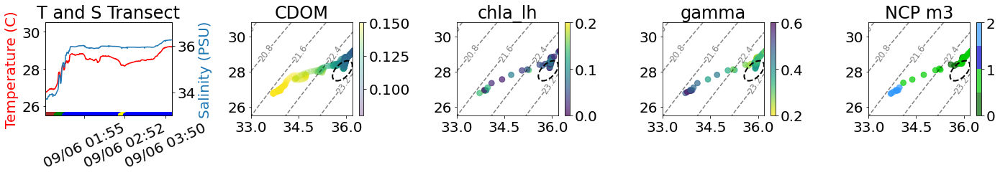

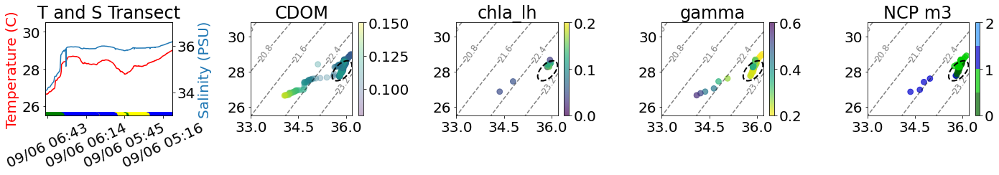

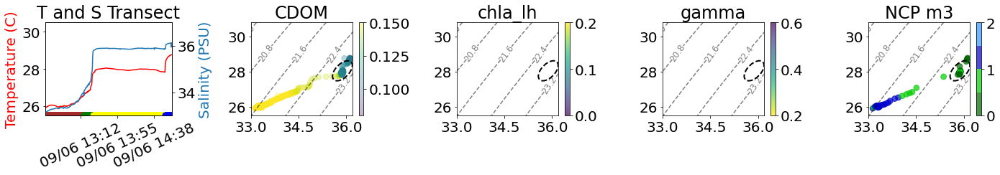

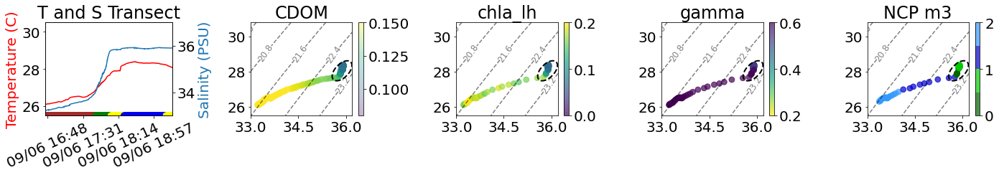

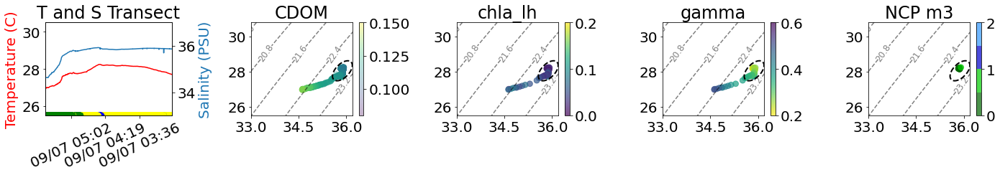

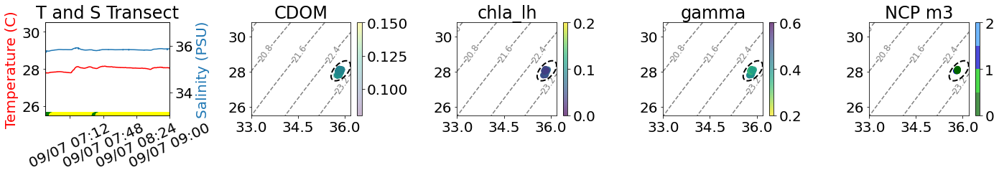

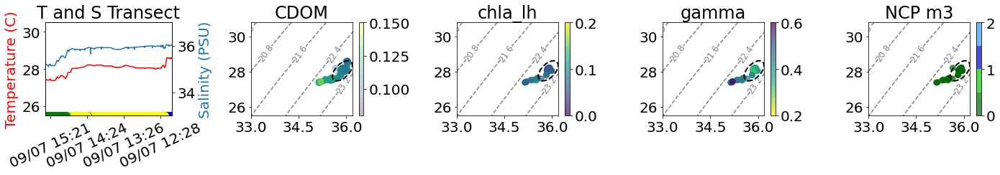

In [142]:
# Figure out boudaries (mins and maxs)
smin = 33-.7
smax = 36.2+.7
tmin = 25-.7
tmax = 30.8+.7

# Calculate how many gridcells we need in the x and y dimensions
xdim = int(round((smax-smin)/0.1+1,0))
ydim = int(round((tmax-tmin)+1,0))
 
# Create empty grid of zeros
dens = np.zeros((ydim,xdim))
 
# Create temp and salt vectors of appropiate dimensions
ti = np.linspace(1,ydim-1,ydim)+tmin
si = np.linspace(1,xdim-1,xdim)*0.1+smin
 
# Loop to fill in grid with densities
for j in range(0,int(ydim)):
    for i in range(0, int(xdim)):
        dens[j,i]=gsw.rho(si[i],ti[j],0)

# Substract 1000 to convert to sigma-t
dens = dens - 1000


################

# for outer_idx, i in enumerate([0,1,4,5,8]):
for outer_idx,i in enumerate([0,1,2,3,4,5,6,7,8]):
    
    # plot T and S diagrams first with distance from coast and then with other variables
    fig, ax = plt.subplots(1,5,figsize=(5*4,3.8))
    df_subset_full = tsg_df.loc[start_times[i]:end_times[i]]
    df_subset = df_subset_full[df_subset_full['BacteriaA'].notnull()]
    ncp_df_subset_partial = ncp_df_subset.loc[start_times[i]:end_times[i]]
    markersize=40
    
    ax[0].set_ylim(25.5, 30.5)
    sal_ax = ax[0].twinx()
    
    sal_ax.set_ylim(33, 37)
    
    markersize = 60
    ax[0].scatter(tsg_df.loc[start_times[i]:end_times[i]].index, len(tsg_df.loc[start_times[i]:end_times[i]].index)*[25.5],s=markersize, c=tsg_df.loc[start_times[i]:end_times[i]]['water_mass_color'].values)
    ax[0].set_ylabel("Temperature (C)")
    sal_ax.set_ylabel("Salinity (PSU)")
    p1, = ax[0].plot(tsg_df.loc[start_times[i]:end_times[i]].index, tsg_df.loc[start_times[i]:end_times[i]]['Temp'], color='red', label='Temp')
    p2, = sal_ax.plot(tsg_df.loc[start_times[i]:end_times[i]].index, tsg_df.loc[start_times[i]:end_times[i]]['Sal'], label='Salinity')
    
    ax[0].set_title('T and S Transect')
    
    ax[0].yaxis.label.set_color(p1.get_color())
    sal_ax.yaxis.label.set_color(p2.get_color())
    ax[0].xaxis.set_major_formatter(myFmt)


    for a in [ax[0]]:
        if i ==0:
            a.set_xlim(pd.to_datetime(start_times[i]),pd.to_datetime(end_times[i]))
        elif i ==1:
             a.set_xlim(pd.to_datetime(end_times[i]), pd.to_datetime(start_times[i]))
        elif i ==2:
            a.set_xlim(pd.to_datetime(start_times[i]),pd.to_datetime(end_times[i]))
        elif i ==3:
             a.set_xlim(pd.to_datetime(end_times[i]), pd.to_datetime(start_times[i]))
        elif i ==4:
            a.set_xlim(pd.to_datetime(start_times[i]),pd.to_datetime(end_times[i]))
        elif i ==5:
            a.set_xlim(pd.to_datetime(start_times[i]),pd.to_datetime(end_times[i]))
        elif i ==6:
            a.set_xlim(pd.to_datetime(end_times[i]),pd.to_datetime(start_times[i]))
        elif i ==7:
            a.set_xlim(pd.to_datetime(start_times[i]),pd.to_datetime(end_times[i]))
        elif i ==8:
            a.set_xlim(pd.to_datetime(end_times[i]), pd.to_datetime(start_times[i]))

#         a.xaxis.set_ticks([])
#     fig.autofmt_xdate(rotation=20)
    ax[0].tick_params('x', labelrotation=25)
    ax[0].xaxis.set_major_locator(plt.MaxNLocator(4))

    
    optical_subset = optical_df_quality.loc[start_times[i]:end_times[i]]
    titles = ['CDOM', 'chla_lh', 'gamma', 'NCP m3']
    
    for idx,a in enumerate([ax[1], ax[2],ax[3],ax[4]]):

        a.set_xlim(33,36.2)
        a.set_ylim(25.5,30.8)
#         a.set_xlabel('Salinity')
#         a.set_ylabel('Temperature (C)')
        a.set_title(titles[idx])
        CS = a.contour(si,ti,dens, linestyles='dashed', colors='k', alpha=0.5)
        a.clabel(CS, fontsize=12, inline=1, fmt='%1.1f') # Label every second level
        ellipse = Ellipse(xy=(35.88, 28.05), width=0.5, height=1.2, angle=-20,
                        edgecolor='k', fc='None', ls='--', lw=2)
        a.add_patch(ellipse)
        
        a.xaxis.set_major_locator(plt.MaxNLocator(3))
    alpha=0.7
#     im = ax[0].scatter(df_subset.Sal, df_subset.Temp, s=markersize, c=df_subset.cdomVolts, vmin=0.08,vmax=.15,alpha=alpha)
#     fig.colorbar(im,ax=ax[0])
    im = ax[1].scatter(df_subset_full.Sal, df_subset_full.Temp,c=df_subset_full.cdomVolts, vmin=0.08,vmax=.15, s=markersize,alpha=0.3)
    fig.colorbar(im,ax=ax[1])
    
    im=ax[2].scatter(optical_subset.sal, optical_subset.temp, s=markersize, c=optical_subset.chl_ap676lh, vmin=0,vmax=.2, alpha=alpha)
    fig.colorbar(im,ax=ax[2])
    
#     ax[1].scatter(df_subset.Sal, df_subset.Temp, s=markersize, c=df_subset.NH4b, vmin=.1,vmax=.3)
    im=ax[3].scatter(optical_subset.sal, optical_subset.temp, s=markersize, c=optical_subset.gamma, vmin=0.2,vmax=.6, cmap='viridis_r', alpha=alpha)
    fig.colorbar(im,ax=ax[3])
    
#     im=ax[4].scatter(optical_subset.sal, optical_subset.temp, s=markersize, c=optical_subset.HH_G50, vmin=0,vmax=18,alpha=alpha)
    im = ax[4].scatter(ncp_df_subset_partial.sal, ncp_df_subset_partial.temp, s=markersize, c=ncp_df_subset_partial.updated_ncp_m3, vmin=.0,vmax=2,alpha=alpha, cmap=cmap)
    fig.colorbar(im,ax=ax[4])

#     im=ax[3].scatter(df_subset.Sal, df_subset.Temp, s=markersize, c=(df_subset.NH4a+df_subset.NH4b)/2, vmin=.1,vmax=.3,alpha=alpha)
#     fig.colorbar(im,ax=ax[3])
    #im = ax[4].scatter(df_subset.Sal, df_subset.Temp, s=markersize, c=((df_subset.NO3a+df_subset.NO3b)/2/(df_subset.PO4a+df_subset.PO4b)/2), vmin=.0,vmax=2,alpha=alpha)
#     optical_subset = optical_subset[(optical_subset.gamma/optical_df.chl_ap676lh).notnull()]
    fig.tight_layout()
#     fig.savefig('figs/t_s_diagram_transect_'+str(i+1)+'.png',dpi=300)
    plt.show()


(array([24.,  8.,  5.,  5.,  5.,  0.,  0.,  0.,  0.,  1.]),
 array([0.14130435, 0.85217391, 1.56304348, 2.27391304, 2.98478261,
        3.69565217, 4.40652174, 5.1173913 , 5.82826087, 6.53913043,
        7.25      ]),
 <BarContainer object of 10 artists>)

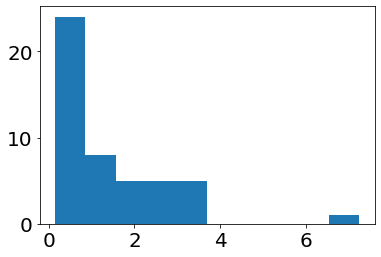

In [143]:
plt.hist(((tsg_df.NO3a+tsg_df.NO3b)/2)/(tsg_df.PO4a+tsg_df.PO4b)/2)

(array([4., 0., 0., 3., 0., 0., 1., 0., 0., 1.]),
 array([0.005 , 0.0065, 0.008 , 0.0095, 0.011 , 0.0125, 0.014 , 0.0155,
        0.017 , 0.0185, 0.02  ]),
 <BarContainer object of 10 artists>)

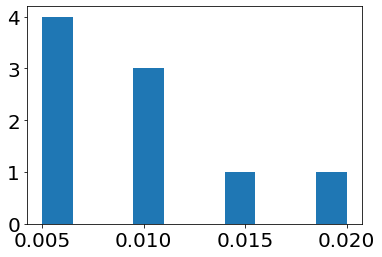

In [144]:
plt.hist((df_subset.NO2a+df_subset.NO2b)/2)
# plt.xlim(0,.025)

In [145]:
tsg_df_subset.head(1)

,DateTime,Temp,Sal,Unknown,datetime,lat,lon,geometry,SynA,PeuksA,...,PO4b,SILb,NO2b,NH4b,sigma,sigma_grad,distances,water_mass,water_mass_color,water_mass_code
utc_dt,,,,,,,,,,,,,,,,,,,,,
2021-09-05 13:00:02.032,"09/05/2021,13:00:02.032,",27.1116,34.4627,1539.08,2021-09-05 13:00:02.032,35.648912,-74.874555,POINT (-74.87456 35.64891),NaN,NaN,...,NaN,NaN,NaN,NaN,22.167107,0.001736,0.0,slope,green,1


(array([1.142e+03, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 1.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 1.000e+00]),
 array([1.08782245e-04, 4.12114617e-02, 8.23141411e-02, 1.23416821e-01,
        1.64519500e-01, 2.05622180e-01, 2.46724859e-01, 2.87827538e-01,
        3.28930218e-01, 3.70032897e-01, 4.11135577e-01]),
 <BarContainer object of 10 artists>)

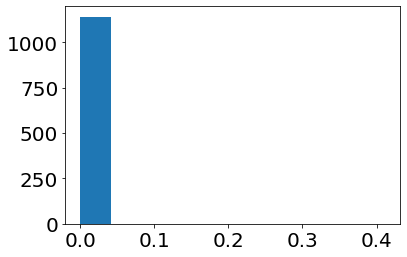

In [147]:
plt.hist(optical_df.bbp_ratio_440)

(array([ 1.,  1.,  4.,  8.,  9., 18., 14., 10.,  5.,  6.]),
 array([1071883.31982868, 1539306.16901437, 2006729.01820006,
        2474151.86738575, 2941574.71657144, 3408997.56575713,
        3876420.41494282, 4343843.26412851, 4811266.1133142 ,
        5278688.96249989, 5746111.81168558]),
 <BarContainer object of 10 artists>)

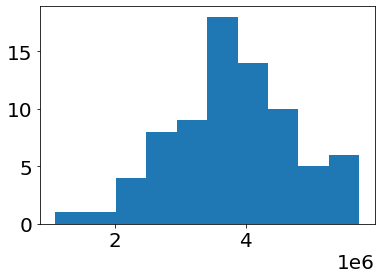

In [148]:
plt.hist((tsg_df.BacteriaA+tsg_df.BacteriaB)/2/tsg_df.ChlaAvg)

(array([132., 295., 448., 363., 144.,  47.,  38.,  19.,  26.,  20.]),
 array([ 0.70144127,  2.77957167,  4.85770206,  6.93583246,  9.01396286,
        11.09209326, 13.17022366, 15.24835406, 17.32648446, 19.40461486,
        21.48274526]),
 <BarContainer object of 10 artists>)

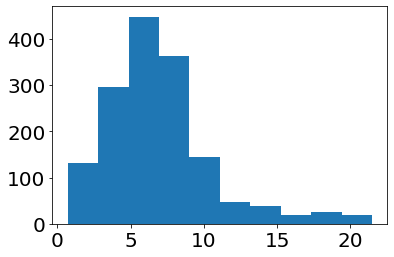

In [149]:
plt.hist(optical_df.HH_G50)

In [150]:
optical_start_times = ['2021-09-5 14:20:00', '2021-09-5 18:15:00', '2021-09-6 1:00:00', '2021-09-6 5:10:00', '2021-09-6 16:45:00', '2021-09-7 2:55:00', '2021-09-7 6:45:00', '2021-09-7 12:45:00']
optical_end_times = ['2021-09-5 17:00:00','2021-09-5 20:30:00', '2021-09-6 4:00:00', '2021-09-6 6:45:00', '2021-09-6 19:20:00', '2021-09-7 5:35:00', '2021-09-7 9:00:00', '2021-09-7 15:30:00']

dfs = []
for i in range(len(optical_start_times)):
    dfs.append(optical_df.loc[optical_start_times[i]:optical_end_times[i]])
optical_df_quality = pd.concat(dfs)

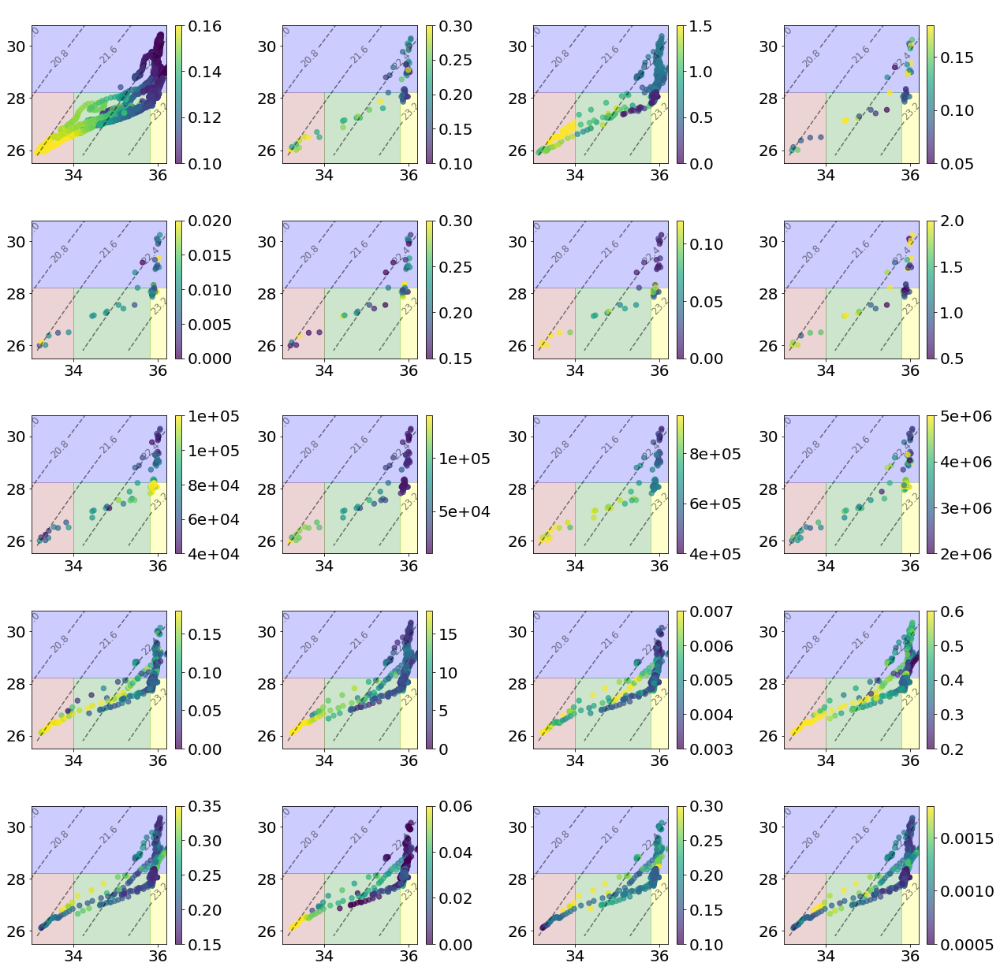

In [152]:
# Figure out boudaries (mins and maxs)
smin = 33-.7
smax = 36.2+.7
tmin = 25.5-.7
tmax = 30.8+.7

# Calculate how many gridcells we need in the x and y dimensions
xdim = int(round((smax-smin)/0.1+1,0))
ydim = int(round((tmax-tmin)+1,0))
 
# Create empty grid of zeros
dens = np.zeros((ydim,xdim))
 
# Create temp and salt vectors of appropiate dimensions
ti = np.linspace(1,ydim-1,ydim)+tmin
si = np.linspace(1,xdim-1,xdim)*0.1+smin
 
# Loop to fill in grid with densities
for j in range(0,int(ydim)):
    for i in range(0, int(xdim)):
        dens[j,i]=gsw.rho(si[i],ti[j],0)

# Substract 1000 to convert to sigma-t
dens = dens - 1000

fig, ax = plt.subplots(5,4,figsize=(4.5*4,17.5))

    
# plot T and S diagrams first with distance from coast and then with other variables

df_subset = tsg_df_subset[tsg_df_subset['BacteriaB'].notnull()]
markersize=40

titles = ['CDOM (volts)', 'chl-a (mg/m3)', 'NCP (O2 m-3 d-1)', 'NO3 (µmol/L)', 
          'N02 (µmol/L)', 'NH4 (µmol/L)', 'PO4 (µmol/L)', 'SIL (µmol/L)', 
          'picocyanos /mL', 'syn /mL',  'bacteria /mL', 'bacteria/chla', 
          'line height chla', 'phyto size (um)', 'backscattering ratio (440)', 'gamma',
         'cp(460)', 'ap(460)', 'bp(460)', 'bbp(460)']

for idx,a in enumerate([ax[0,0], ax[0,1], ax[0,2], ax[0,3],
                        ax[1,0], ax[1,1], ax[1,2], ax[1,3],
                        ax[2,0], ax[2,1], ax[2,2], ax[2,3],
                       ax[3,0], ax[3,1], ax[3,2], ax[3,3],
                       ax[4,0], ax[4,1], ax[4,2], ax[4,3]]):
    a.set_xlim(33,36.2)
    a.set_ylim(25.5,30.8)
    a.fill_between([smin,smax],temp_gs,temp_gs+5,color='blue',alpha=.2)
    a.fill_between([sal_eddy_gs,smax],tmin,temp_gs,color='yellow',alpha=.2)
    a.fill_between([smin,sal_shelf],tmin,temp_gs,color='brown',alpha=.2)
    a.fill_between([sal_shelf,sal_eddy_gs],tmin,temp_gs,color='green',alpha=.2)
#         a.set_xlabel('Salinity')
#         a.set_ylabel('Temperature (C)')
    #a.set_title(titles[idx])
    a.set_title('  ')
    CS = a.contour(si,ti,dens, linestyles='dashed', colors='k', alpha=0.5)
    a.clabel(CS, fontsize=12, inline=1, fmt='%1.1f') # Label every second level
    
#     ellipse = Ellipse(xy=(35.88, 28.05), width=0.5, height=1.2, angle=-20,
#                         edgecolor='k', fc='None', ls='--', lw=2)
#     a.add_patch(ellipse)
    
alpha=0.7
cmap='viridis'

        
### top column

im = ax[0,0].scatter(tsg_df_subset.Sal, tsg_df_subset.Temp, s=markersize, c=tsg_df_subset.cdomVolts, vmin=0.1,vmax=.16,alpha=alpha, cmap=cmap)
fig.colorbar(im,ax=ax[0,0])

im=ax[0,1].scatter(df_subset.Sal, df_subset.Temp, s=markersize, c=df_subset.ChlaAvg, vmin=.1,vmax=.3,alpha=alpha, cmap=cmap)
fig.colorbar(im,ax=ax[0,1])

# im = ax[0,2].scatter(df_subset.Sal, df_subset.Temp, s=markersize, c=((df_subset.NO3a+df_subset.NO3b)/2/(df_subset.PO4a+df_subset.PO4b)/2), vmin=.0,vmax=2,alpha=alpha, cmap=cmap)
# fig.colorbar(im,ax=ax[0,2])
    
im = ax[0,2].scatter(ncp_df_subset.sal, ncp_df_subset.temp, s=markersize, c=ncp_df_subset.updated_ncp_m3, vmin=.0,vmax=1.5,alpha=alpha, cmap=cmap)
fig.colorbar(im,ax=ax[0,2])    

im = ax[0,3].scatter(df_subset.Sal, df_subset.Temp, s=markersize, c=((df_subset.NO3a+df_subset.NO3b)/2), vmin=.05,vmax=.18, alpha=alpha, cmap=cmap)
fig.colorbar(im,ax=ax[0,3])

### nutrients

im=ax[1,0].scatter(df_subset.Sal, df_subset.Temp, s=markersize, c=((df_subset.NO2a+df_subset.NO2b)/2), vmin=.0,vmax=.02 ,alpha=alpha, cmap=cmap)
fig.colorbar(im,ax=ax[1,0])

im=ax[1,1].scatter(df_subset.Sal, df_subset.Temp, s=markersize, c=((df_subset.NH4a+df_subset.NH4b)/2), vmin=.15,vmax=.3, alpha=alpha, cmap=cmap)
fig.colorbar(im,ax=ax[1,1])

im=ax[1,2].scatter(df_subset.Sal, df_subset.Temp, s=markersize, c=((df_subset.PO4a+df_subset.PO4b)/2), vmin=.0,vmax=.12, alpha=alpha, cmap=cmap)
fig.colorbar(im,ax=ax[1,2])

im=ax[1,3].scatter(df_subset.Sal, df_subset.Temp, s=markersize, c=(df_subset.SILa+df_subset.SILb)/2, vmin=.5,vmax=2, alpha=alpha, cmap=cmap)
fig.colorbar(im,ax=ax[1,3])

### FCM

im=ax[2,0].scatter(df_subset.Sal, df_subset.Temp, s=markersize, c=df_subset.PicoCyanoA, vmin=40000,vmax=120000, alpha=alpha, cmap=cmap)
fig.colorbar(im,ax=ax[2,0],  format='%.0e')

im=ax[2,1].scatter(df_subset.Sal, df_subset.Temp, s=markersize, c=df_subset.SynA, vmin=10000,vmax=140000,alpha=alpha, cmap=cmap)
fig.colorbar(im,ax=ax[2,1], format='%.0e')

# im=ax[2,2].scatter(df_subset.Sal, df_subset.Temp, s=markersize, c=df_subset.PeuksA, vmin=500,vmax=3500, alpha=alpha, cmap=cmap)
# fig.colorbar(im,ax=ax[2,2],  format='%.0e')

im=ax[2,2].scatter(df_subset.Sal, df_subset.Temp, s=markersize, c=(df_subset.BacteriaA+df_subset.BacteriaB)/2, vmin=400000,vmax=950000,alpha=alpha, cmap=cmap)
fig.colorbar(im,ax=ax[2,2],  format='%.0e')

im=ax[2,3].scatter(df_subset.Sal, df_subset.Temp, s=markersize, c=(df_subset.BacteriaA+df_subset.BacteriaB)/2/df_subset.ChlaAvg, vmin=2e6,vmax=5e6,alpha=alpha, cmap=cmap)
fig.colorbar(im,ax=ax[2,3],  format='%.0e')

### optical

# 'gamma', 'bbp_ratio_440', 'chl_ap676lh', 'bbp_1'

# im=ax[3,0].scatter(df_subset.Sal, df_subset.Temp, s=markersize, c=df_subset.PicoCyanoA/df_subset.ChlaAvg, vmin=.2e6,vmax=1e6, alpha=alpha, cmap=cmap)
# # im=ax[3,0].scatter(optical_df.sal, optical_df.temp, s=markersize, c=optical_df.agaus492, vmin=.0,vmax=.025, alpha=alpha, cmap=cmap)
# fig.colorbar(im,ax=ax[3,0],  format='%.0e')
# im=ax[3,1].scatter(optical_df.sal, optical_df.temp, s=markersize, c=optical_df.agaus523, vmin=.000,vmax=.012,alpha=alpha, cmap=cmap)
im=ax[3,0].scatter(optical_df_quality.sal, optical_df_quality.temp, s=markersize, c=optical_df_quality.chl_ap676lh, vmin=0,vmax=.18, alpha=alpha, cmap=cmap)
fig.colorbar(im,ax=ax[3,0])

im=ax[3,1].scatter(optical_df_quality.sal, optical_df_quality.temp, s=markersize, c=optical_df_quality.HH_G50, vmin=0,vmax=18, alpha=alpha, cmap=cmap)
fig.colorbar(im,ax=ax[3,1])

im=ax[3,2].scatter(optical_df_quality.sal, optical_df_quality.temp, s=markersize, c=optical_df_quality.bbp_ratio_440, vmin=0.003,vmax=0.007, alpha=alpha, cmap=cmap)
fig.colorbar(im,ax=ax[3,2])

im=ax[3,3].scatter(optical_df_quality.sal, optical_df_quality.temp, s=markersize, c=optical_df_quality.gamma, vmin=0.2,vmax=.6,alpha=alpha, cmap=cmap)
fig.colorbar(im,ax=ax[3,3])


im=ax[4,0].scatter(optical_df_quality.sal, optical_df_quality.temp, s=markersize, c=optical_df_quality.cp_15, vmin=0.15,vmax=.35, alpha=alpha, cmap=cmap)
fig.colorbar(im,ax=ax[4,0])

im=ax[4,1].scatter(optical_df_quality.sal, optical_df_quality.temp, s=markersize, c=optical_df_quality.ap_15, vmin=0,vmax=0.06, alpha=alpha, cmap=cmap)
fig.colorbar(im,ax=ax[4,1])

im=ax[4,2].scatter(optical_df_quality.sal, optical_df_quality.temp, s=markersize, c=(optical_df_quality.cp_15- optical_df_quality.ap_15), vmin=0.1,vmax=0.3, alpha=alpha, cmap=cmap)
fig.colorbar(im,ax=ax[4,2])

im=ax[4,3].scatter(optical_df_quality.sal, optical_df_quality.temp, s=markersize, c=optical_df_quality.bbp1, vmin=0.0005,vmax=.0018,alpha=alpha, cmap=cmap)
fig.colorbar(im,ax=ax[4,3])

### fin

fig.tight_layout()
# fig.savefig('t_s_diagram_all_variables_170223_no_title.png',dpi=300)
plt.show()

(array([  1.,  12., 327., 161.,  49.,  24.,   5.,   1.,   2.,   4.]),
 array([2.57581690e-05, 3.01516188e-04, 5.77274207e-04, 8.53032225e-04,
        1.12879024e-03, 1.40454826e-03, 1.68030628e-03, 1.95606430e-03,
        2.23182232e-03, 2.50758034e-03, 2.78333836e-03]),
 <BarContainer object of 10 artists>)

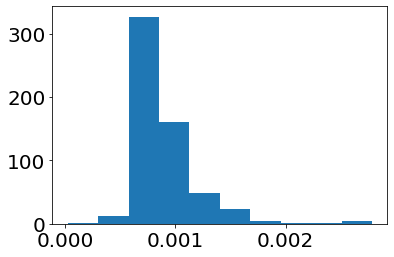

In [173]:
plt.hist(optical_df_quality.bbp1) #, optical_df_quality.ap_15, optical_df_quality.cp_15- optical_df_quality.ap_15, optical_df_quality.bbp1

## Discrete Classifications

In [154]:
tsg_df['Syn'] = (tsg_df['SynA'] + tsg_df['SynB'])/2
tsg_df['Peuks'] = (tsg_df['PeuksA'] + tsg_df['PeuksB'])/2
tsg_df['PicoCyano'] = (tsg_df['PicoCyanoA'] + tsg_df['PicoCyanoB'])/2
tsg_df['Bacteria'] = (tsg_df['BacteriaA'] + tsg_df['BacteriaB'])/2


tsg_df['Detritus'] = (tsg_df['DetritusA'] + tsg_df['DetritusB'])/2
tsg_df['Synredflu'] = (tsg_df['SynredfluA'] + tsg_df['SynredfluB'])/2
tsg_df['Synorangeflu'] = (tsg_df['SynorangefluA'] + tsg_df['SynorangefluB'])/2
tsg_df['Picoredflu'] = (tsg_df['PicoredfluA'] + tsg_df['PicoredfluB'])/2
tsg_df['Picoeukredflu'] = (tsg_df['PicoeukredfluA'] + tsg_df['PicoeukredfluB'])/2

tsg_df['NO3'] = (tsg_df['NO3a'] + tsg_df['NO3b'])/2
tsg_df['PO4'] = (tsg_df['PO4a'] + tsg_df['PO4b'])/2
tsg_df['SIL'] = (tsg_df['SILa'] + tsg_df['SILb'])/2
tsg_df['NO2'] = (tsg_df['NO2a'] + tsg_df['NO2b'])/2
tsg_df['NH4'] = (tsg_df['NH4a'] + tsg_df['NH4b'])/2

In [155]:
tsg_df_subset = tsg_df.loc['2021-09-5 11:00:00':'2021-09-8 20:45:00']

In [156]:
# start_times = ['2021-09-5 13:00:00',
#  '2021-09-5 18:15:00',
#  '2021-09-6 12:30:00',
#  '2021-09-6 16:45:00',
#  '2021-09-7 12:10:00']

In [157]:
# start_times = ['2021-09-5 13:00:00',
#  '2021-09-5 18:15:00',
#  '2021-09-6 12:30:00',
#  '2021-09-6 16:45:00',
#  '2021-09-7 12:10:00']

# end_times = ['2021-09-5 17:30:00',
#  '2021-09-5 20:30:00',
#  '2021-09-6 15:00:00',
#  '2021-09-6 19:20:00',
#  '2021-09-7 15:30:00']

# dfs = []
# for i in range(len(start_times)):
#     dfs.append(tsg_df.loc[start_times[i]:end_times[i]])
# tsg_df_subset = pd.concat(dfs)

In [158]:
start_times,end_times

(['2021-09-5 13:00:00',
  '2021-09-5 18:15:00',
  '2021-09-6 1:00:00',
  '2021-09-6 5:10:00',
  '2021-09-6 12:30:00',
  '2021-09-6 16:45:00',
  '2021-09-7 2:55:00',
  '2021-09-7 6:45:00',
  '2021-09-7 12:10:00'],
 ['2021-09-5 17:30:00',
  '2021-09-5 20:30:00',
  '2021-09-6 4:00:00',
  '2021-09-6 6:45:00',
  '2021-09-6 15:00:00',
  '2021-09-6 19:20:00',
  '2021-09-7 5:35:00',
  '2021-09-7 9:00:00',
  '2021-09-7 15:30:00'])

In [159]:
dfs = []
for i in range(len(start_times)):
    dfs.append(tsg_df.loc[start_times[i]:end_times[i]])
tsg_df_subset = pd.concat(dfs)

In [160]:
tsg_df_subset.head()

,DateTime,Temp,Sal,Unknown,datetime,lat,lon,geometry,SynA,PeuksA,...,Detritus,Synredflu,Synorangeflu,Picoredflu,Picoeukredflu,NO3,PO4,SIL,NO2,NH4
utc_dt,,,,,,,,,,,,,,,,,,,,,
2021-09-05 13:00:02.032,"09/05/2021,13:00:02.032,",27.1116,34.4627,1539.08,2021-09-05 13:00:02.032,35.648912,-74.874555,POINT (-74.87456 35.64891),NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-09-05 13:00:12.016,"09/05/2021,13:00:12.016,",27.1116,34.4658,1539.09,2021-09-05 13:00:12.016,35.649203,-74.874498,POINT (-74.87450 35.64920),NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-09-05 13:00:22.026,"09/05/2021,13:00:22.026,",27.1122,34.4724,1539.09,2021-09-05 13:00:22.026,35.649493,-74.874520,POINT (-74.87452 35.64949),NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-09-05 13:00:32.035,"09/05/2021,13:00:32.035,",27.1167,34.4759,1539.11,2021-09-05 13:00:32.035,35.649742,-74.874615,POINT (-74.87462 35.64974),NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-09-05 13:00:42.042,"09/05/2021,13:00:42.042,",27.1207,34.4767,1539.12,2021-09-05 13:00:42.042,35.649985,-74.874792,POINT (-74.87479 35.64999),NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [161]:
len(tsg_df_subset[tsg_df_subset['SynA'].notnull()][tsg_df_subset['water_mass']=='shelf']),len(tsg_df_subset[tsg_df_subset['SynA'].notnull()][tsg_df_subset['water_mass']=='eddy']),len(tsg_df_subset[tsg_df_subset['SynA'].notnull()][tsg_df['water_mass']=='gulfstream'])

(10, 25, 35)

In [162]:
# columns_to_plot = ['SynA','PeuksA', 'PicoCyanoA', 'BacteriaAvg', 'ChlaAvg', 'cdomVolts', 'NCP']
# scale_to_plot = ['log','log', 'log', 'log', 'linear', 'linear', 'linear']

# fig, ax = plt.subplots(len(columns_to_plot),1, figsize=(8,20))


# for i, water_mass in enumerate(['shelf', 'eddy', 'gulfstream']):
#     for j, col in enumerate(columns_to_plot):
#         ax[j].scatter(i, np.mean(tsg_df[tsg_df.water_mass == water_mass][col]), color='black')
#         ax[j].scatter(i, np.mean(tsg_df[tsg_df.water_mass == water_mass][col])+np.std(tsg_df[tsg_df.water_mass == water_mass][col]), color='grey')
#         ax[j].scatter(i, np.mean(tsg_df[tsg_df.water_mass == water_mass][col])-np.std(tsg_df[tsg_df.water_mass == water_mass][col]), color='grey')
#         ax[j].set_yscale(scale_to_plot[j])
#         ax[j].set_ylabel(col)

In [163]:
tsg_df_subset.columns

Index(['DateTime', 'Temp', 'Sal', 'Unknown', 'datetime', 'lat', 'lon',
       'geometry', 'SynA', 'PeuksA', 'PicoCyanoA', 'SynB', 'PeuksB',
       'PicoCyanoB', 'BacteriaA', 'BacteriaB', 'ChlaAvg', 'ChlaA', 'ChlaB',
       'Sample#', 'cdomVolts', 'NCPm2', 'NCPm3', 'MLD', 'DetritusA',
       'DetritusB', 'SynredfluA', 'SynredfluB', 'SynorangefluA',
       'SynorangefluB', 'PicoredfluA', 'PicoredfluB', 'PicoeukredfluA',
       'PicoeukredfluB', 'NO3a', 'PO4a', 'SILa', 'NO2a', 'NH4a', 'NO3b',
       'PO4b', 'SILb', 'NO2b', 'NH4b', 'sigma', 'sigma_grad', 'distances',
       'water_mass', 'water_mass_color', 'water_mass_code', 'Syn', 'Peuks',
       'PicoCyano', 'Bacteria', 'Detritus', 'Synredflu', 'Synorangeflu',
       'Picoredflu', 'Picoeukredflu', 'NO3', 'PO4', 'SIL', 'NO2', 'NH4'],
      dtype='object')

In [164]:
from random import uniform

def rand_jitter(v):
    jittered = []
    for x in v:
        jittered.append(uniform(x-0.05, x+0.05))
    return(jittered)

In [165]:
nuts_df.columns

Index(['Station', 'NO3a', 'PO4a', 'SILa', 'NO2a', 'NH4a', 'NO3b', 'PO4b',
       'SILb', 'NO2b', 'NH4b', 'Time (UTC)', 'Date', 'datetime'],
      dtype='object')

In [166]:
tsg_df.columns

Index(['DateTime', 'Temp', 'Sal', 'Unknown', 'datetime', 'lat', 'lon',
       'geometry', 'SynA', 'PeuksA', 'PicoCyanoA', 'SynB', 'PeuksB',
       'PicoCyanoB', 'BacteriaA', 'BacteriaB', 'ChlaAvg', 'ChlaA', 'ChlaB',
       'Sample#', 'cdomVolts', 'NCPm2', 'NCPm3', 'MLD', 'DetritusA',
       'DetritusB', 'SynredfluA', 'SynredfluB', 'SynorangefluA',
       'SynorangefluB', 'PicoredfluA', 'PicoredfluB', 'PicoeukredfluA',
       'PicoeukredfluB', 'NO3a', 'PO4a', 'SILa', 'NO2a', 'NH4a', 'NO3b',
       'PO4b', 'SILb', 'NO2b', 'NH4b', 'sigma', 'sigma_grad', 'distances',
       'water_mass', 'water_mass_color', 'water_mass_code', 'Syn', 'Peuks',
       'PicoCyano', 'Bacteria', 'Detritus', 'Synredflu', 'Synorangeflu',
       'Picoredflu', 'Picoeukredflu', 'NO3', 'PO4', 'SIL', 'NO2', 'NH4'],
      dtype='object')

In [167]:
# im=ax[3,1].scatter(optical_df.sal, optical_df.temp, s=markersize, c=optical_df.agaus523, vmin=.000,vmax=.012,alpha=alpha, cmap=cmap)
im=ax[3,0].scatter(optical_df_quality.sal, optical_df_quality.temp, s=markersize, c=optical_df_quality.chl_ap676lh, vmin=0,vmax=.18, alpha=alpha, cmap=cmap)
fig.colorbar(im,ax=ax[3,0])

im=ax[3,1].scatter(optical_df_quality.sal, optical_df_quality.temp, s=markersize, c=optical_df_quality.HH_G50, vmin=0,vmax=18, alpha=alpha, cmap=cmap)
fig.colorbar(im,ax=ax[3,1])

im=ax[3,2].scatter(optical_df_quality.sal, optical_df_quality.temp, s=markersize, c=optical_df_quality.bbp_ratio_440, vmin=0.003,vmax=0.007, alpha=alpha, cmap=cmap)
fig.colorbar(im,ax=ax[3,2])

im=ax[3,3].scatter(optical_df_quality.sal, optical_df_quality.temp, s=markersize, c=optical_df_quality.gamma, vmin=0.2,vmax=.6,alpha=alpha, cmap=cmap)
fig.colorbar(im,ax=ax[3,3])


im=ax[4,0].scatter(optical_df_quality.sal, optical_df_quality.temp, s=markersize, c=optical_df_quality.cp_15, vmin=0.15,vmax=.35, alpha=alpha, cmap=cmap)
fig.colorbar(im,ax=ax[4,0])

im=ax[4,1].scatter(optical_df_quality.sal, optical_df_quality.temp, s=markersize, c=optical_df_quality.ap_15, vmin=0,vmax=0.06, alpha=alpha, cmap=cmap)
fig.colorbar(im,ax=ax[4,1])

im=ax[4,2].scatter(optical_df_quality.sal, optical_df_quality.temp, s=markersize, c=(optical_df_quality.cp_15- optical_df_quality.ap_15), vmin=0.1,vmax=0.3, alpha=alpha, cmap=cmap)
fig.colorbar(im,ax=ax[4,2])

im=ax[4,3].scatter(optical_df_quality.sal, optical_df_quality.temp, s=markersize, c=optical_df_quality.bbp1, vmin=0.0005,vmax=.0018,alpha=alpha, cmap=cmap)
fig.colorbar(im,ax=ax[4,3])

In [168]:
from scipy import stats
rng = np.random.default_rng()
# Test with sample with identical means:

rvs2 = np.arange(0,20)
rvs1 = np.arange(100,200)
t,p = stats.ttest_ind(rvs1, rvs2,equal_var=False)
t,p

(43.90750337310261, 6.636294571839433e-75)

In [169]:
tsg_df_subset[tsg_df_subset.water_mass == 'eddy']['NO3'].dropna()

utc_dt
2021-09-06 13:33:02.733    0.095
2021-09-06 13:49:02.746    0.065
2021-09-06 14:06:02.744    0.055
2021-09-06 14:23:02.758    0.095
2021-09-06 14:47:02.777    0.095
2021-09-06 18:17:02.869    0.090
2021-09-06 19:17:02.878    0.095
2021-09-07 12:49:03.388    0.090
2021-09-07 13:07:03.418    0.120
2021-09-07 13:29:03.407    0.110
2021-09-07 13:49:03.438    0.095
2021-09-07 14:09:03.439    0.065
2021-09-07 14:28:03.438    0.085
2021-09-07 14:46:03.436    0.075
Name: NO3, dtype: float64

In [170]:
ncp_df_subset

,time,MLD,NCP mmol C m-2 d-1,NCP (mmol C m-3 d-1),datetime,updated_ncp_m2,temp,sal,water_mass,water_mass_color,water_mass_code,updated_ncp_m3
dt,,,,,,,,,,,,
2021-09-05 13:00:00.000006656,738404.541667,13.3,NaN,NaN,2021-09-05 13:00:00.000006656,NaN,27.1116,34.4627,slope,green,1,NaN
2021-09-05 13:01:59.999999488,738404.543056,13.3,NaN,NaN,2021-09-05 13:01:59.999999488,NaN,27.1237,34.4413,slope,green,1,NaN
2021-09-05 13:04:00.000012544,738404.544444,13.3,NaN,NaN,2021-09-05 13:04:00.000012544,NaN,27.1152,34.4550,slope,green,1,NaN
2021-09-05 13:06:00.000005376,738404.545833,13.3,NaN,NaN,2021-09-05 13:06:00.000005376,NaN,27.1222,34.4585,slope,green,1,NaN
2021-09-05 13:07:59.999998208,738404.547222,13.3,NaN,NaN,2021-09-05 13:07:59.999998208,NaN,27.1270,34.4332,slope,green,1,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
2021-09-07 15:22:00.000001792,738406.640278,13.3,NaN,NaN,2021-09-07 15:22:00.000001792,NaN,27.4499,35.2089,slope,green,1,NaN
2021-09-07 15:24:00.000004608,738406.641667,13.3,NaN,NaN,2021-09-07 15:24:00.000004608,NaN,27.4041,35.1695,slope,green,1,NaN
2021-09-07 15:26:00.000007680,738406.643056,13.3,NaN,NaN,2021-09-07 15:26:00.000007680,NaN,27.4153,35.1692,slope,green,1,NaN


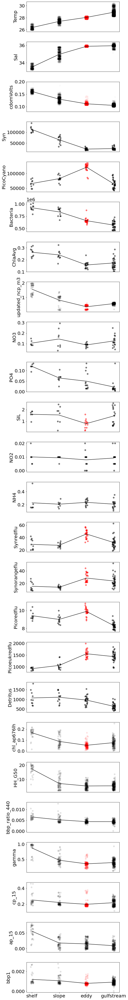

In [171]:
columns_to_plot = ['Temp', 'Sal', 'cdomVolts', 'Syn', 'PicoCyano', 'Bacteria', 'ChlaAvg', 'updated_ncp_m3','NO3', 'PO4', 'SIL', 'NO2', 'NH4','Synredflu','Synorangeflu','Picoredflu','Picoeukredflu', 'Detritus',
                  'chl_ap676lh', 'HH_G50', 'bbp_ratio_440', 'gamma', 'cp_15', 'ap_15', 'bbp1']
scale_to_plot = ['log','log', 'log', 'log', 'linear', 'linear', 'linear','linear', 'linear', 'linear','linear', 'linear']
alpha_to_plot = [.02,.02,.02,.5,.5,.5,.5,.1,.5,.5,.5,.5,.5,.5,.5,.5,.5,.5, .1,.1,.1,.1,.1,.1,.1]

fig, ax = plt.subplots(len(columns_to_plot),1, figsize=(8,60))

water_masses = ['shelf', 'slope', 'eddy', 'gulfstream']

for i, water_mass in enumerate(water_masses):
    for j, col in enumerate(columns_to_plot):
        df_to_use = tsg_df_subset
        
        if col in ['chl_ap676lh', 'HH_G50', 'bbp_ratio_440', 'gamma', 'cp_15', 'ap_15', 'bbp1']:
            df_to_use = optical_df_quality
        
        if col in ['updated_ncp_m3']:
            df_to_use = ncp_df_subset
   
        color = 'black'
        if water_mass == 'eddy':
            sample1 = df_to_use[df_to_use.water_mass == 'eddy'][col].dropna()
            sample2 = df_to_use[df_to_use.water_mass == 'gulfstream'][col].dropna()
            t_gulf, p_gulf = stats.ttest_ind(sample1, sample2,equal_var=False)
            
            sample1 = df_to_use[df_to_use.water_mass == 'eddy'][col].dropna()
            sample2 = df_to_use[df_to_use.water_mass == 'slope'][col].dropna()
            t_slope, p_slope = stats.ttest_ind(sample1, sample2,equal_var=False)
#             print(p)
            if (p_gulf < 0.05) & (p_slope < 0.05):
                color='red'
            
            
        ax[j].scatter(rand_jitter(np.array(len(df_to_use[df_to_use.water_mass == water_mass][col])*[i])), df_to_use[df_to_use.water_mass == water_mass][col], color=color, alpha=alpha_to_plot[j])
        
        ax[j].set_yscale('linear')#scale_to_plot[j])
        ax[j].set_ylabel(col)
        
for j, col in enumerate(columns_to_plot):
    means = []
    df_to_use = tsg_df_subset
    if col in ['chl_ap676lh', 'HH_G50', 'bbp_ratio_440', 'gamma', 'cp_15', 'ap_15', 'bbp1']:
        df_to_use = optical_df_quality
    if col in ['updated_ncp_m3']:
            df_to_use = ncp_df_subset
    for wm in water_masses:
        if col in ['NO3', 'PO4', 'SIL', 'NO2', 'NH4']:
            means.append((np.mean(df_to_use[df_to_use.water_mass == wm][col+'a'])+np.mean(df_to_use[df_to_use.water_mass == wm][col+'b']))/2)
        else:
            means.append(np.mean(df_to_use[df_to_use.water_mass == wm][col]))
#             print(col)
#             print(means)
    ax[j].plot([0,1,2,3], means, color='black', alpha=1)#, marker='o', markerfacecolor='None', markersize=10)
    ax[j].set_xticks([])

ax[j].set_xticks([0,1,2,3])
ax[j].xaxis.set_ticklabels(water_masses)

ax[4+2].set_ylim(0.1,0.35)
ax[2].set_ylim(0.08,0.2)
fig.tight_layout()
# fig.savefig('fcm_trends_across_features_four_class_t_test.png',dpi=600)

same thing but now coefficient of variation

In [174]:
water_masses = ['shelf', 'slope', 'eddy', 'gulfstream']
for water_mass in water_masses:
    print(np.nanstd(tsg_df_subset[tsg_df_subset.water_mass == water_mass]['cdomVolts'])/np.nanmean(tsg_df_subset[tsg_df_subset.water_mass == water_mass]['cdomVolts']))

0.038029591536792605
0.08521183839897752
0.033228041823032205
0.08006629623028234


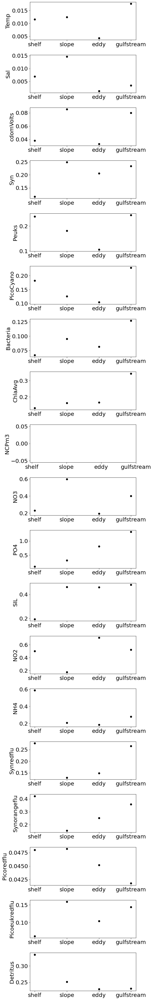

In [175]:
columns_to_plot = ['Temp', 'Sal', 'cdomVolts', 'Syn','Peuks', 'PicoCyano', 'Bacteria', 'ChlaAvg', 'NCPm3','NO3', 'PO4', 'SIL', 'NO2', 'NH4','Synredflu','Synorangeflu','Picoredflu','Picoeukredflu', 'Detritus']
scale_to_plot = ['log','log', 'log', 'log', 'linear', 'linear', 'linear','linear', 'linear', 'linear','linear', 'linear']
alpha_to_plot = [.02,.02,.02,.5,.5,.5,.5,.5,.1,.5,.5,.5,.5,.5,.5,.5,.5,.5,.5]
alpha_to_plot = [1]*len(alpha_to_plot)

fig, ax = plt.subplots(len(columns_to_plot),1, figsize=(8,50))

water_masses = ['shelf', 'slope', 'eddy', 'gulfstream']

for i, water_mass in enumerate(water_masses):
    for j, col in enumerate(columns_to_plot):
        if col in ['NO3', 'PO4', 'SIL', 'NO2', 'NH4']:
            ax[j].scatter([i], 
                          np.std((tsg_df_subset[tsg_df_subset.water_mass == water_mass][col+'a']+tsg_df_subset[tsg_df_subset.water_mass == water_mass][col+'b'])/2.0) / 
                              np.mean((tsg_df_subset[tsg_df_subset.water_mass == water_mass][col+'a']+tsg_df_subset[tsg_df_subset.water_mass == water_mass][col+'b'])/2.0)
                          , 
                          color='black', alpha=alpha_to_plot[j])

        else:
            ax[j].scatter([i], np.nanstd(tsg_df_subset[tsg_df_subset.water_mass == water_mass][col])/np.nanmean(tsg_df_subset[tsg_df_subset.water_mass == water_mass][col]), color='black', alpha=alpha_to_plot[j])
        
        ax[j].set_yscale('linear')#scale_to_plot[j])
        ax[j].set_ylabel(col)
        

# ax[j].plot([0,1,2,3], means, color='black', alpha=1)#, marker='o', markerfacecolor='None', markersize=10)
# ax[j].set_xticks([])

        ax[j].set_xticks([0,1,2,3])
        ax[j].xaxis.set_ticklabels(water_masses)

# ax[4+3].set_ylim(0.1,0.35)
# ax[2].set_ylim(0.08,0.2)
fig.tight_layout()
# fig.savefig('fcm_trends_across_features_four_class.png',dpi=600)

In [176]:
PPC = optical_df.loc[start_times[i]:end_times[i]]['agaus492']
PSC = optical_df.loc[start_times[i]:end_times[i]]['agaus523']
PE = optical_df.loc[start_times[i]:end_times[i]]['agaus550']
chlc = optical_df.loc[start_times[i]:end_times[i]]['agaus638']
chlb = optical_df.loc[start_times[i]:end_times[i]]['agaus660']

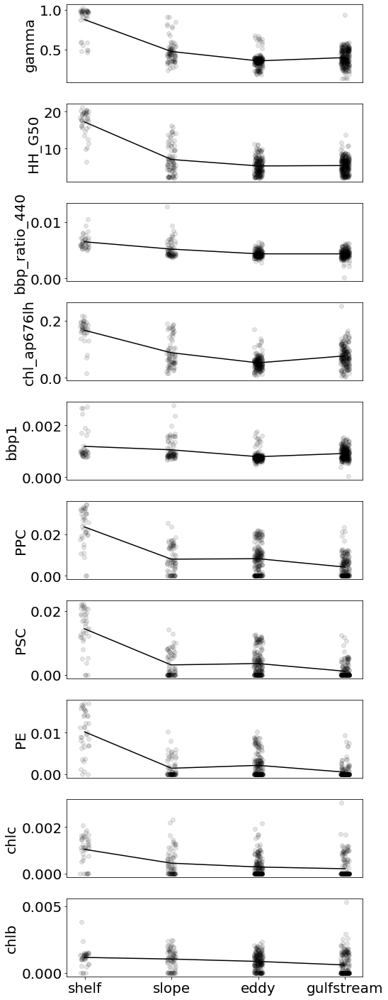

In [177]:
columns_to_plot = ['gamma', 'HH_G50', 'bbp_ratio_440', 'chl_ap676lh', 'bbp1','agaus492', 'agaus523', 'agaus550', 'agaus638', 'agaus660']
titles_to_plot = ['gamma', 'HH_G50', 'bbp_ratio_440', 'chl_ap676lh', 'bbp1','PPC', 'PSC', 'PE', 'chlc', 'chlb']

#scale_to_plot = ['log','log', 'log', 'log', 'linear', 'linear', 'linear']
#alpha_to_plot = [.02,.02,.02,.5,.5,.5,.5,.5,.1,.5,.5,.5,.5,.5]
alpha=0.1

fig, ax = plt.subplots(len(columns_to_plot),1, figsize=(8,20))

water_masses = ['shelf', 'slope', 'eddy', 'gulfstream']

for i, water_mass in enumerate(water_masses):
    for j, col in enumerate(columns_to_plot):
        ax[j].scatter(rand_jitter(np.array(len(optical_df_quality[optical_df_quality.water_mass == water_mass][col])*[i])), optical_df_quality[optical_df_quality.water_mass == water_mass][col], color='black', alpha=alpha)
        ax[j].set_yscale('linear')#scale_to_plot[j])
        ax[j].set_ylabel(titles_to_plot[j])
        
# for i, water_mass in enumerate(water_masses):
#         ax[j+1].scatter(rand_jitter(np.array(len(optical_df_quality[optical_df_quality.water_mass == water_mass][col])*[i])), optical_df_quality[optical_df_quality.water_mass == water_mass].HH_G50/optical_df_quality[optical_df_quality.water_mass == water_mass].chl_ap676lh, color='black', alpha=alpha)
#         ax[j+1].set_yscale('linear')#scale_to_plot[j])
#         ax[j+1].set_ylabel('HH_G50/chl_ap676lh')
        
for j, col in enumerate(columns_to_plot):
    means = []
    for wm in water_masses:
        means.append(np.nanmean(optical_df_quality[optical_df_quality.water_mass == wm][col]))
    ax[j].plot([0,1,2,3], means, color='black', alpha=1)#, marker='o', markerfacecolor='None', markersize=10)
    ax[j].xaxis.set_ticks([])

ax[j].set_xticks([0,1,2,3])
ax[j].xaxis.set_ticklabels(water_masses)

# means = []
# for wm in water_masses:
# #     means.append(np.mean(optical_df[optical_df.water_mass == wm].gamma/optical_df[optical_df.water_mass == wm].chl_ap676lh))
#     pass
# ax[j+1].plot([0,1,2,3], means, color='black', alpha=1)#, marker='o', markerfacecolor='None', markersize=10)
# ax[j+1].set_xticks([0,1,2,3])
# ax[j+1].xaxis.set_ticklabels(water_masses)

# ax[-1].set_ylim(0,20)
# ax[4+3].set_ylim(0.1,0.35)
# ax[2].set_ylim(0.08,0.2)
fig.tight_layout()
# fig.savefig('optical_fcm_trends_across_features.png',dpi=600)

### ACS Analysis

Making a lot of the supplemental figs for the optical data

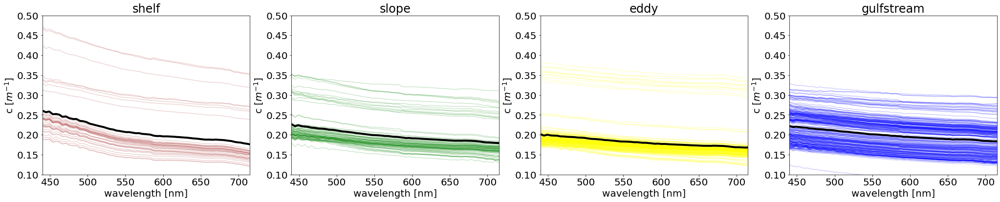

In [178]:
fig, ax = plt.subplots(1,4,figsize=(35,6))
wm_colors = ['brown', 'green', 'yellow', 'blue']
for idx, wm in enumerate(['shelf', 'slope', 'eddy', 'gulfstream']):
    optical_df_subset = optical_df_quality[optical_df_quality.water_mass == wm]
    for i in range(len(optical_df_subset)):
        if ~optical_df_subset.iloc[i,1+81:82+81].isnull().values.all():
            ax[idx].plot(acs_wavelength,optical_df_subset.iloc[i,1+81:82+81].rolling(window=1, win_type='triang').mean(), c=wm_colors[idx], alpha=.2)
    ax[idx].set_title(wm)
    
    optical_df_subset = optical_df_quality[optical_df_quality.water_mass == wm]
    ax[idx].plot(acs_wavelength,optical_df_subset.iloc[:,1+81:82+81].mean(axis=0).values, c='black', alpha=1, lw=4)
            

for a in [ax[0],ax[1],ax[2],ax[3]]:
#     a.legend() 
    a.set_ylim(0.1,.5)
    a.set_xlim(440,715)
    #ax.set_title('Particulate Abs')
    a.set_ylabel('c [$m^{-1}$]')
    a.set_xlabel('wavelength [nm]')  
# plt.title('Absorption colored by time (brown to blue) across a coastal to open ocean transect')
# plt.savefig('figs/watermasses_c_spec.png', dpi=300)
plt.show()

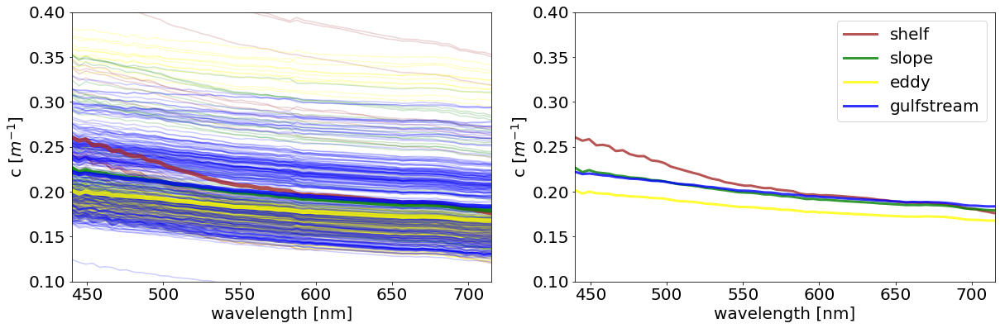

In [179]:
fig, ax = plt.subplots(1,2,figsize=(20,6))
wm_colors = ['brown', 'green', 'yellow', 'blue']
for idx, wm in enumerate(['shelf', 'slope', 'eddy', 'gulfstream']):
    optical_df_subset = optical_df_quality[optical_df_quality.water_mass == wm]
    for i in range(len(optical_df_subset)):
        if ~optical_df_subset.iloc[i,1+81:82+81].isnull().values.all():
            ax[0].plot(acs_wavelength,optical_df_subset.iloc[i,1+81:82+81].rolling(window=1, win_type='triang').mean(), c=wm_colors[idx], alpha=.2)
for idx, wm in enumerate(['shelf', 'slope', 'eddy', 'gulfstream']):
    optical_df_subset = optical_df_quality[optical_df_quality.water_mass == wm]
    ax[0].plot(acs_wavelength,optical_df_subset.iloc[:,1+81:82+81].mean(axis=0).values, c=wm_colors[idx], alpha=.8, lw=5)
    
for idx, wm in enumerate(['shelf', 'slope', 'eddy', 'gulfstream']):
    optical_df_subset = optical_df_quality[optical_df_quality.water_mass == wm]
    ax[1].plot(acs_wavelength,optical_df_subset.iloc[:,1+81:82+81].mean(axis=0).values, c=wm_colors[idx], alpha=.8, lw=3, label=wm)
ax[1].legend() 
for a in [ax[0],ax[1]]:
    a.set_ylim(0.1,.4)
    a.set_xlim(440,715)
    #ax.set_title('Particulate Abs')
    a.set_ylabel('c [$m^{-1}$]')
    a.set_xlabel('wavelength [nm]')  
# plt.title('Absorption colored by time (brown to blue) across a coastal to open ocean transect')
# plt.savefig('figs/watermasses_c_spec_together.png', dpi=300)
plt.show()

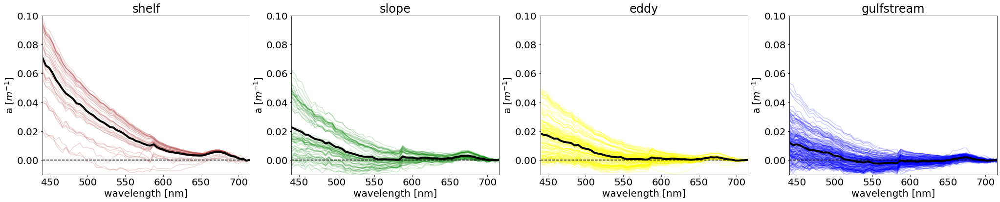

In [180]:
fig, ax = plt.subplots(1,4,figsize=(35,6))
wm_colors = ['brown', 'green', 'yellow', 'blue']
for idx, wm in enumerate(['shelf', 'slope', 'eddy', 'gulfstream']):
    optical_df_subset = optical_df_quality[optical_df_quality.water_mass == wm]
    for i in range(len(optical_df_subset)):
        if ~optical_df_subset.iloc[i,1+81:82+81].isnull().values.all():
            ax[idx].plot(acs_wavelength,optical_df_subset.iloc[i,1:82].rolling(window=1, win_type='triang').mean(), c=wm_colors[idx], alpha=.2)
    ax[idx].set_title(wm)
    
    optical_df_subset = optical_df_quality[optical_df_quality.water_mass == wm]
    ax[idx].plot(acs_wavelength,optical_df_subset.iloc[:,1:82].mean(axis=0).values, c='black', alpha=1, lw=4, label=wm)
            

for a in [ax[0],ax[1],ax[2],ax[3]]:
    a.axhline(0,c='k',ls='--')
    a.set_ylim(-0.01,.1)
    a.set_xlim(440,715)
    #ax.set_title('Particulate Abs')
    a.set_ylabel('a [$m^{-1}$]')
    a.set_xlabel('wavelength [nm]')  
# plt.title('Absorption colored by time (brown to blue) across a coastal to open ocean transect')
# plt.savefig('figs/watermasses_a_spec.png', dpi=300)
plt.show()

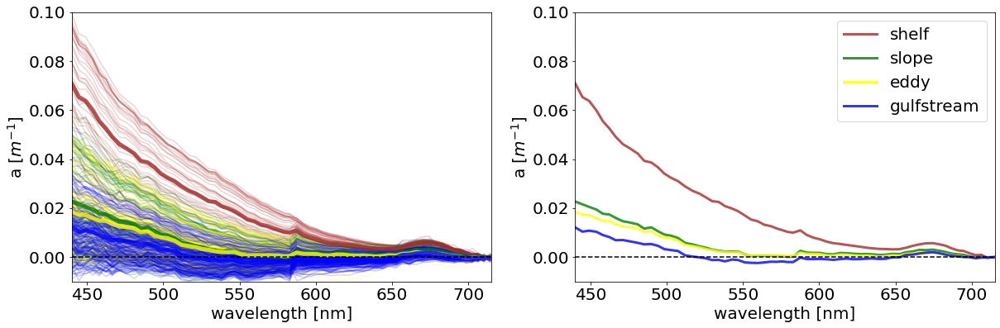

In [181]:
fig, ax = plt.subplots(1,2,figsize=(20,6))
wm_colors = ['brown', 'green', 'yellow', 'blue']
for idx, wm in enumerate(['shelf', 'slope', 'eddy', 'gulfstream']):
    optical_df_subset = optical_df_quality[optical_df_quality.water_mass == wm]
    for i in range(len(optical_df_subset)):
        if ~optical_df_subset.iloc[i,1+81:82+81].isnull().values.all():
            ax[0].plot(acs_wavelength,optical_df_subset.iloc[i,1:82].rolling(window=1, win_type='triang').mean(), c=wm_colors[idx], alpha=.2)
for idx, wm in enumerate(['shelf', 'slope', 'eddy', 'gulfstream']):
    optical_df_subset = optical_df_quality[optical_df_quality.water_mass == wm]
    ax[0].plot(acs_wavelength,optical_df_subset.iloc[:,1:82].mean(axis=0).values, c=wm_colors[idx], alpha=.8, lw=5)
    
for idx, wm in enumerate(['shelf', 'slope', 'eddy', 'gulfstream']):
    optical_df_subset = optical_df_quality[optical_df_quality.water_mass == wm]
    ax[1].plot(acs_wavelength,optical_df_subset.iloc[:,1:82].mean(axis=0).values, c=wm_colors[idx], alpha=.8, lw=3, label=wm)

ax[1].legend() 
    
for a in [ax[0],ax[1]]:
    a.axhline(0,c='k',ls='--')
    a.set_ylim(-0.01,.1)
    a.set_xlim(440,715)
    #ax.set_title('Particulate Abs')
    a.set_ylabel('a [$m^{-1}$]')
    a.set_xlabel('wavelength [nm]')  
# plt.title('Absorption colored by time (brown to blue) across a coastal to open ocean transect')
# plt.savefig('figs/watermasses_a_spec_together.png', dpi=300)
plt.show()

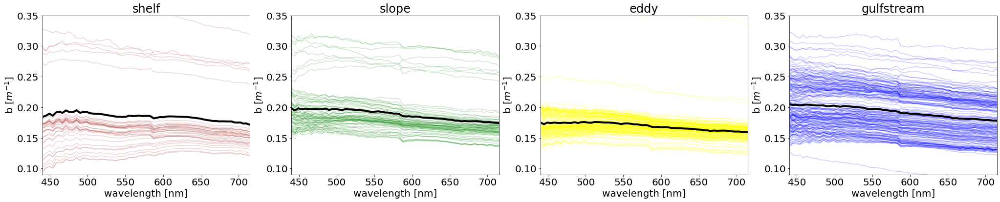

In [182]:
fig, ax = plt.subplots(1,4,figsize=(35,6))
wm_colors = ['brown', 'green', 'yellow', 'blue']
for idx, wm in enumerate(['shelf', 'slope', 'eddy', 'gulfstream']):
    optical_df_subset = optical_df_quality[optical_df_quality.water_mass == wm]
    for i in range(len(optical_df_subset)):
        if ~optical_df_subset.iloc[i,1+81:82+81].isnull().values.all():
            ax[idx].plot(acs_wavelength,optical_df_subset.iloc[i,1+81:82+81].values-optical_df_subset.iloc[i,1:82].values, c=wm_colors[idx], alpha=.2)
    ax[idx].set_title(wm)
    
    optical_df_subset = optical_df_quality[optical_df_quality.water_mass == wm]
    ax[idx].plot(acs_wavelength,np.nanmean((optical_df_subset.iloc[:,1+81:82+81].values-optical_df_subset.iloc[:,1:82].values),axis=0), c='black', alpha=1, lw=4,label=wm)
            

for a in [ax[0],ax[1],ax[2],ax[3]]:
    a.set_ylim(0.09,.35)
    a.set_xlim(440,715)
    #ax.set_title('Particulate Abs')
    a.set_ylabel('b [$m^{-1}$]')
    a.set_xlabel('wavelength [nm]')  
# plt.title('Absorption colored by time (brown to blue) across a coastal to open ocean transect')
# plt.savefig('figs/watermasses_b_spec.png', dpi=300)
plt.show()

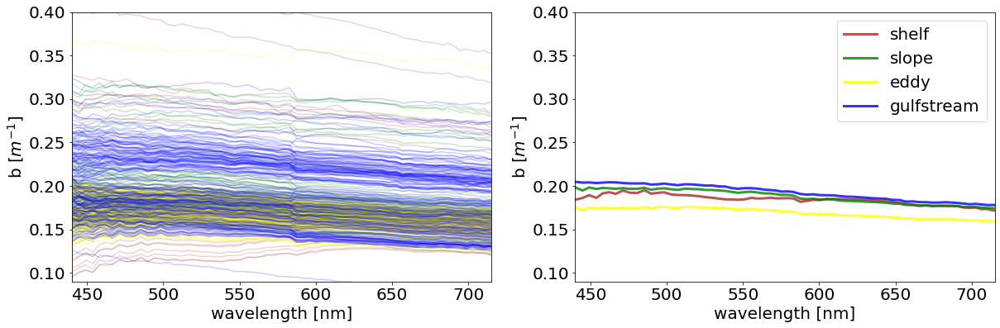

In [183]:
fig, ax = plt.subplots(1,2,figsize=(20,6))
wm_colors = ['brown', 'green', 'yellow', 'blue']
for idx, wm in enumerate(['shelf', 'slope', 'eddy', 'gulfstream']):
    optical_df_subset = optical_df_quality[optical_df_quality.water_mass == wm]
    for i in range(len(optical_df_subset)):
        if ~optical_df_subset.iloc[i,1+81:82+81].isnull().values.all():
            ax[0].plot(acs_wavelength,optical_df_subset.iloc[i,1+81:82+81].values-optical_df_subset.iloc[i,1:82].values, c=wm_colors[idx], alpha=.2)
for idx, wm in enumerate(['shelf', 'slope', 'eddy', 'gulfstream']):
    optical_df_subset = optical_df_quality[optical_df_quality.water_mass == wm]
    ax[0].plot(acs_wavelength,acs_wavelength,np.nanmean((optical_df_subset.iloc[:,1+81:82+81].values-optical_df_subset.iloc[:,1:82].values),axis=0), c=wm_colors[idx], alpha=.8, lw=5)
    
for idx, wm in enumerate(['shelf', 'slope', 'eddy', 'gulfstream']):
    optical_df_subset = optical_df_quality[optical_df_quality.water_mass == wm]
    ax[1].plot(acs_wavelength,np.nanmean((optical_df_subset.iloc[:,1+81:82+81].values-optical_df_subset.iloc[:,1:82].values),axis=0), c=wm_colors[idx], alpha=.8, lw=3,label=wm)
ax[1].legend()    
for a in [ax[0],ax[1]]:
#     a.axhline(0,c='k',ls='--')
    a.set_ylim(0.09,.4)
    a.set_xlim(440,715)
    #ax.set_title('Particulate Abs')
    a.set_ylabel('b [$m^{-1}$]')
    a.set_xlabel('wavelength [nm]')  
# plt.title('Absorption colored by time (brown to blue) across a coastal to open ocean transect')
# plt.savefig('figs/watermasses_b_spec_together.png', dpi=300)
plt.show()